In [1]:
import numpy as np 
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import warnings
warnings.filterwarnings('ignore')
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
def simulations(pi_1, mu_1, mu_0, dim, sigma_1, sigma_0, N):
    """
   generate similated data points

         X, y = simulations(pi, mu_1, mu_0, dim, sigma_1, sigma_0, N = 1000)

     Inputs:
             pi_1: prior probability for Y = 1
             mu_1, mu_0:   means for X|Y=1 and X|Y=0
             dim:   dimension of the feature space of X
             sigma_1, sigma_0: standard deviations for X|Y=1 and X|Y=0
             N: number of data points

     Outputs:
            X: data points with features
            y: classification results
    """ 
    # generate y from Bernolli(pi) as a vector with N entries
    y = np.random.binomial(1, pi_1, N)
    X = np.zeros([N, dim]) # initialize X
    num_1 = np.sum(y == 1)
    num_0 = np.sum(y == 0)
    X[y == 1] = np.random.multivariate_normal(mean = mu_1, cov = sigma_1, size = num_1)
    X[y == 0] = np.random.multivariate_normal(mean = mu_0, cov = sigma_0, size = num_0)
    return X, y

In [3]:
# import baseline models
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn import model_selection
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from imblearn.over_sampling import SMOTE  
from imblearn.pipeline import Pipeline as Pipeline
from sklearn.datasets import make_classification
from sklearn.model_selection import (GridSearchCV,StratifiedKFold)
# scale and split
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [4]:
def Find_Optimal_Cutoff(target, predicted):
    """ Find the optimal probability cutoff point for a classification model related to event rate
    Parameters
    ----------
    target : Matrix with dependent or target data, where rows are observations

    predicted : Matrix with predicted data, where rows are observations

    Returns
    -------     
    list type, with optimal cutoff value

    """
    fpr, tpr, threshold = roc_curve(target, predicted)
    i = np.arange(len(tpr)) 
    roc = pd.DataFrame({'tf' : pd.Series(tpr-(1-fpr), index=i), 'threshold' : pd.Series(threshold, index=i)})
    roc_t = roc.ix[(roc.tf-0).abs().argsort()[:1]]

    return list(roc_t['threshold']) 

In [5]:
from sklearn.metrics import roc_auc_score, average_precision_score, f1_score, log_loss, recall_score, precision_recall_curve, auc
from sklearn.metrics import roc_curve, accuracy_score
seed=7
models = [] # Here I will append all the algorithms that I will use. Each one will run in all the created datasets.
models.append(('LR', LogisticRegression())) 
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('NB', GaussianNB()))
models.append(('RF', RandomForestClassifier()))
#models.append(('SVM', SVC()))
models.append(('AdaBoost', AdaBoostClassifier()))

In [16]:
def simulation_results(pi_1, mu, dim, N):
    """
   generate similated data points, then get socres and plots

         simulation_results(dim = 10, mu = 1)

     Inputs:
             pi_1: prior probability for Y = 1
             mu:   means for X|Y=1 and X|Y=0 are (mu, 0, ...,0) and (-mu, 0, ...,0) respectively
             dim:   dimension of the feature space of X
             N: number of data points

     Outputs:
            X: data points with features
            y: classification results
    """ 
    # initialization
    mu_1 = np.zeros(dim,)
    mu_1[0] = mu
    mu_0 = np.zeros(dim,)
    mu_0[0] = -mu
    sigma_1 = np.identity(dim)
    sigma_0 = np.identity(dim)
    X, y = simulations(pi_1, mu_1, mu_0, dim, sigma_1, sigma_0, N)
    # class distribution
    ratio = y.sum()/len(y)
    print('Positive ratio for pi_1 =',pi_1, ', mu =', mu,', dim =',dim,' is',ratio,'.')
    # scale and fit
    scaler.fit(X)
    X_scaled = scaler.transform(X)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.33, random_state=444, stratify=y)
    # compare different classifiers
    results_accuracy=[]
    results_auroc=[]
    results_average_precision=[]
    results_neg_log_loss=[]
    results_f1 = []
    results_recall =[]
    names=[]
    measures = ['AUROC','AUPRC','accuracy_best_threshold','accuracy','average_precision','f1','log_loss_score','recall']
    scores_table = np.zeros([7,8])
    i = 0 # looping index
    for name, model in models:
            y_pred_proba = model.fit(X_train, y_train).predict_proba(X_test)[:, 1]
            fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
            #Area under ROC curve
            auroc = roc_auc_score(y_test,y_pred_proba)
            plt.plot([0,1],[0,1],'k--')
            plt.plot(fpr,tpr, label=name)
            plt.xlabel('fpr')
            plt.ylabel('tpr')
            title_name = name + '_pi_1' + str(pi_1) + '_mu' + str(mu) + '_dim' + str(dim) + ' ROC curve, AUROC ='+str(auroc)
            plt.title(title_name)
            save_name = name + '_pi_1' + str(pi_1) + '_mu' + str(mu) + '_dim' + str(dim) + ' simulation ROC curve.png'
            plt.savefig(save_name)
            plt.show()
            print('AUROC = ',auroc)
            precision, recall, thresholds = precision_recall_curve(y_test,y_pred_proba)
            auprc = auc(recall, precision)
            plt.axhline(y=ratio, xmin=0, xmax=1,color='k', linestyle = '--')
            plt.plot(recall,precision, label=name)
            plt.xlabel('recall')
            plt.ylabel('precision')
            title_name = name + '_pi_1' + str(pi_1) + '_mu' + str(mu) + '_dim' + str(dim) + ' PRC curve, AUPRC ='+str(auprc)
            plt.title(title_name)
            save_name = name + '_pi_1' + str(pi_1) + '_mu' + str(mu) + '_dim' + str(dim) + ' simulation PRC curve.png'
            plt.savefig(save_name)
            plt.show()
            print('AUPRC = ',auprc)
            threshold = Find_Optimal_Cutoff(y_test,y_pred_proba)
            y_pred = y_pred_proba>threshold
            accuracy_best_threshold = accuracy_score(y_test, y_pred)
            accuracy = accuracy_score(y_test, model.predict(X_test))
            average_precision = average_precision_score(y_test, model.predict(X_test))
            f1 = f1_score(y_test, model.predict(X_test))
            log_loss_score = log_loss(y_test, model.predict(X_test))
            recall = recall_score(y_test, model.predict(X_test))
            names.append(name)


            # report of scores
            scores_table[i, 0] = auroc
            scores_table[i, 1] = auprc
            scores_table[i, 2] = accuracy_best_threshold
            scores_table[i, 3] = accuracy
            scores_table[i, 4] = average_precision
            scores_table[i, 5] = f1
            scores_table[i, 6] = -log_loss_score
            scores_table[i, 7] = recall
            print(name,' for train_test split: AUROC = ',auroc,', AUPRC = ',auprc,', average precision = ,',average_precision,
                  '. \nBest threshold for ROC = ',threshold[0], ', accuracy for the best ROC threshold is then '
                  ,accuracy_best_threshold,', accuracy = ', accuracy,
                  '. \nF1 score = ', f1, ', log loss = ',log_loss_score,', recall =', recall,'.')
            print ("--"*30)
            i = i + 1
            
    for i in range(8):
        print('The best model measured by ',measures[i],'is ',names[np.argmax(scores_table[:,i])]) 
    csv_name = 'Simulation with pi_1' + str(pi_1) + '_mu' + str(mu) + '_dim' + str(dim) + '.csv'
    np.savetxt(csv_name, scores_table, delimiter=",")

Positive ratio for pi_1 = 0.5 , mu = 1 , dim = 10  is 0.515 .


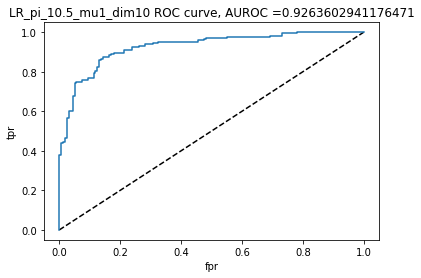

AUROC =  0.9263602941176471


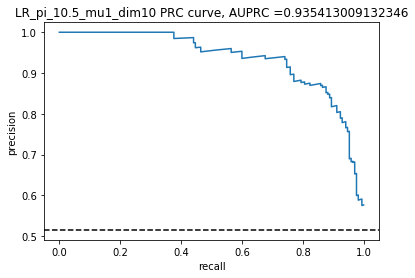

AUPRC =  0.935413009132346
LR  for train_test split: AUROC =  0.9263602941176471 , AUPRC =  0.935413009132346 , average precision = , 0.8077300150829563 . 
Best threshold for ROC =  0.35826692610914435 , accuracy for the best ROC threshold is then  0.8606060606060606 , accuracy =  0.8424242424242424 . 
F1 score =  0.8404907975460123 , log loss =  5.442519893595543 , recall = 0.8058823529411765 .
------------------------------------------------------------


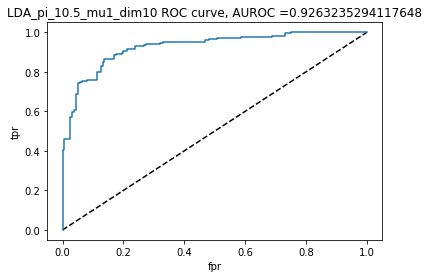

AUROC =  0.9263235294117648


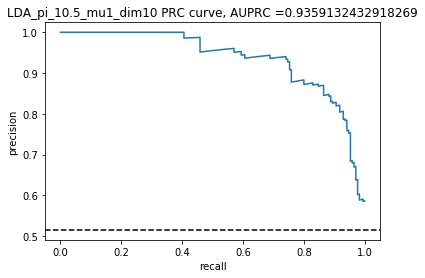

AUPRC =  0.9359132432918269
LDA  for train_test split: AUROC =  0.9263235294117648 , AUPRC =  0.9359132432918269 , average precision = , 0.8087377661184543 . 
Best threshold for ROC =  0.3642542196930737 , accuracy for the best ROC threshold is then  0.8606060606060606 , accuracy =  0.8454545454545455 . 
F1 score =  0.8449848024316109 , log loss =  5.337859357845602 , recall = 0.8176470588235294 .
------------------------------------------------------------


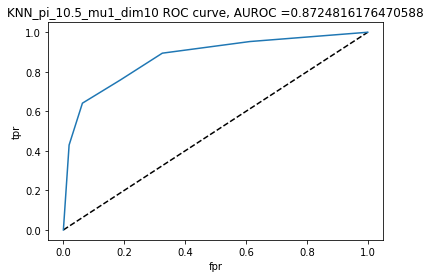

AUROC =  0.8724816176470588


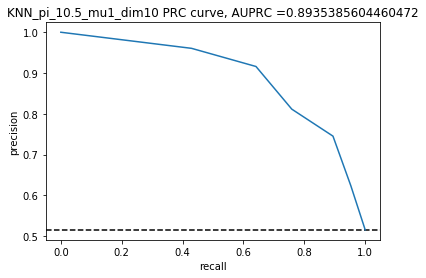

AUPRC =  0.8935385604460472
KNN  for train_test split: AUROC =  0.8724816176470588 , AUPRC =  0.8935385604460472 , average precision = , 0.7398917028217805 . 
Best threshold for ROC =  0.6 , accuracy for the best ROC threshold is then  0.7848484848484848 , accuracy =  0.7848484848484848 . 
F1 score =  0.7841945288753799 , log loss =  7.431142763519892 , recall = 0.7588235294117647 .
------------------------------------------------------------


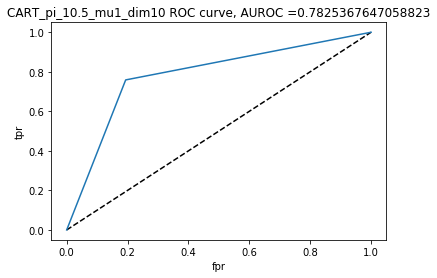

AUROC =  0.7825367647058823


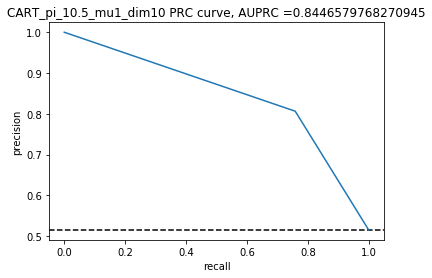

AUPRC =  0.8446579768270945
CART  for train_test split: AUROC =  0.7825367647058823 , AUPRC =  0.8446579768270945 , average precision = , 0.7360438948306596 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.48484848484848486 , accuracy =  0.7818181818181819 . 
F1 score =  0.7818181818181819 , log loss =  7.535808145314864 , recall = 0.7588235294117647 .
------------------------------------------------------------


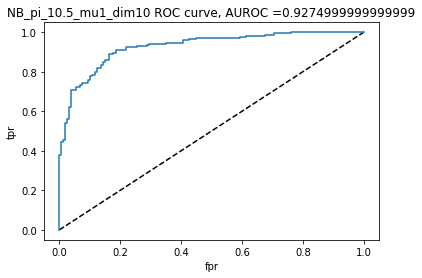

AUROC =  0.9274999999999999


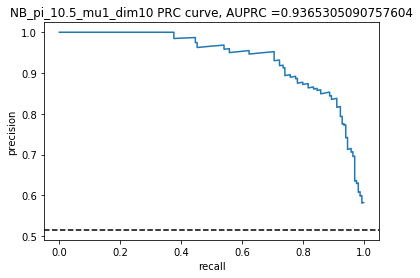

AUPRC =  0.9365305090757604
NB  for train_test split: AUROC =  0.9274999999999999 , AUPRC =  0.9365305090757604 , average precision = , 0.803222180591982 . 
Best threshold for ROC =  0.4014230179115728 , accuracy for the best ROC threshold is then  0.8515151515151516 , accuracy =  0.8393939393939394 . 
F1 score =  0.8379204892966361 , log loss =  5.5471852753905155 , recall = 0.8058823529411765 .
------------------------------------------------------------


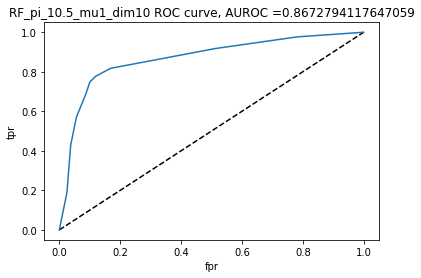

AUROC =  0.8672794117647059


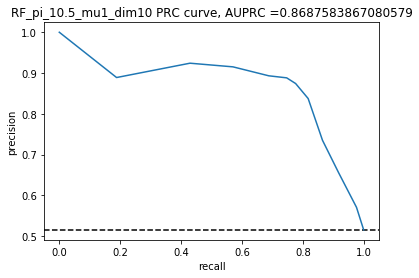

AUPRC =  0.8687583867080579
RF  for train_test split: AUROC =  0.8672794117647059 , AUPRC =  0.8687583867080579 , average precision = , 0.793774852598382 . 
Best threshold for ROC =  0.4 , accuracy for the best ROC threshold is then  0.8272727272727273 , accuracy =  0.8212121212121212 . 
F1 score =  0.8115015974440895 , log loss =  6.175153335935192 , recall = 0.7470588235294118 .
------------------------------------------------------------


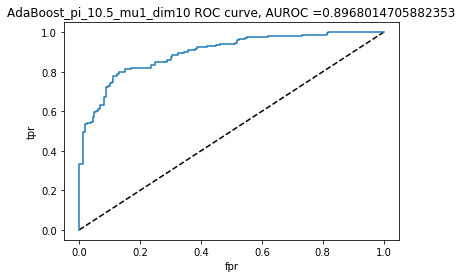

AUROC =  0.8968014705882353


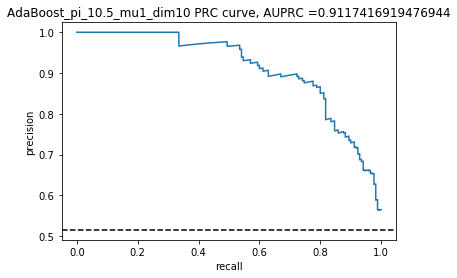

AUPRC =  0.9117416919476944
AdaBoost  for train_test split: AUROC =  0.8968014705882353 , AUPRC =  0.9117416919476944 , average precision = , 0.7939205061916398 . 
Best threshold for ROC =  0.49610840560251823 , accuracy for the best ROC threshold is then  0.8212121212121212 , accuracy =  0.8272727272727273 . 
F1 score =  0.8224299065420562 , log loss =  5.965834687457826 , recall = 0.7764705882352941 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  LR
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LDA


In [17]:
# can tune parameters here and see different results
simulation_results(pi_1 = 0.5, mu = 1, dim = 10, N = 1000)

Positive ratio for pi_1 = 0.1 , mu = 0.2 , dim = 2  is 0.093 .


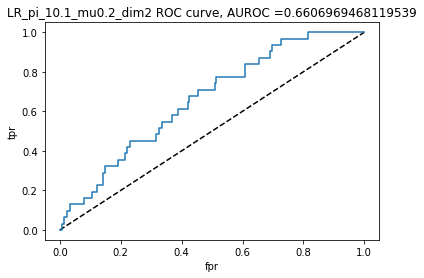

AUROC =  0.6606969468119539


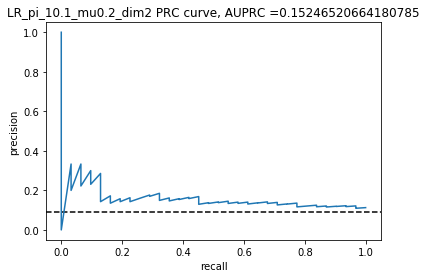

AUPRC =  0.15246520664180785
LR  for train_test split: AUROC =  0.6606969468119539 , AUPRC =  0.15246520664180785 , average precision = , 0.09393939393939393 . 
Best threshold for ROC =  0.10145638120526278 , accuracy for the best ROC threshold is then  0.6090909090909091 , accuracy =  0.906060606060606 . 
F1 score =  0.0 , log loss =  3.244551721946156 , recall = 0.0 .
------------------------------------------------------------


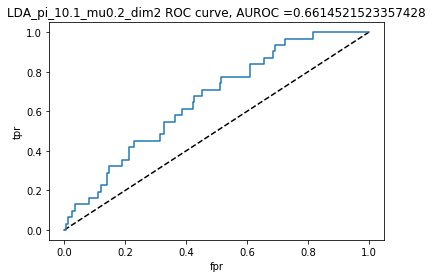

AUROC =  0.6614521523357428


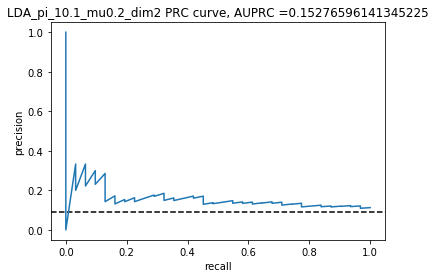

AUPRC =  0.15276596141345225
LDA  for train_test split: AUROC =  0.6614521523357428 , AUPRC =  0.15276596141345225 , average precision = , 0.09393939393939393 . 
Best threshold for ROC =  0.09792892723262259 , accuracy for the best ROC threshold is then  0.6090909090909091 , accuracy =  0.906060606060606 . 
F1 score =  0.0 , log loss =  3.244551721946156 , recall = 0.0 .
------------------------------------------------------------


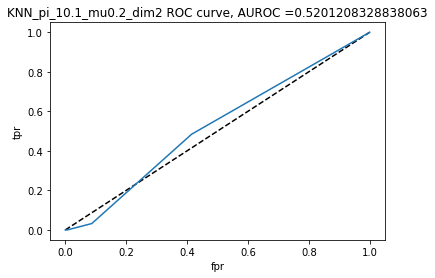

AUROC =  0.5201208328838063


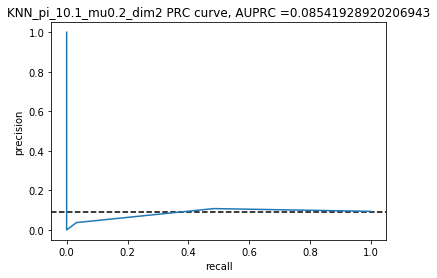

AUPRC =  0.08541928920206943
KNN  for train_test split: AUROC =  0.5201208328838063 , AUPRC =  0.08541928920206943 , average precision = , 0.09393939393939393 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8303030303030303 , accuracy =  0.9 . 
F1 score =  0.0 , log loss =  3.4538824855361008 , recall = 0.0 .
------------------------------------------------------------


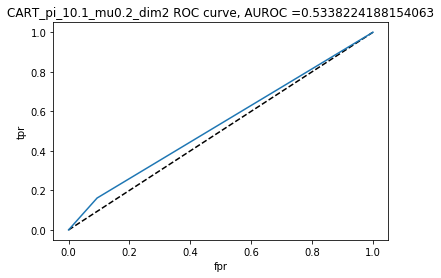

AUROC =  0.5338224188154063


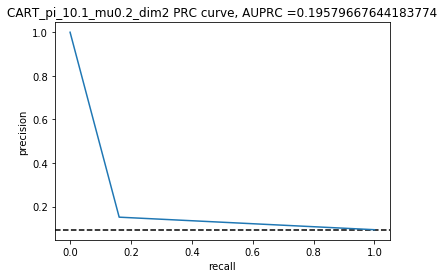

AUPRC =  0.19579667644183774
CART  for train_test split: AUROC =  0.5338224188154063 , AUPRC =  0.19579667644183774 , average precision = , 0.10322580645161289 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.906060606060606 , accuracy =  0.8363636363636363 . 
F1 score =  0.15625 , log loss =  5.651867618343098 , recall = 0.16129032258064516 .
------------------------------------------------------------


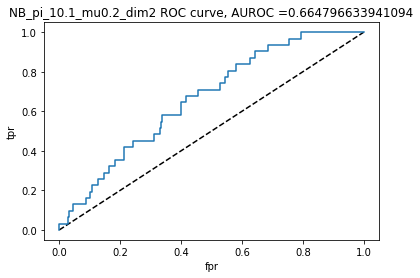

AUROC =  0.664796633941094


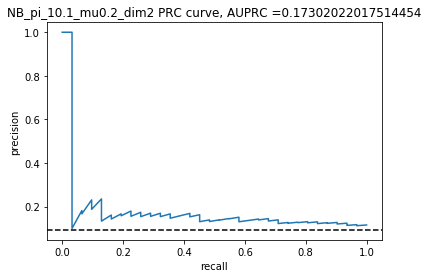

AUPRC =  0.17302022017514454
NB  for train_test split: AUROC =  0.664796633941094 , AUPRC =  0.17302022017514454 , average precision = , 0.09393939393939393 . 
Best threshold for ROC =  0.09938113446707811 , accuracy for the best ROC threshold is then  0.6 , accuracy =  0.906060606060606 . 
F1 score =  0.0 , log loss =  3.244551721946156 , recall = 0.0 .
------------------------------------------------------------


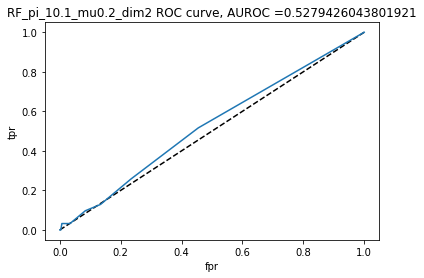

AUROC =  0.5279426043801921


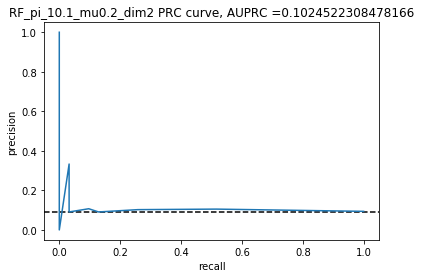

AUPRC =  0.1024522308478166
RF  for train_test split: AUROC =  0.5279426043801921 , AUPRC =  0.1024522308478166 , average precision = , 0.09551738583996648 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.7181818181818181 , accuracy =  0.8909090909090909 . 
F1 score =  0.052631578947368425 , log loss =  3.7678810539435332 , recall = 0.03225806451612903 .
------------------------------------------------------------


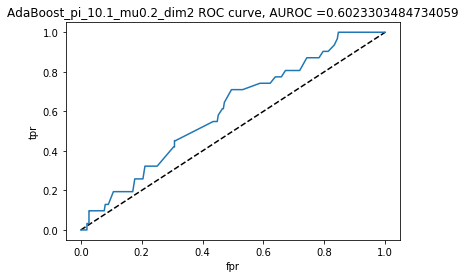

AUROC =  0.6023303484734059


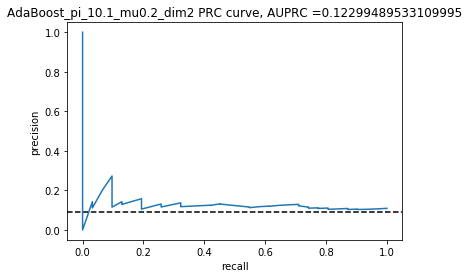

AUPRC =  0.12299489533109995
AdaBoost  for train_test split: AUROC =  0.6023303484734059 , AUPRC =  0.12299489533109995 , average precision = , 0.09393939393939393 . 
Best threshold for ROC =  0.4872750493666089 , accuracy for the best ROC threshold is then  0.5545454545454546 , accuracy =  0.9 . 
F1 score =  0.0 , log loss =  3.4538824855361003 , recall = 0.0 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.2 , dim = 4  is 0.107 .


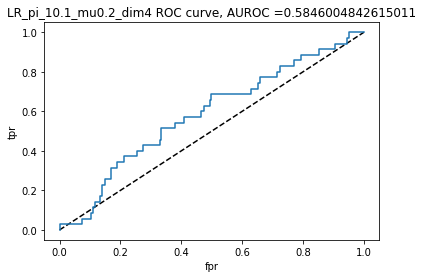

AUROC =  0.5846004842615011


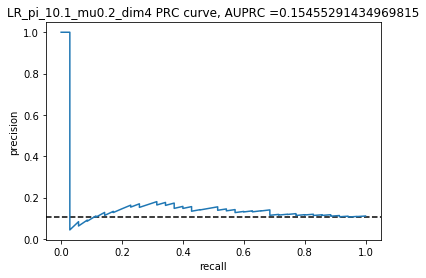

AUPRC =  0.15455291434969815
LR  for train_test split: AUROC =  0.5846004842615011 , AUPRC =  0.15455291434969815 , average precision = , 0.1316017316017316 . 
Best threshold for ROC =  0.10845251370097014 , accuracy for the best ROC threshold is then  0.5848484848484848 , accuracy =  0.896969696969697 . 
F1 score =  0.05555555555555556 , log loss =  3.5585405982635256 , recall = 0.02857142857142857 .
------------------------------------------------------------


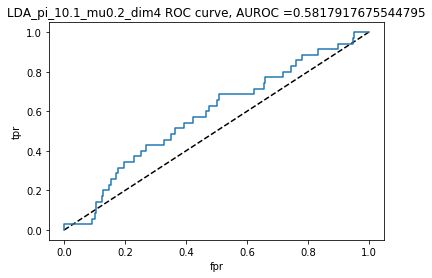

AUROC =  0.5817917675544795


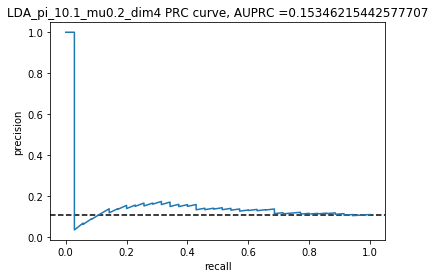

AUPRC =  0.15346215442577707
LDA  for train_test split: AUROC =  0.5817917675544795 , AUPRC =  0.15346215442577707 , average precision = , 0.1316017316017316 . 
Best threshold for ROC =  0.10395095570287567 , accuracy for the best ROC threshold is then  0.5727272727272728 , accuracy =  0.896969696969697 . 
F1 score =  0.05555555555555556 , log loss =  3.5585405982635256 , recall = 0.02857142857142857 .
------------------------------------------------------------


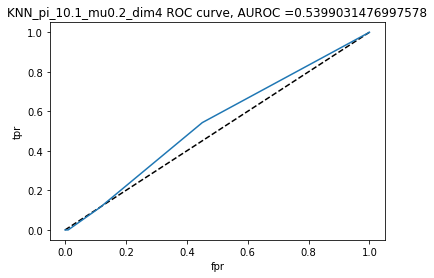

AUROC =  0.5399031476997578


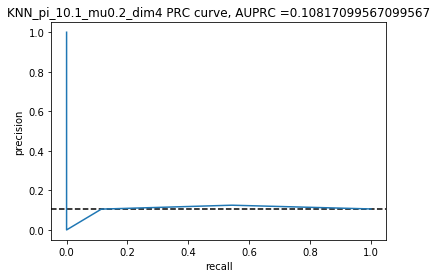

AUPRC =  0.10817099567099567
KNN  for train_test split: AUROC =  0.5399031476997578 , AUPRC =  0.10817099567099567 , average precision = , 0.10606060606060606 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.803030303030303 , accuracy =  0.8848484848484849 . 
F1 score =  0.0 , log loss =  3.9771997024208994 , recall = 0.0 .
------------------------------------------------------------


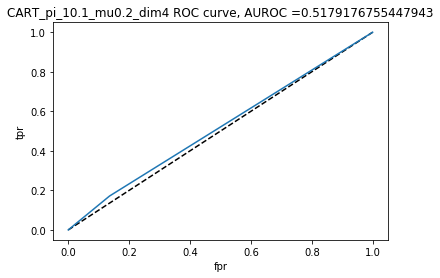

AUROC =  0.5179176755447943


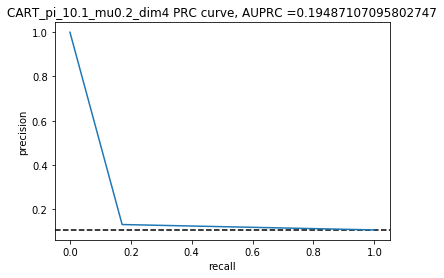

AUPRC =  0.19487107095802747
CART  for train_test split: AUROC =  0.5179176755447943 , AUPRC =  0.19487107095802747 , average precision = , 0.11023903632599284 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8939393939393939 , accuracy =  0.7909090909090909 . 
F1 score =  0.14814814814814817 , log loss =  7.2218410762001355 , recall = 0.17142857142857143 .
------------------------------------------------------------


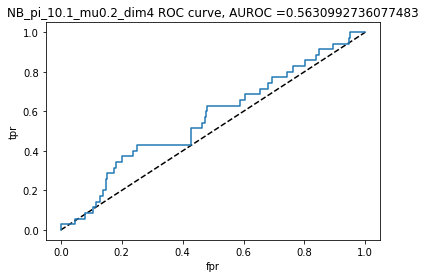

AUROC =  0.5630992736077483


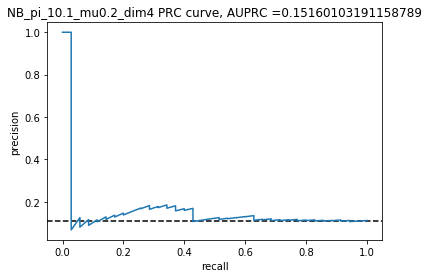

AUPRC =  0.15160103191158789
NB  for train_test split: AUROC =  0.5630992736077483 , AUPRC =  0.15160103191158789 , average precision = , 0.1316017316017316 . 
Best threshold for ROC =  0.10077289025332604 , accuracy for the best ROC threshold is then  0.5333333333333333 , accuracy =  0.896969696969697 . 
F1 score =  0.05555555555555556 , log loss =  3.5585405982635256 , recall = 0.02857142857142857 .
------------------------------------------------------------


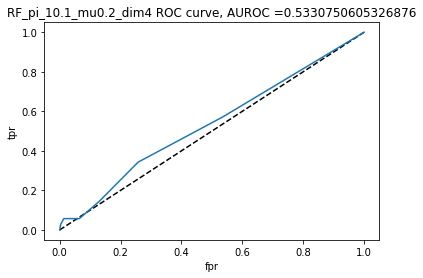

AUROC =  0.5330750605326876


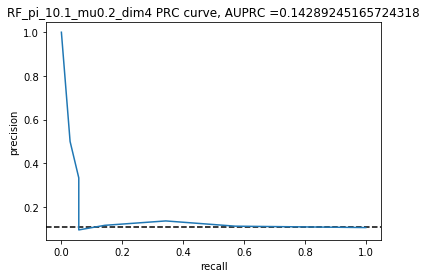

AUPRC =  0.14289245165724318
RF  for train_test split: AUROC =  0.5330750605326876 , AUPRC =  0.14289245165724318 , average precision = , 0.11731601731601732 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.7 , accuracy =  0.8939393939393939 . 
F1 score =  0.05405405405405405 , log loss =  3.6632059800584984 , recall = 0.02857142857142857 .
------------------------------------------------------------


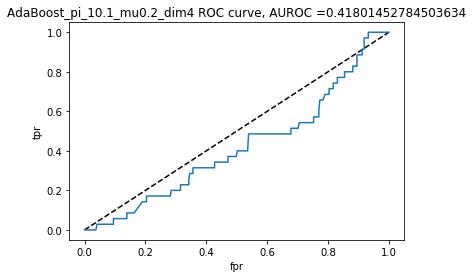

AUROC =  0.41801452784503634


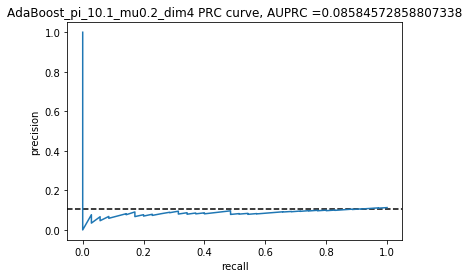

AUPRC =  0.08584572858807338
AdaBoost  for train_test split: AUROC =  0.41801452784503634 , AUPRC =  0.08584572858807338 , average precision = , 0.10606060606060606 . 
Best threshold for ROC =  0.48624200849976956 , accuracy for the best ROC threshold is then  0.4575757575757576 , accuracy =  0.8909090909090909 . 
F1 score =  0.0 , log loss =  3.7678689388309548 , recall = 0.0 .
------------------------------------------------------------
The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.2 , dim = 6  is 0.109 .


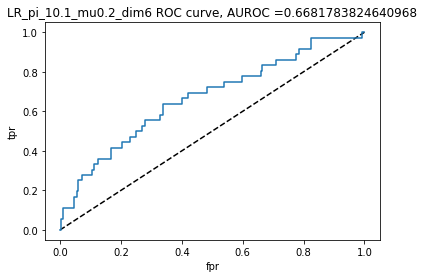

AUROC =  0.6681783824640968


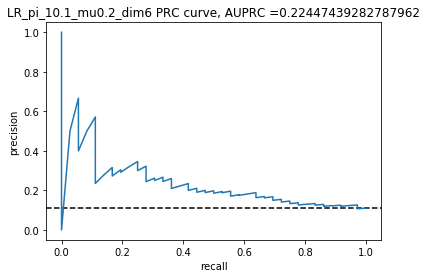

AUPRC =  0.22447439282787962
LR  for train_test split: AUROC =  0.6681783824640968 , AUPRC =  0.22447439282787962 , average precision = , 0.10909090909090909 . 
Best threshold for ROC =  0.11796403071133542 , accuracy for the best ROC threshold is then  0.6575757575757576 , accuracy =  0.8909090909090909 . 
F1 score =  0.0 , log loss =  3.767866515808439 , recall = 0.0 .
------------------------------------------------------------


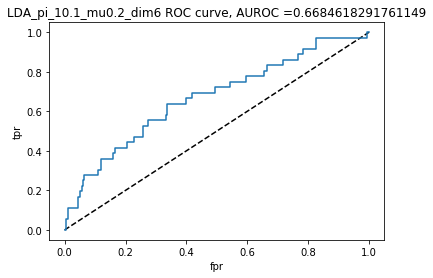

AUROC =  0.6684618291761149


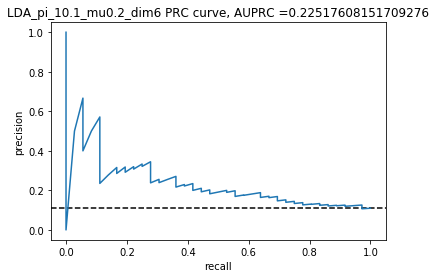

AUPRC =  0.22517608151709276
LDA  for train_test split: AUROC =  0.6684618291761149 , AUPRC =  0.22517608151709276 , average precision = , 0.10909090909090909 . 
Best threshold for ROC =  0.11442595047942339 , accuracy for the best ROC threshold is then  0.6575757575757576 , accuracy =  0.8909090909090909 . 
F1 score =  0.0 , log loss =  3.767866515808439 , recall = 0.0 .
------------------------------------------------------------


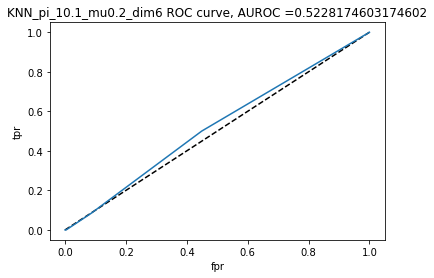

AUROC =  0.5228174603174602


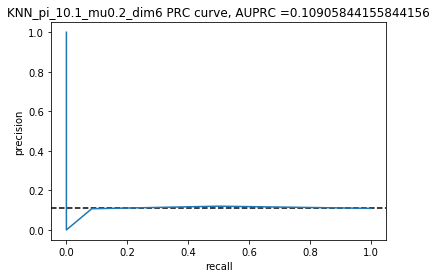

AUPRC =  0.10905844155844156
KNN  for train_test split: AUROC =  0.5228174603174602 , AUPRC =  0.10905844155844156 , average precision = , 0.10909090909090909 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8242424242424242 , accuracy =  0.8878787878787879 . 
F1 score =  0.0 , log loss =  3.8725318976034115 , recall = 0.0 .
------------------------------------------------------------


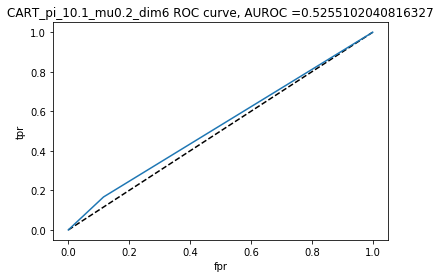

AUROC =  0.5255102040816327


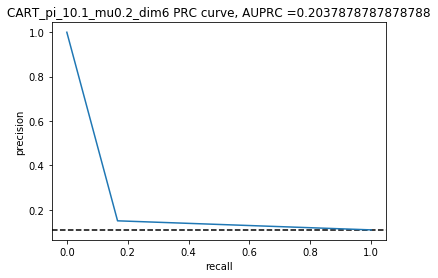

AUPRC =  0.2037878787878788
CART  for train_test split: AUROC =  0.5255102040816327 , AUPRC =  0.2037878787878788 , average precision = , 0.1159090909090909 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8909090909090909 , accuracy =  0.806060606060606 . 
F1 score =  0.15789473684210525 , log loss =  6.698511744202758 , recall = 0.16666666666666666 .
------------------------------------------------------------


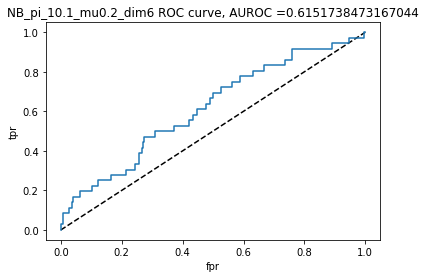

AUROC =  0.6151738473167044


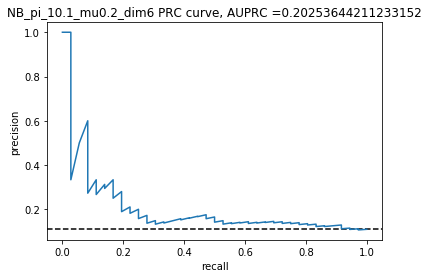

AUPRC =  0.20253644211233152
NB  for train_test split: AUROC =  0.6151738473167044 , AUPRC =  0.20253644211233152 , average precision = , 0.10909090909090909 . 
Best threshold for ROC =  0.11091401348646208 , accuracy for the best ROC threshold is then  0.5666666666666667 , accuracy =  0.8909090909090909 . 
F1 score =  0.0 , log loss =  3.767866515808439 , recall = 0.0 .
------------------------------------------------------------


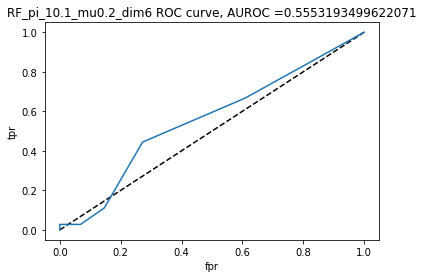

AUROC =  0.5553193499622071


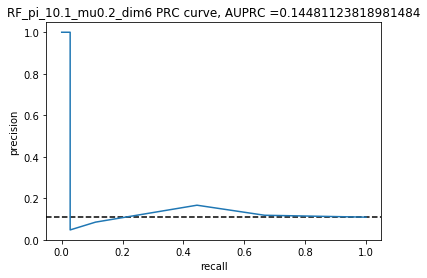

AUPRC =  0.14481123818981484
RF  for train_test split: AUROC =  0.5553193499622071 , AUPRC =  0.14481123818981484 , average precision = , 0.11531986531986531 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.696969696969697 , accuracy =  0.8878787878787879 . 
F1 score =  0.05128205128205128 , log loss =  3.872534320625927 , recall = 0.027777777777777776 .
------------------------------------------------------------


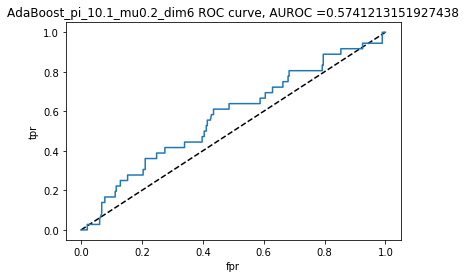

AUROC =  0.5741213151927438


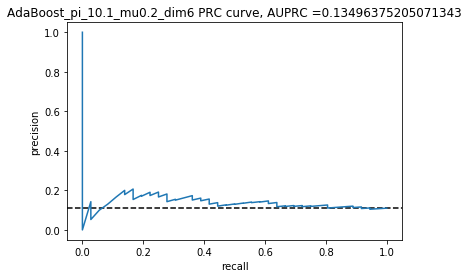

AUPRC =  0.13496375205071343
AdaBoost  for train_test split: AUROC =  0.5741213151927438 , AUPRC =  0.13496375205071343 , average precision = , 0.10914702581369247 . 
Best threshold for ROC =  0.4864486660748292 , accuracy for the best ROC threshold is then  0.5727272727272728 , accuracy =  0.8696969696969697 . 
F1 score =  0.04444444444444444 , log loss =  4.5005266113957605 , recall = 0.027777777777777776 .
------------------------------------------------------------
The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.2 , dim = 8  is 0.09 .


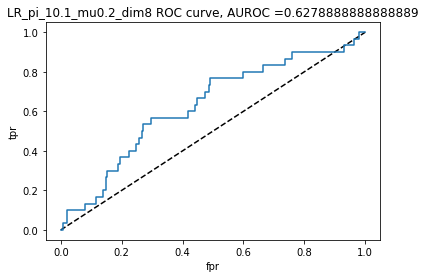

AUROC =  0.6278888888888889


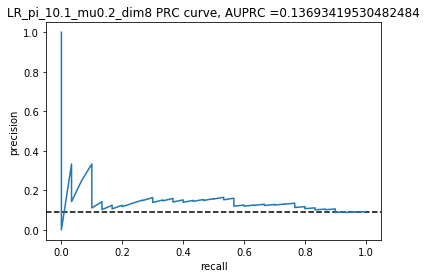

AUPRC =  0.13693419530482484
LR  for train_test split: AUROC =  0.6278888888888889 , AUPRC =  0.13693419530482484 , average precision = , 0.09090909090909091 . 
Best threshold for ROC =  0.08473201141660798 , accuracy for the best ROC threshold is then  0.5848484848484848 , accuracy =  0.9090909090909091 . 
F1 score =  0.0 , log loss =  3.139888763173699 , recall = 0.0 .
------------------------------------------------------------


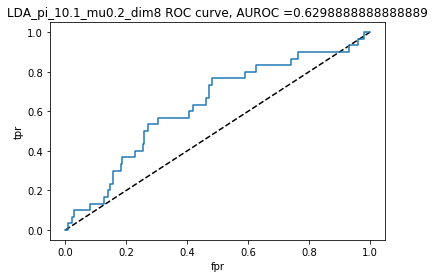

AUROC =  0.6298888888888889


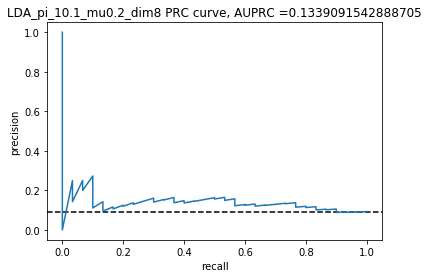

AUPRC =  0.1339091542888705
LDA  for train_test split: AUROC =  0.6298888888888889 , AUPRC =  0.1339091542888705 , average precision = , 0.09090909090909091 . 
Best threshold for ROC =  0.08037511052849046 , accuracy for the best ROC threshold is then  0.5909090909090909 , accuracy =  0.9090909090909091 . 
F1 score =  0.0 , log loss =  3.139888763173699 , recall = 0.0 .
------------------------------------------------------------


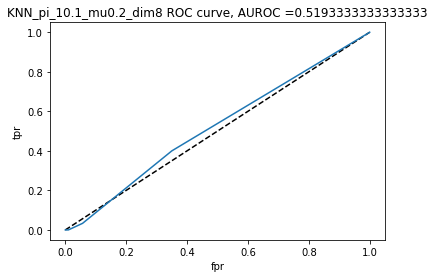

AUROC =  0.5193333333333333


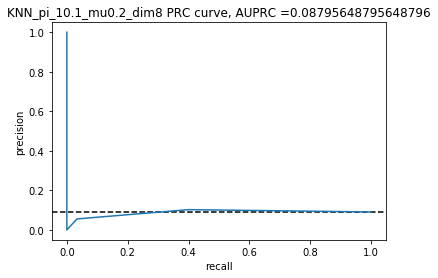

AUPRC =  0.08795648795648796
KNN  for train_test split: AUROC =  0.5193333333333333 , AUPRC =  0.08795648795648796 , average precision = , 0.09090909090909091 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8606060606060606 , accuracy =  0.9 . 
F1 score =  0.0 , log loss =  3.453884908558616 , recall = 0.0 .
------------------------------------------------------------


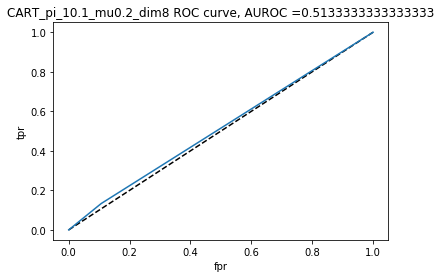

AUROC =  0.5133333333333333


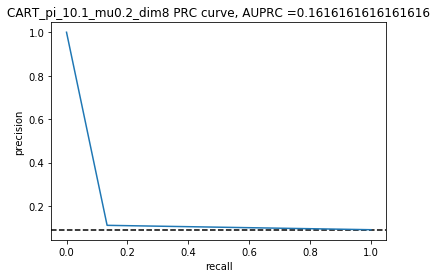

AUPRC =  0.1616161616161616
CART  for train_test split: AUROC =  0.5133333333333333 , AUPRC =  0.1616161616161616 , average precision = , 0.0936026936026936 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9090909090909091 , accuracy =  0.8242424242424242 . 
F1 score =  0.1212121212121212 , log loss =  6.070529145522989 , recall = 0.13333333333333333 .
------------------------------------------------------------


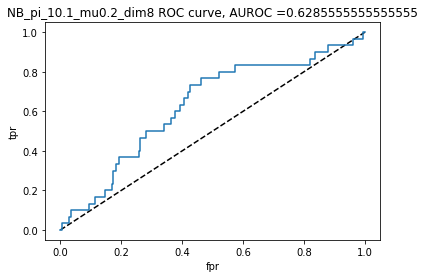

AUROC =  0.6285555555555555


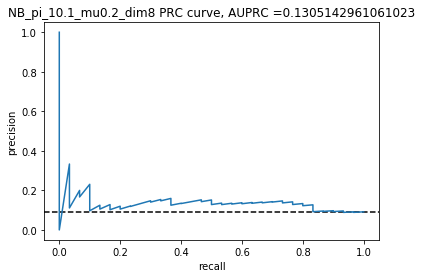

AUPRC =  0.1305142961061023
NB  for train_test split: AUROC =  0.6285555555555555 , AUPRC =  0.1305142961061023 , average precision = , 0.09090909090909091 . 
Best threshold for ROC =  0.0794881743800542 , accuracy for the best ROC threshold is then  0.6090909090909091 , accuracy =  0.9090909090909091 . 
F1 score =  0.0 , log loss =  3.139888763173699 , recall = 0.0 .
------------------------------------------------------------


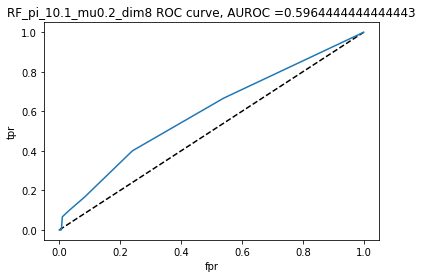

AUROC =  0.5964444444444443


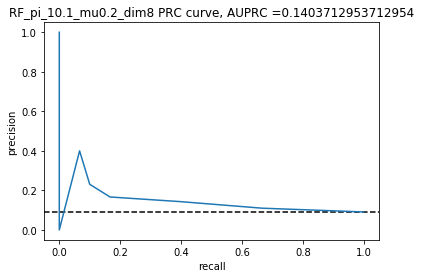

AUPRC =  0.1403712953712954
RF  for train_test split: AUROC =  0.5964444444444443 , AUPRC =  0.1403712953712954 , average precision = , 0.09090909090909091 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.7272727272727273 , accuracy =  0.9030303030303031 . 
F1 score =  0.0 , log loss =  3.3492195267636435 , recall = 0.0 .
------------------------------------------------------------


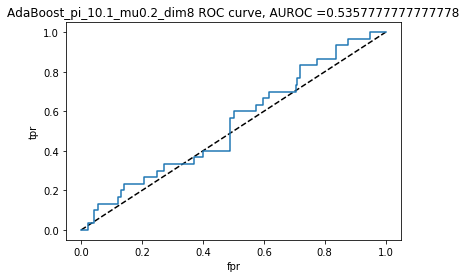

AUROC =  0.5357777777777778


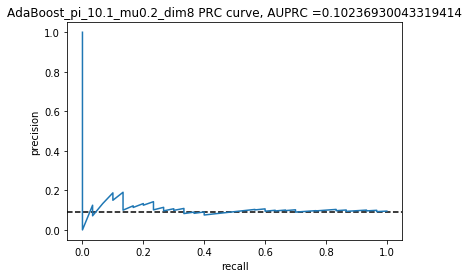

AUPRC =  0.10236930043319414
AdaBoost  for train_test split: AUROC =  0.5357777777777778 , AUPRC =  0.10236930043319414 , average precision = , 0.09044289044289044 . 
Best threshold for ROC =  0.4810949924447105 , accuracy for the best ROC threshold is then  0.5121212121212121 , accuracy =  0.8757575757575757 . 
F1 score =  0.046511627906976744 , log loss =  4.291210385940911 , recall = 0.03333333333333333 .
------------------------------------------------------------
The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.2 , dim = 10  is 0.104 .


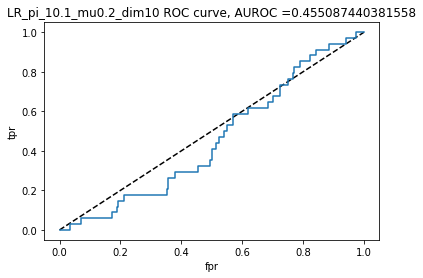

AUROC =  0.455087440381558


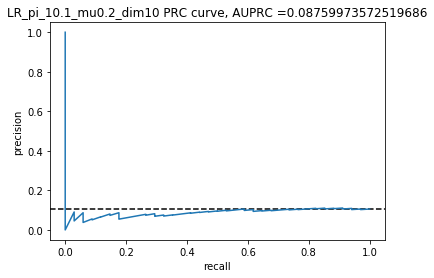

AUPRC =  0.08759973572519686
LR  for train_test split: AUROC =  0.455087440381558 , AUPRC =  0.08759973572519686 , average precision = , 0.10303030303030303 . 
Best threshold for ROC =  0.09154194481214084 , accuracy for the best ROC threshold is then  0.4727272727272727 , accuracy =  0.896969696969697 . 
F1 score =  0.0 , log loss =  3.5585405982635248 , recall = 0.0 .
------------------------------------------------------------


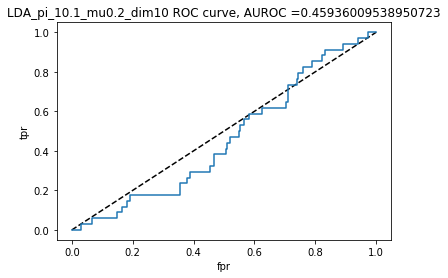

AUROC =  0.45936009538950723


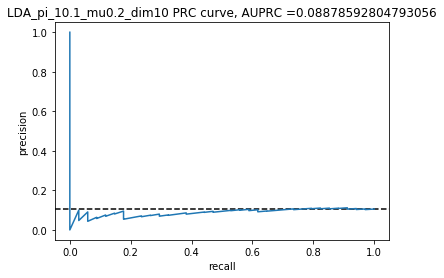

AUPRC =  0.08878592804793056
LDA  for train_test split: AUROC =  0.45936009538950723 , AUPRC =  0.08878592804793056 , average precision = , 0.10303030303030303 . 
Best threshold for ROC =  0.08818221700942135 , accuracy for the best ROC threshold is then  0.47575757575757577 , accuracy =  0.896969696969697 . 
F1 score =  0.0 , log loss =  3.5585405982635248 , recall = 0.0 .
------------------------------------------------------------


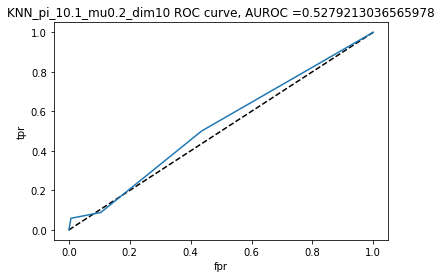

AUROC =  0.5279213036565978


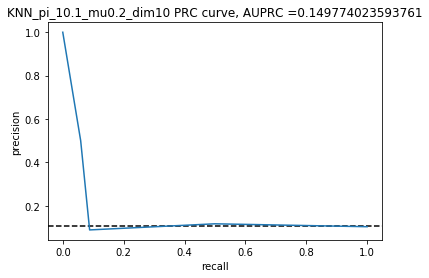

AUPRC =  0.149774023593761
KNN  for train_test split: AUROC =  0.5279213036565978 , AUPRC =  0.149774023593761 , average precision = , 0.12638146167557932 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8121212121212121 , accuracy =  0.896969696969697 . 
F1 score =  0.10526315789473684 , log loss =  3.5585454443085567 , recall = 0.058823529411764705 .
------------------------------------------------------------


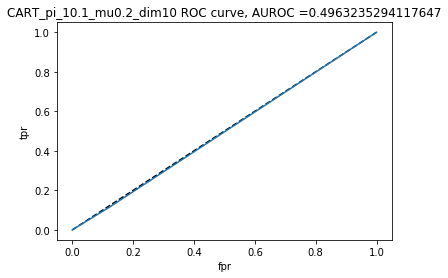

AUROC =  0.4963235294117647


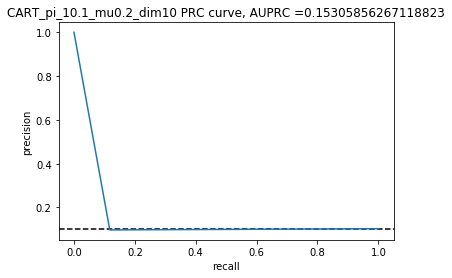

AUPRC =  0.15305856267118823
CART  for train_test split: AUROC =  0.4963235294117647 , AUPRC =  0.15305856267118823 , average precision = , 0.10238685274553279 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.896969696969697 , accuracy =  0.796969696969697 . 
F1 score =  0.10666666666666667 , log loss =  7.012507889587676 , recall = 0.11764705882352941 .
------------------------------------------------------------


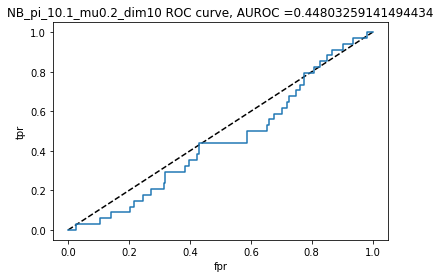

AUROC =  0.44803259141494434


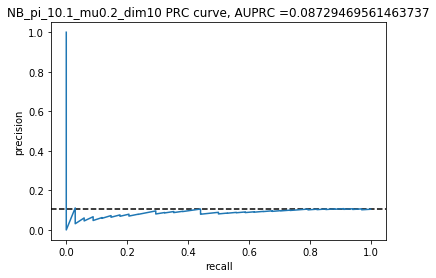

AUPRC =  0.08729469561463737
NB  for train_test split: AUROC =  0.44803259141494434 , AUPRC =  0.08729469561463737 , average precision = , 0.10303030303030303 . 
Best threshold for ROC =  0.077642738830742 , accuracy for the best ROC threshold is then  0.41818181818181815 , accuracy =  0.896969696969697 . 
F1 score =  0.0 , log loss =  3.5585405982635248 , recall = 0.0 .
------------------------------------------------------------


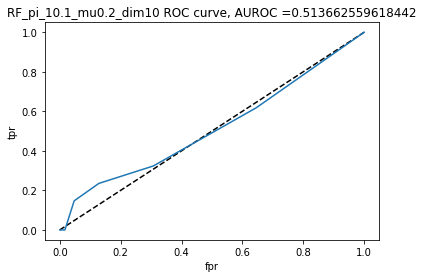

AUROC =  0.513662559618442


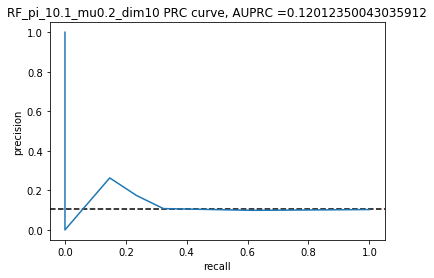

AUPRC =  0.12012350043035912
RF  for train_test split: AUROC =  0.513662559618442 , AUPRC =  0.12012350043035912 , average precision = , 0.10303030303030303 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.6545454545454545 , accuracy =  0.8909090909090909 . 
F1 score =  0.0 , log loss =  3.7678713618534707 , recall = 0.0 .
------------------------------------------------------------


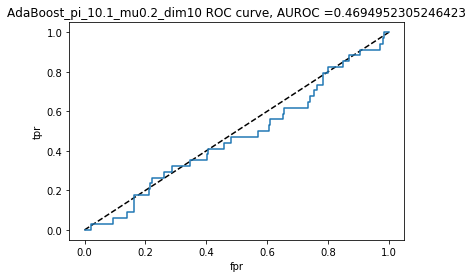

AUROC =  0.4694952305246423


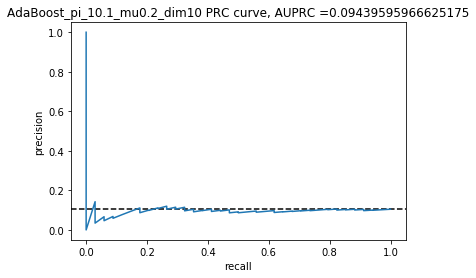

AUPRC =  0.09439595966625175
AdaBoost  for train_test split: AUROC =  0.4694952305246423 , AUPRC =  0.09439595966625175 , average precision = , 0.10367647058823529 . 
Best threshold for ROC =  0.4809859743682546 , accuracy for the best ROC threshold is then  0.43636363636363634 , accuracy =  0.8787878787878788 . 
F1 score =  0.047619047619047616 , log loss =  4.186535312055875 , recall = 0.029411764705882353 .
------------------------------------------------------------
The best model measured by  AUROC is  KNN
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.4 , dim = 2  is 0.1 .


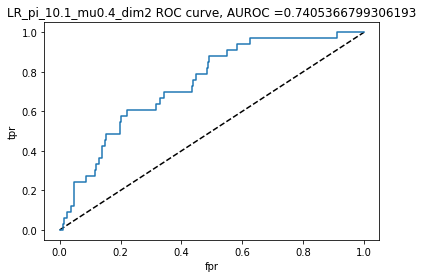

AUROC =  0.7405366799306193


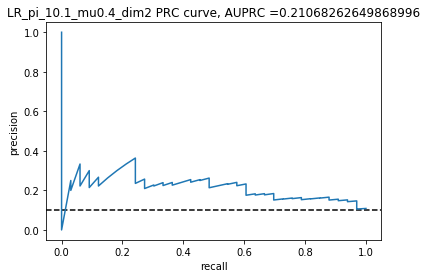

AUPRC =  0.21068262649868996
LR  for train_test split: AUROC =  0.7405366799306193 , AUPRC =  0.21068262649868996 , average precision = , 0.1 . 
Best threshold for ROC =  0.10370554863496709 , accuracy for the best ROC threshold is then  0.6666666666666666 , accuracy =  0.9 . 
F1 score =  0.0 , log loss =  3.4538776394910684 , recall = 0.0 .
------------------------------------------------------------


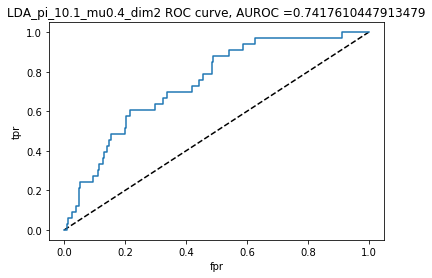

AUROC =  0.7417610447913479


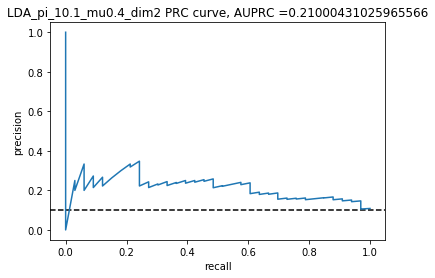

AUPRC =  0.21000431025965566
LDA  for train_test split: AUROC =  0.7417610447913479 , AUPRC =  0.21000431025965566 , average precision = , 0.1 . 
Best threshold for ROC =  0.09935071888531173 , accuracy for the best ROC threshold is then  0.6666666666666666 , accuracy =  0.9 . 
F1 score =  0.0 , log loss =  3.4538776394910684 , recall = 0.0 .
------------------------------------------------------------


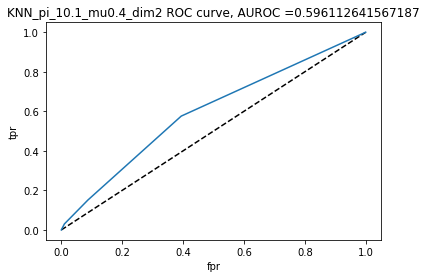

AUROC =  0.596112641567187


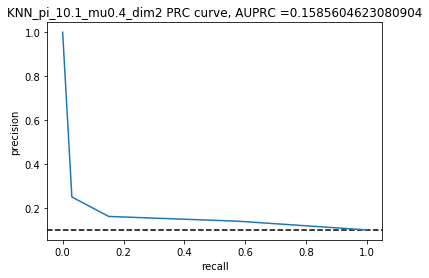

AUPRC =  0.1585604623080904
KNN  for train_test split: AUROC =  0.596112641567187 , AUPRC =  0.1585604623080904 , average precision = , 0.10454545454545455 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8363636363636363 , accuracy =  0.8939393939393939 . 
F1 score =  0.054054054054054064 , log loss =  3.663210826103529 , recall = 0.030303030303030304 .
------------------------------------------------------------


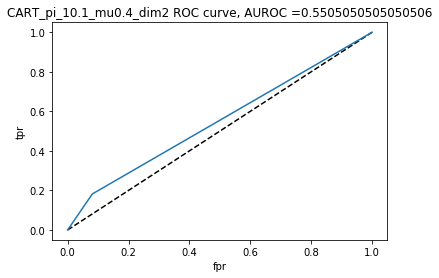

AUROC =  0.5505050505050506


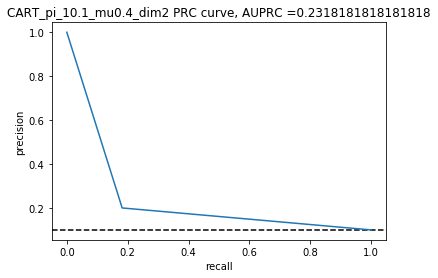

AUPRC =  0.2318181818181818
CART  for train_test split: AUROC =  0.5505050505050506 , AUPRC =  0.2318181818181818 , average precision = , 0.1181818181818182 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9 , accuracy =  0.8454545454545455 . 
F1 score =  0.1904761904761905 , log loss =  5.337869049935665 , recall = 0.18181818181818182 .
------------------------------------------------------------


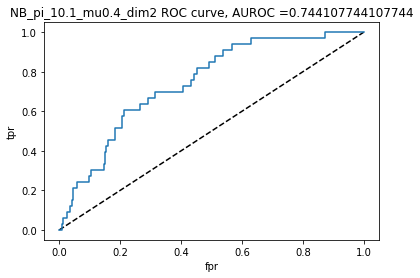

AUROC =  0.744107744107744


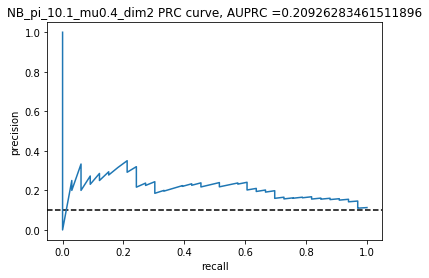

AUPRC =  0.20926283461511896
NB  for train_test split: AUROC =  0.744107744107744 , AUPRC =  0.20926283461511896 , average precision = , 0.1 . 
Best threshold for ROC =  0.09499545257130657 , accuracy for the best ROC threshold is then  0.6848484848484848 , accuracy =  0.9 . 
F1 score =  0.0 , log loss =  3.4538776394910684 , recall = 0.0 .
------------------------------------------------------------


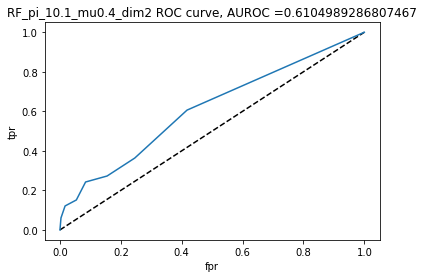

AUROC =  0.6104989286807467


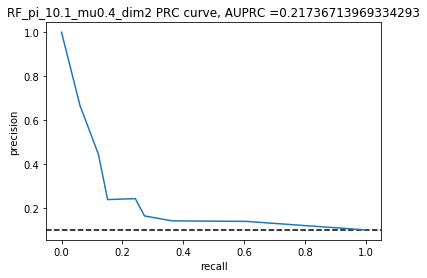

AUPRC =  0.21736713969334293
RF  for train_test split: AUROC =  0.6104989286807467 , AUPRC =  0.21736713969334293 , average precision = , 0.14175084175084177 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.7151515151515152 , accuracy =  0.896969696969697 . 
F1 score =  0.19047619047619047 , log loss =  3.5585527133761046 , recall = 0.12121212121212122 .
------------------------------------------------------------


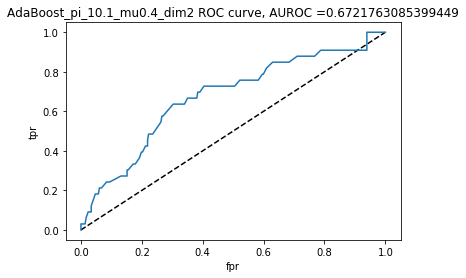

AUROC =  0.6721763085399449


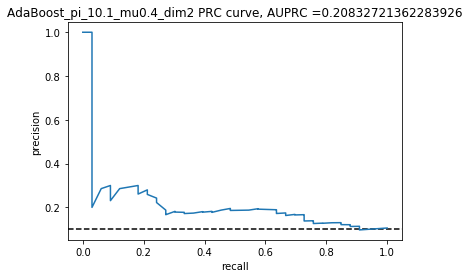

AUPRC =  0.20832721362283926
AdaBoost  for train_test split: AUROC =  0.6721763085399449 , AUPRC =  0.20832721362283926 , average precision = , 0.11125541125541126 . 
Best threshold for ROC =  0.4869764555866705 , accuracy for the best ROC threshold is then  0.6575757575757576 , accuracy =  0.8909090909090909 . 
F1 score =  0.1 , log loss =  3.7678786309210173 , recall = 0.06060606060606061 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  RF
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.4 , dim = 4  is 0.093 .


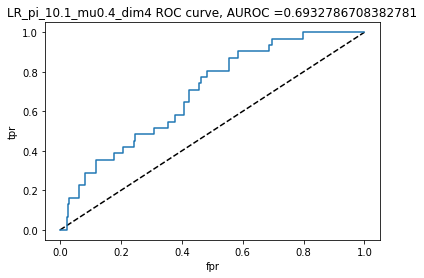

AUROC =  0.6932786708382781


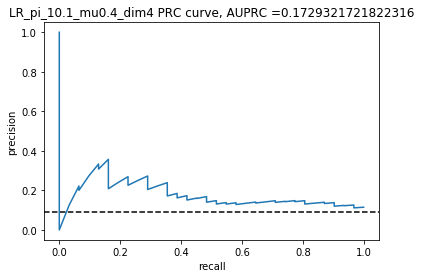

AUPRC =  0.1729321721822316
LR  for train_test split: AUROC =  0.6932786708382781 , AUPRC =  0.1729321721822316 , average precision = , 0.09393939393939393 . 
Best threshold for ROC =  0.09967277433148967 , accuracy for the best ROC threshold is then  0.593939393939394 , accuracy =  0.906060606060606 . 
F1 score =  0.0 , log loss =  3.244551721946156 , recall = 0.0 .
------------------------------------------------------------


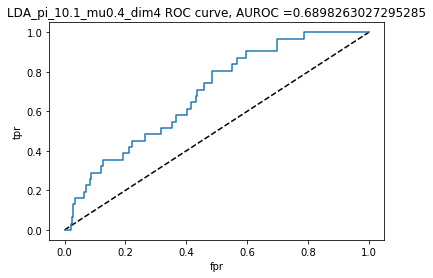

AUROC =  0.6898263027295285


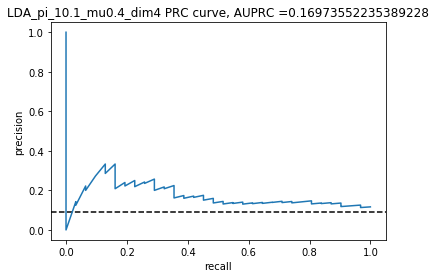

AUPRC =  0.16973552235389228
LDA  for train_test split: AUROC =  0.6898263027295285 , AUPRC =  0.16973552235389228 , average precision = , 0.09393939393939393 . 
Best threshold for ROC =  0.0956742177932773 , accuracy for the best ROC threshold is then  0.5969696969696969 , accuracy =  0.906060606060606 . 
F1 score =  0.0 , log loss =  3.244551721946156 , recall = 0.0 .
------------------------------------------------------------


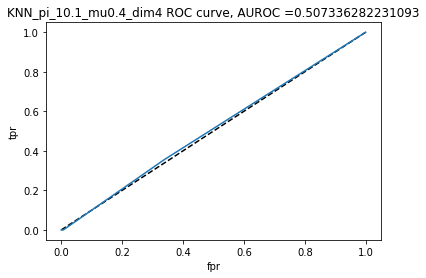

AUROC =  0.507336282231093


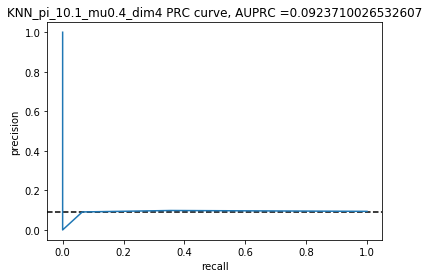

AUPRC =  0.0923710026532607
KNN  for train_test split: AUROC =  0.507336282231093 , AUPRC =  0.0923710026532607 , average precision = , 0.09393939393939393 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8515151515151516 , accuracy =  0.9 . 
F1 score =  0.0 , log loss =  3.4538824855361008 , recall = 0.0 .
------------------------------------------------------------


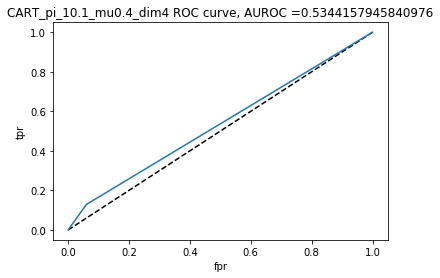

AUROC =  0.5344157945840976


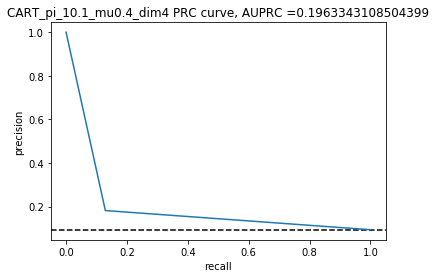

AUPRC =  0.1963343108504399
CART  for train_test split: AUROC =  0.5344157945840976 , AUPRC =  0.1963343108504399 , average precision = , 0.10527859237536658 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.906060606060606 , accuracy =  0.8636363636363636 . 
F1 score =  0.1509433962264151 , log loss =  4.709876759165831 , recall = 0.12903225806451613 .
------------------------------------------------------------


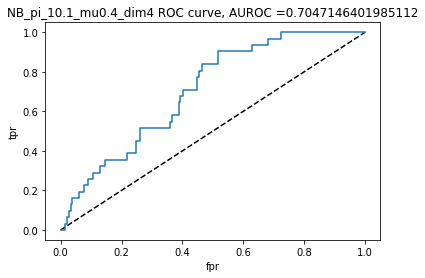

AUROC =  0.7047146401985112


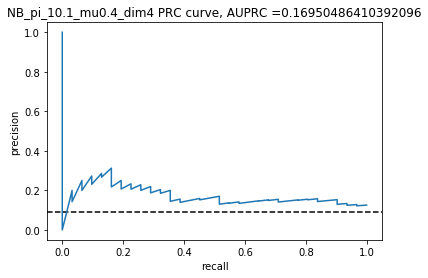

AUPRC =  0.16950486410392096
NB  for train_test split: AUROC =  0.7047146401985112 , AUPRC =  0.16950486410392096 , average precision = , 0.09393939393939393 . 
Best threshold for ROC =  0.09531429908553726 , accuracy for the best ROC threshold is then  0.6121212121212121 , accuracy =  0.906060606060606 . 
F1 score =  0.0 , log loss =  3.244551721946156 , recall = 0.0 .
------------------------------------------------------------


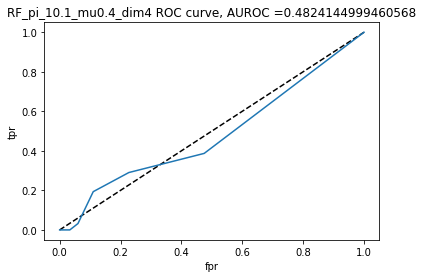

AUROC =  0.4824144999460568


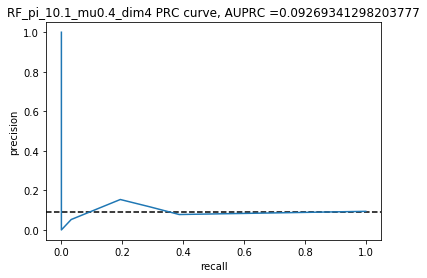

AUPRC =  0.09269341298203777
RF  for train_test split: AUROC =  0.4824144999460568 , AUPRC =  0.09269341298203777 , average precision = , 0.09393939393939393 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.7272727272727273 , accuracy =  0.9 . 
F1 score =  0.0 , log loss =  3.4538824855361003 , recall = 0.0 .
------------------------------------------------------------


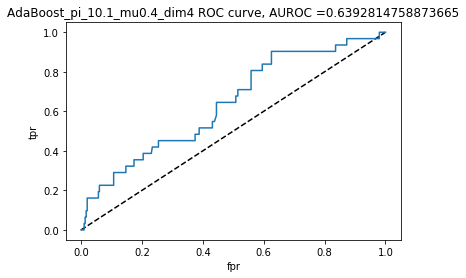

AUROC =  0.6392814758873665


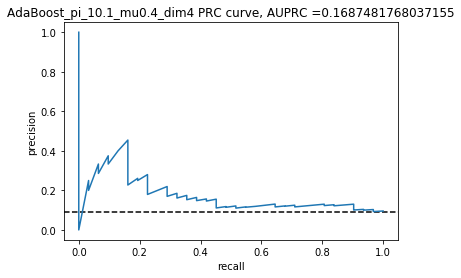

AUPRC =  0.1687481768037155
AdaBoost  for train_test split: AUROC =  0.6392814758873665 , AUPRC =  0.1687481768037155 , average precision = , 0.10938416422287389 . 
Best threshold for ROC =  0.48459092620807886 , accuracy for the best ROC threshold is then  0.5636363636363636 , accuracy =  0.9 . 
F1 score =  0.1081081081081081 , log loss =  3.4538873315811323 , recall = 0.06451612903225806 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.4 , dim = 6  is 0.113 .


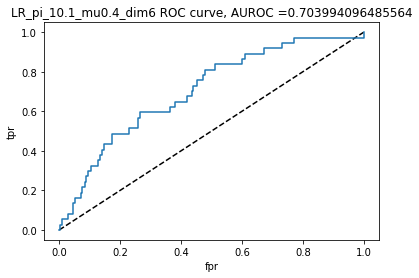

AUROC =  0.703994096485564


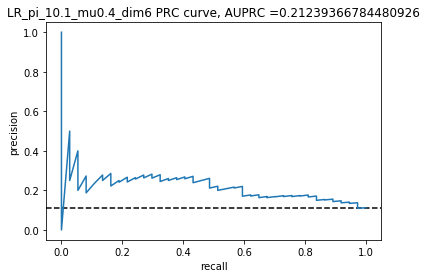

AUPRC =  0.21239366784480926
LR  for train_test split: AUROC =  0.703994096485564 , AUPRC =  0.21239366784480926 , average precision = , 0.11809991809991811 . 
Best threshold for ROC =  0.10232920995216019 , accuracy for the best ROC threshold is then  0.6242424242424243 , accuracy =  0.8848484848484849 . 
F1 score =  0.05 , log loss =  3.9771972793983834 , recall = 0.02702702702702703 .
------------------------------------------------------------


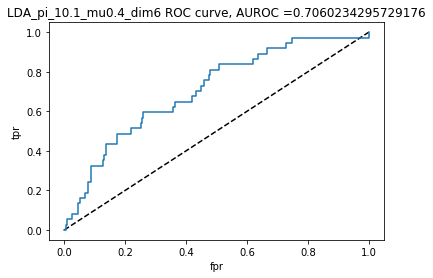

AUROC =  0.7060234295729176


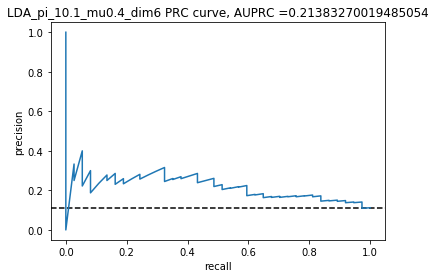

AUPRC =  0.21383270019485054
LDA  for train_test split: AUROC =  0.7060234295729176 , AUPRC =  0.21383270019485054 , average precision = , 0.11212121212121212 . 
Best threshold for ROC =  0.10120384524829044 , accuracy for the best ROC threshold is then  0.6363636363636364 , accuracy =  0.8848484848484849 . 
F1 score =  0.0 , log loss =  3.977194856375868 , recall = 0.0 .
------------------------------------------------------------


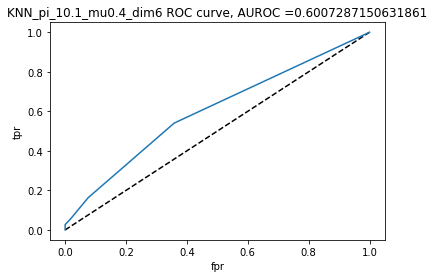

AUROC =  0.6007287150631861


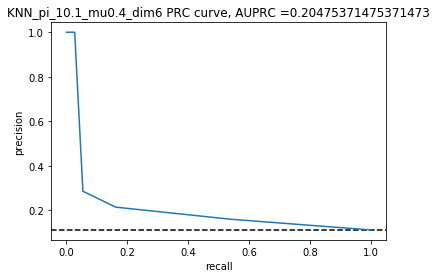

AUPRC =  0.20475371475371473
KNN  for train_test split: AUROC =  0.6007287150631861 , AUPRC =  0.20475371475371473 , average precision = , 0.1215046215046215 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8393939393939394 , accuracy =  0.8787878787878788 . 
F1 score =  0.09090909090909091 , log loss =  4.1865304660108436 , recall = 0.05405405405405406 .
------------------------------------------------------------


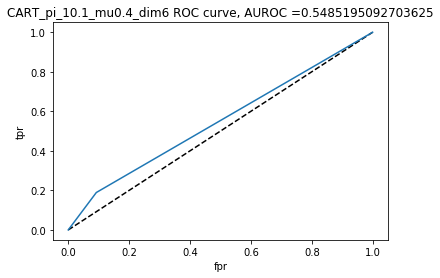

AUROC =  0.5485195092703625


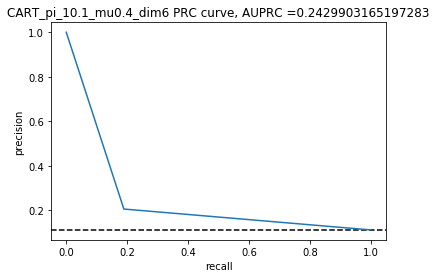

AUPRC =  0.2429903165197283
CART  for train_test split: AUROC =  0.5485195092703625 , AUPRC =  0.2429903165197283 , average precision = , 0.12985980633039457 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8878787878787879 , accuracy =  0.8272727272727273 . 
F1 score =  0.19718309859154928 , log loss =  5.965854071637953 , recall = 0.1891891891891892 .
------------------------------------------------------------


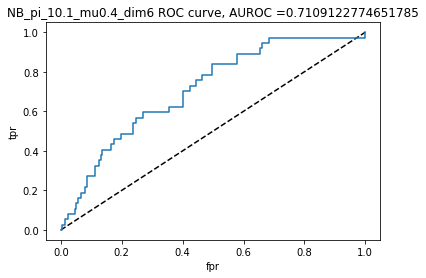

AUROC =  0.7109122774651785


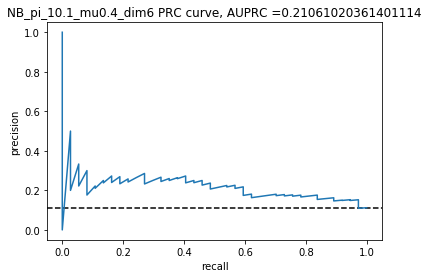

AUPRC =  0.21061020361401114
NB  for train_test split: AUROC =  0.7109122774651785 , AUPRC =  0.21061020361401114 , average precision = , 0.12260442260442261 . 
Best threshold for ROC =  0.10873453087367264 , accuracy for the best ROC threshold is then  0.6393939393939394 , accuracy =  0.8878787878787879 . 
F1 score =  0.05128205128205129 , log loss =  3.8725318976034115 , recall = 0.02702702702702703 .
------------------------------------------------------------


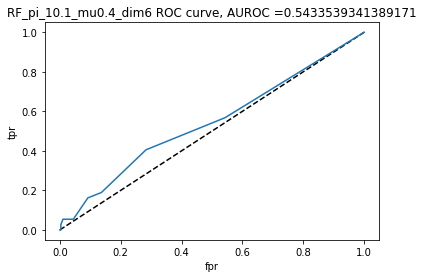

AUROC =  0.5433539341389171


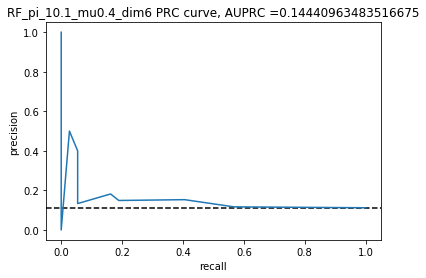

AUPRC =  0.14440963483516675
RF  for train_test split: AUROC =  0.5433539341389171 , AUPRC =  0.14440963483516675 , average precision = , 0.1276822276822277 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.6818181818181818 , accuracy =  0.8848484848484849 . 
F1 score =  0.09523809523809523 , log loss =  3.9771997024208994 , recall = 0.05405405405405406 .
------------------------------------------------------------


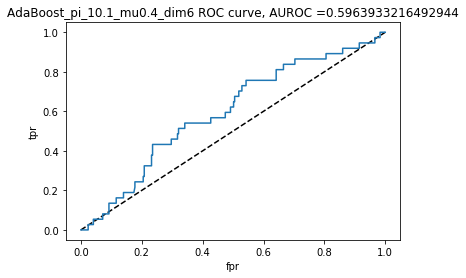

AUROC =  0.5963933216492944


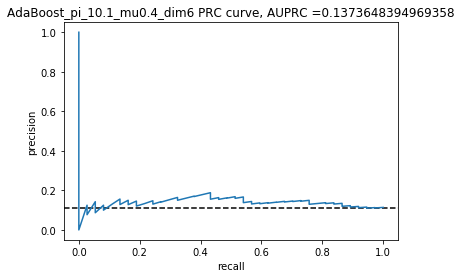

AUPRC =  0.1373648394969358
AdaBoost  for train_test split: AUROC =  0.5963933216492944 , AUPRC =  0.1373648394969358 , average precision = , 0.1124199065375536 . 
Best threshold for ROC =  0.4837661143360821 , accuracy for the best ROC threshold is then  0.5696969696969697 , accuracy =  0.8484848484848485 . 
F1 score =  0.07407407407407408 , log loss =  5.233184283960568 , recall = 0.05405405405405406 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.4 , dim = 8  is 0.102 .


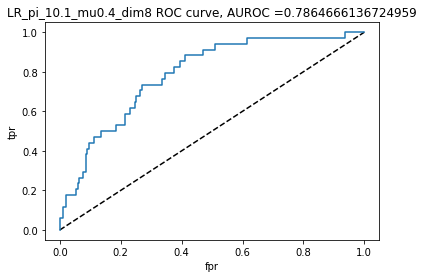

AUROC =  0.7864666136724959


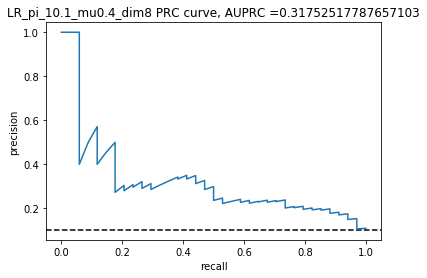

AUPRC =  0.31752517787657103
LR  for train_test split: AUROC =  0.7864666136724959 , AUPRC =  0.31752517787657103 , average precision = , 0.12941176470588234 . 
Best threshold for ROC =  0.118921775464349 , accuracy for the best ROC threshold is then  0.7272727272727273 , accuracy =  0.9 . 
F1 score =  0.05714285714285715 , log loss =  3.4538776394910684 , recall = 0.029411764705882353 .
------------------------------------------------------------


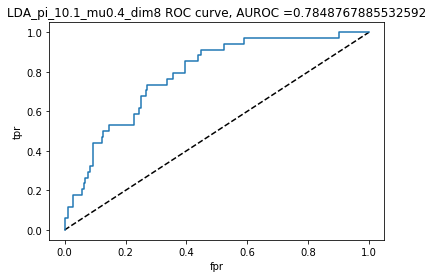

AUROC =  0.7848767885532592


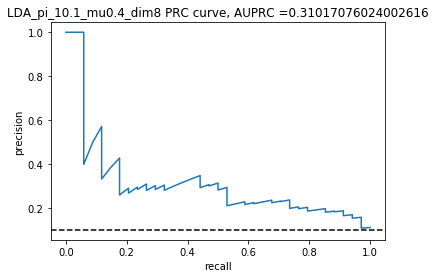

AUPRC =  0.31017076024002616
LDA  for train_test split: AUROC =  0.7848767885532592 , AUPRC =  0.31017076024002616 , average precision = , 0.15579322638146167 . 
Best threshold for ROC =  0.11403971929613918 , accuracy for the best ROC threshold is then  0.7272727272727273 , accuracy =  0.9030303030303031 . 
F1 score =  0.1111111111111111 , log loss =  3.3492146807186116 , recall = 0.058823529411764705 .
------------------------------------------------------------


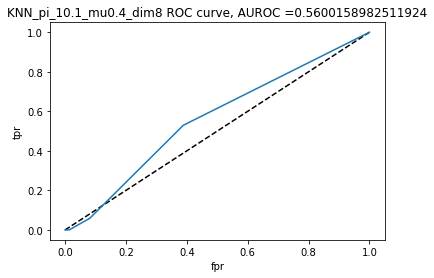

AUROC =  0.5600158982511924


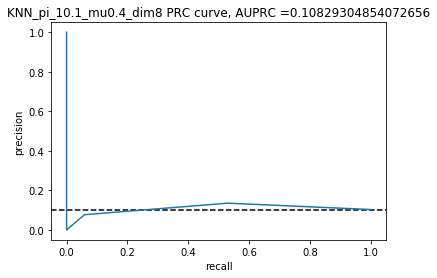

AUPRC =  0.10829304854072656
KNN  for train_test split: AUROC =  0.5600158982511924 , AUPRC =  0.10829304854072656 , average precision = , 0.10303030303030303 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8303030303030303 , accuracy =  0.8848484848484849 . 
F1 score =  0.0 , log loss =  3.977202125443415 , recall = 0.0 .
------------------------------------------------------------


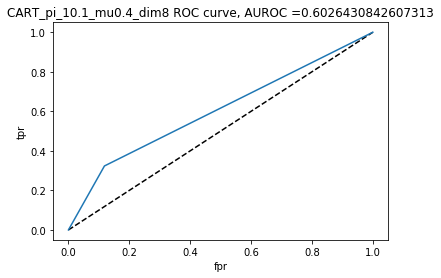

AUROC =  0.6026430842607313


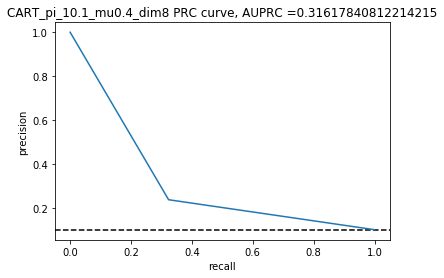

AUPRC =  0.31617840812214215
CART  for train_test split: AUROC =  0.6026430842607313 , AUPRC =  0.31617840812214215 , average precision = , 0.14706269859722548 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.896969696969697 , accuracy =  0.8242424242424242 . 
F1 score =  0.275 , log loss =  6.070536414590534 , recall = 0.3235294117647059 .
------------------------------------------------------------


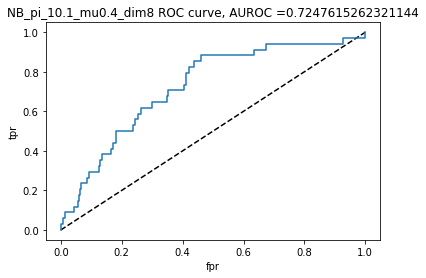

AUROC =  0.7247615262321144


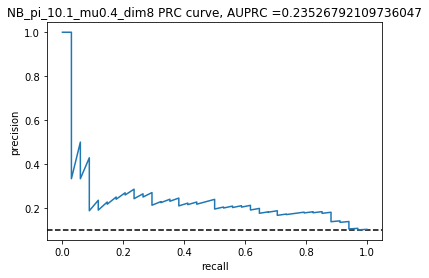

AUPRC =  0.23526792109736047
NB  for train_test split: AUROC =  0.7247615262321144 , AUPRC =  0.23526792109736047 , average precision = , 0.12941176470588234 . 
Best threshold for ROC =  0.10428044990336348 , accuracy for the best ROC threshold is then  0.6545454545454545 , accuracy =  0.9 . 
F1 score =  0.05714285714285715 , log loss =  3.4538776394910684 , recall = 0.029411764705882353 .
------------------------------------------------------------


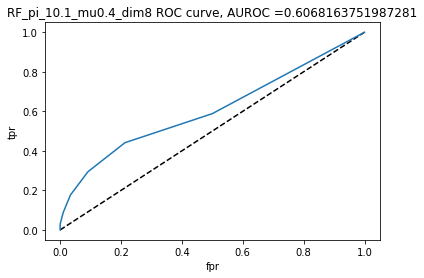

AUROC =  0.6068163751987281


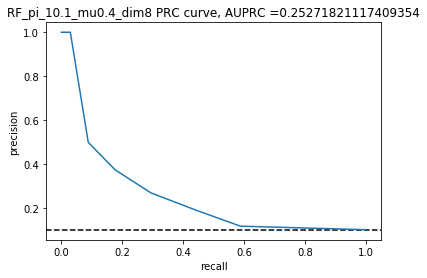

AUPRC =  0.25271821117409354
RF  for train_test split: AUROC =  0.6068163751987281 , AUPRC =  0.25271821117409354 , average precision = , 0.12941176470588234 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.7515151515151515 , accuracy =  0.9 . 
F1 score =  0.05714285714285715 , log loss =  3.4538776394910684 , recall = 0.029411764705882353 .
------------------------------------------------------------


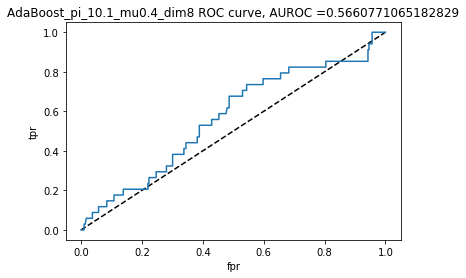

AUROC =  0.5660771065182829


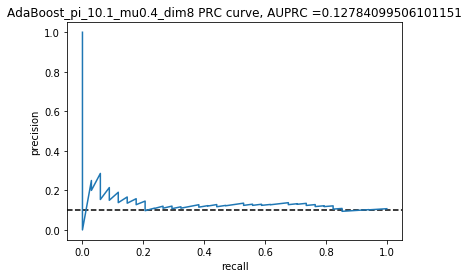

AUPRC =  0.12784099506101151
AdaBoost  for train_test split: AUROC =  0.5660771065182829 , AUPRC =  0.12784099506101151 , average precision = , 0.1137764196587726 . 
Best threshold for ROC =  0.4830029686004879 , accuracy for the best ROC threshold is then  0.5666666666666667 , accuracy =  0.8878787878787879 . 
F1 score =  0.0975609756097561 , log loss =  3.872541589693474 , recall = 0.058823529411764705 .
------------------------------------------------------------
The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.4 , dim = 10  is 0.1 .


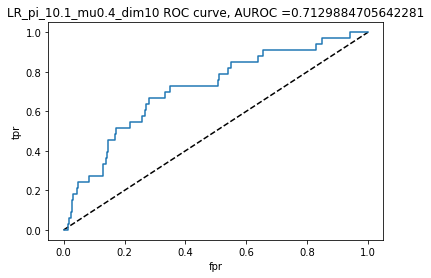

AUROC =  0.7129884705642281


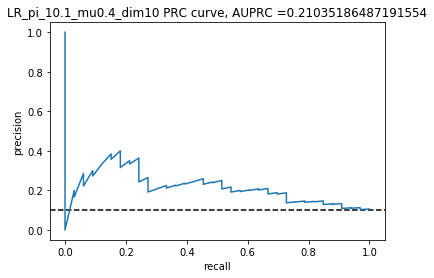

AUPRC =  0.21035186487191554
LR  for train_test split: AUROC =  0.7129884705642281 , AUPRC =  0.21035186487191554 , average precision = , 0.1 . 
Best threshold for ROC =  0.11410545554692278 , accuracy for the best ROC threshold is then  0.6696969696969697 , accuracy =  0.896969696969697 . 
F1 score =  0.0 , log loss =  3.5585430212860403 , recall = 0.0 .
------------------------------------------------------------


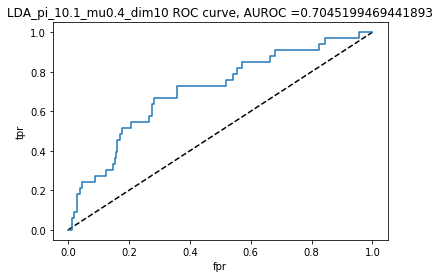

AUROC =  0.7045199469441893


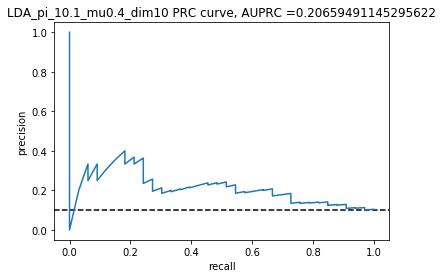

AUPRC =  0.20659491145295622
LDA  for train_test split: AUROC =  0.7045199469441893 , AUPRC =  0.20659491145295622 , average precision = , 0.1 . 
Best threshold for ROC =  0.10551998506476015 , accuracy for the best ROC threshold is then  0.6484848484848484 , accuracy =  0.896969696969697 . 
F1 score =  0.0 , log loss =  3.5585430212860403 , recall = 0.0 .
------------------------------------------------------------


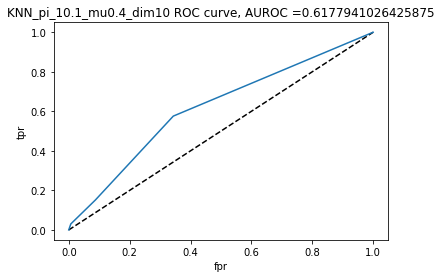

AUROC =  0.6177941026425875


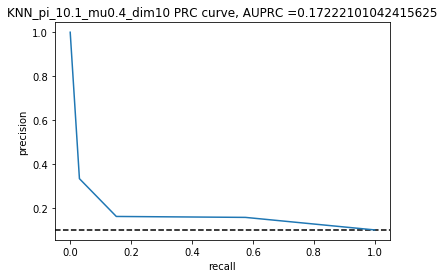

AUPRC =  0.17222101042415625
KNN  for train_test split: AUROC =  0.6177941026425875 , AUPRC =  0.17222101042415625 , average precision = , 0.10707070707070708 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8363636363636363 , accuracy =  0.896969696969697 . 
F1 score =  0.05555555555555555 , log loss =  3.5585454443085567 , recall = 0.030303030303030304 .
------------------------------------------------------------


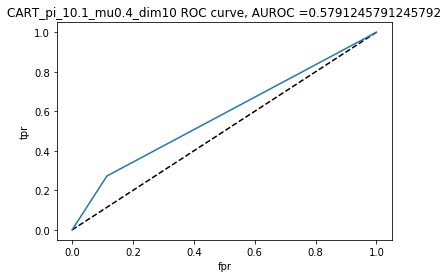

AUROC =  0.5791245791245792


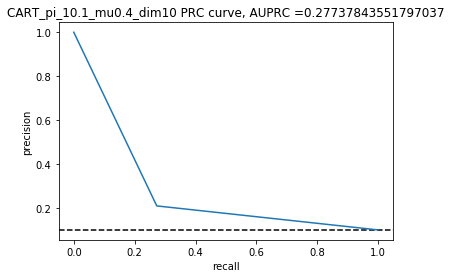

AUPRC =  0.27737843551797037
CART  for train_test split: AUROC =  0.5791245791245792 , AUPRC =  0.27737843551797037 , average precision = , 0.12980972515856237 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9 , accuracy =  0.8242424242424242 . 
F1 score =  0.23684210526315788 , log loss =  6.070533991568019 , recall = 0.2727272727272727 .
------------------------------------------------------------


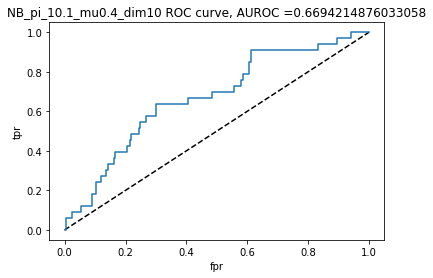

AUROC =  0.6694214876033058


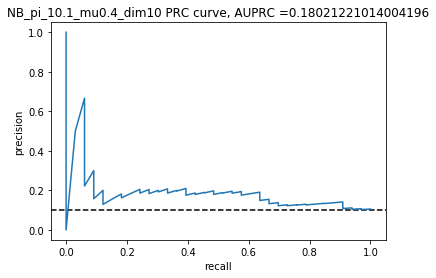

AUPRC =  0.18021221014004196
NB  for train_test split: AUROC =  0.6694214876033058 , AUPRC =  0.18021221014004196 , average precision = , 0.12424242424242425 . 
Best threshold for ROC =  0.08341976554671383 , accuracy for the best ROC threshold is then  0.603030303030303 , accuracy =  0.9 . 
F1 score =  0.10810810810810813 , log loss =  3.4538824855361003 , recall = 0.06060606060606061 .
------------------------------------------------------------


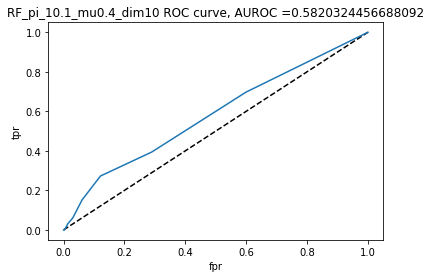

AUROC =  0.5820324456688092


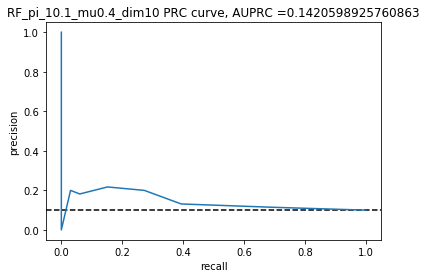

AUPRC =  0.1420598925760863
RF  for train_test split: AUROC =  0.5820324456688092 , AUPRC =  0.1420598925760863 , average precision = , 0.10303030303030304 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.6787878787878788 , accuracy =  0.8909090909090909 . 
F1 score =  0.052631578947368425 , log loss =  3.7678762078985018 , recall = 0.030303030303030304 .
------------------------------------------------------------


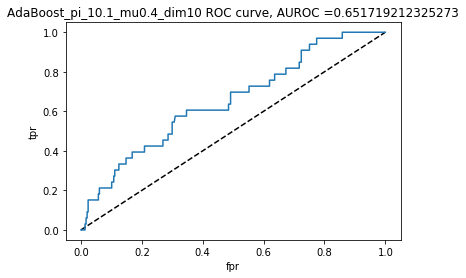

AUROC =  0.651719212325273


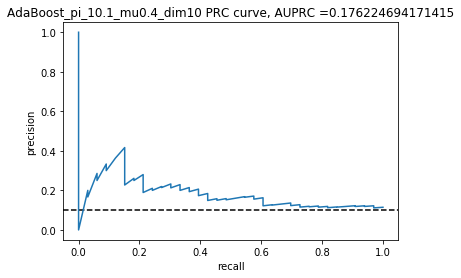

AUPRC =  0.176224694171415
AdaBoost  for train_test split: AUROC =  0.651719212325273 , AUPRC =  0.176224694171415 , average precision = , 0.13535353535353536 . 
Best threshold for ROC =  0.4831628878335349 , accuracy for the best ROC threshold is then  0.6090909090909091 , accuracy =  0.8848484848484849 . 
F1 score =  0.20833333333333331 , log loss =  3.977216663578509 , recall = 0.15151515151515152 .
------------------------------------------------------------
The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.6 , dim = 2  is 0.103 .


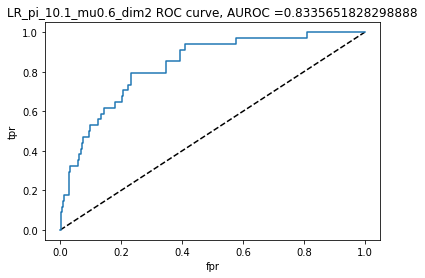

AUROC =  0.8335651828298888


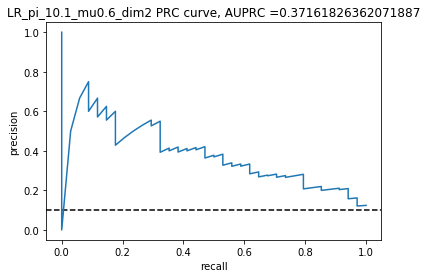

AUPRC =  0.37161826362071887
LR  for train_test split: AUROC =  0.8335651828298888 , AUPRC =  0.37161826362071887 , average precision = , 0.1693404634581105 . 
Best threshold for ROC =  0.12645665827959876 , accuracy for the best ROC threshold is then  0.7666666666666667 , accuracy =  0.9030303030303031 . 
F1 score =  0.2 , log loss =  3.3492195267636435 , recall = 0.11764705882352941 .
------------------------------------------------------------


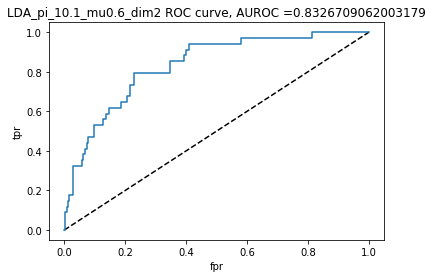

AUROC =  0.8326709062003179


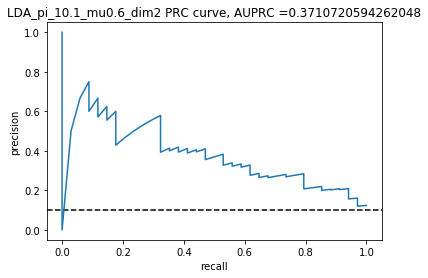

AUPRC =  0.3710720594262048
LDA  for train_test split: AUROC =  0.8326709062003179 , AUPRC =  0.3710720594262048 , average precision = , 0.1693404634581105 . 
Best threshold for ROC =  0.12104756577325972 , accuracy for the best ROC threshold is then  0.7696969696969697 , accuracy =  0.9030303030303031 . 
F1 score =  0.2 , log loss =  3.3492195267636435 , recall = 0.11764705882352941 .
------------------------------------------------------------


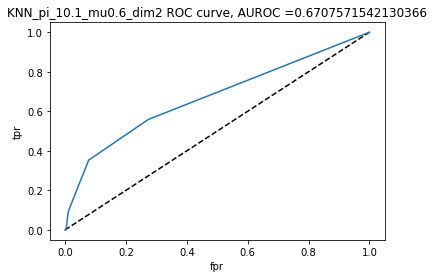

AUROC =  0.6707571542130366


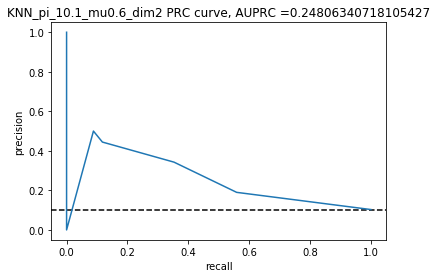

AUPRC =  0.24806340718105427
KNN  for train_test split: AUROC =  0.6707571542130366 , AUPRC =  0.24806340718105427 , average precision = , 0.1431966726084373 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8636363636363636 , accuracy =  0.8939393939393939 . 
F1 score =  0.18604651162790695 , log loss =  3.663215672148561 , recall = 0.11764705882352941 .
------------------------------------------------------------


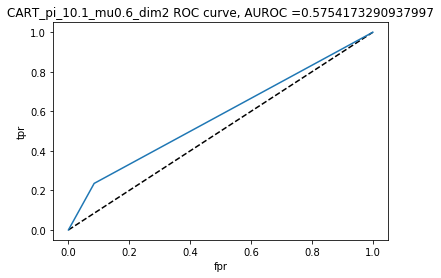

AUROC =  0.5754173290937997


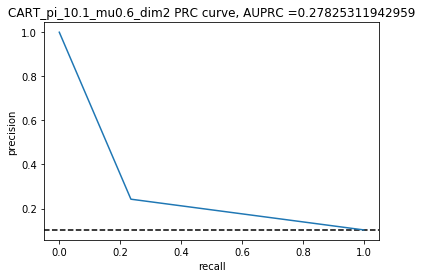

AUPRC =  0.27825311942959
CART  for train_test split: AUROC =  0.5754173290937997 , AUPRC =  0.27825311942959 , average precision = , 0.1358288770053476 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.896969696969697 , accuracy =  0.8454545454545455 . 
F1 score =  0.23880597014925375 , log loss =  5.337871472958181 , recall = 0.23529411764705882 .
------------------------------------------------------------


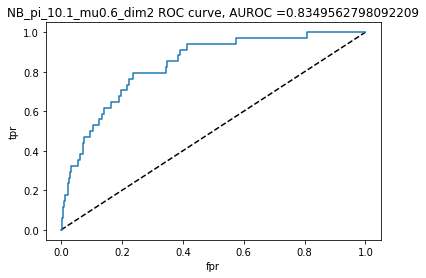

AUROC =  0.8349562798092209


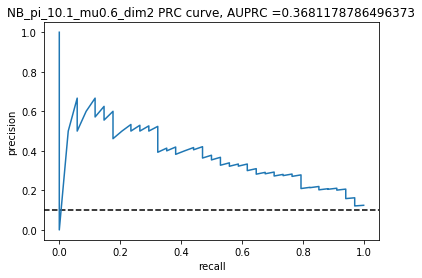

AUPRC =  0.3681178786496373
NB  for train_test split: AUROC =  0.8349562798092209 , AUPRC =  0.3681178786496373 , average precision = , 0.1693404634581105 . 
Best threshold for ROC =  0.12394756461666799 , accuracy for the best ROC threshold is then  0.7666666666666667 , accuracy =  0.9030303030303031 . 
F1 score =  0.2 , log loss =  3.3492195267636435 , recall = 0.11764705882352941 .
------------------------------------------------------------


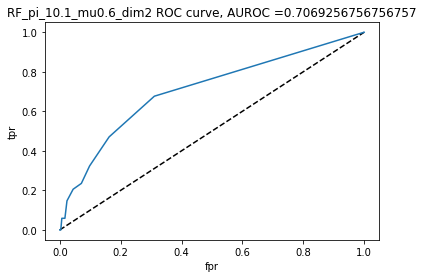

AUROC =  0.7069256756756757


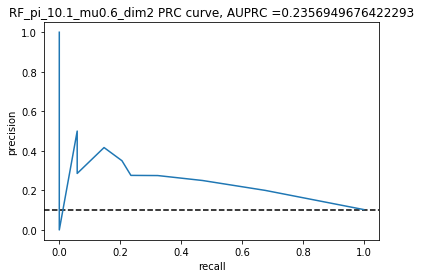

AUPRC =  0.2356949676422293
RF  for train_test split: AUROC =  0.7069256756756757 , AUPRC =  0.2356949676422293 , average precision = , 0.14915329768270946 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.8 , accuracy =  0.8909090909090909 . 
F1 score =  0.2173913043478261 , log loss =  3.7678834769660488 , recall = 0.14705882352941177 .
------------------------------------------------------------


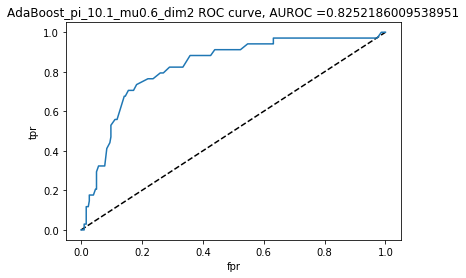

AUROC =  0.8252186009538951


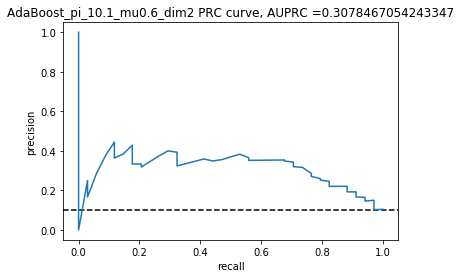

AUPRC =  0.3078467054243347
AdaBoost  for train_test split: AUROC =  0.8252186009538951 , AUPRC =  0.3078467054243347 , average precision = , 0.1431966726084373 . 
Best threshold for ROC =  0.48867929923383113 , accuracy for the best ROC threshold is then  0.7666666666666667 , accuracy =  0.8939393939393939 . 
F1 score =  0.18604651162790695 , log loss =  3.663215672148561 , recall = 0.11764705882352941 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.6 , dim = 4  is 0.08 .


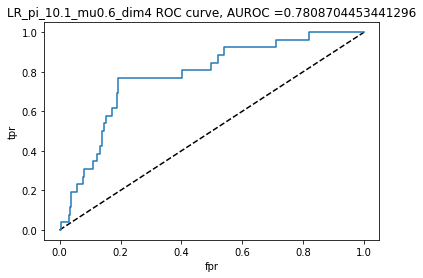

AUROC =  0.7808704453441296


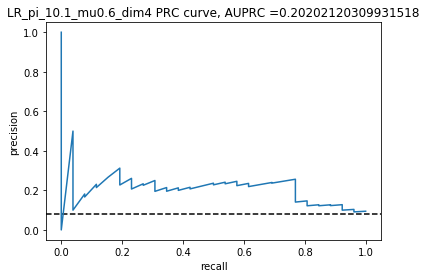

AUPRC =  0.20202120309931518
LR  for train_test split: AUROC =  0.7808704453441296 , AUPRC =  0.20202120309931518 , average precision = , 0.08857808857808858 . 
Best threshold for ROC =  0.10129665645081232 , accuracy for the best ROC threshold is then  0.803030303030303 , accuracy =  0.9181818181818182 . 
F1 score =  0.06896551724137931 , log loss =  2.825904732901361 , recall = 0.038461538461538464 .
------------------------------------------------------------


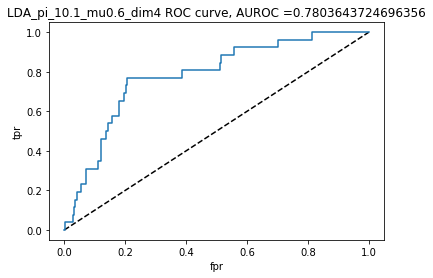

AUROC =  0.7803643724696356


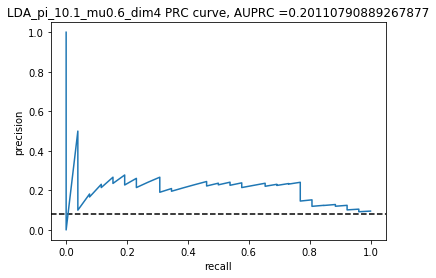

AUPRC =  0.20110790889267877
LDA  for train_test split: AUROC =  0.7803643724696356 , AUPRC =  0.20110790889267877 , average precision = , 0.08537296037296038 . 
Best threshold for ROC =  0.08821227797056666 , accuracy for the best ROC threshold is then  0.7878787878787878 , accuracy =  0.9151515151515152 . 
F1 score =  0.06666666666666668 , log loss =  2.9305701146963328 , recall = 0.038461538461538464 .
------------------------------------------------------------


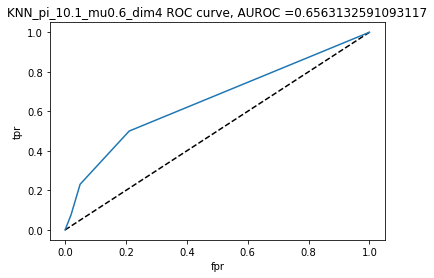

AUROC =  0.6563132591093117


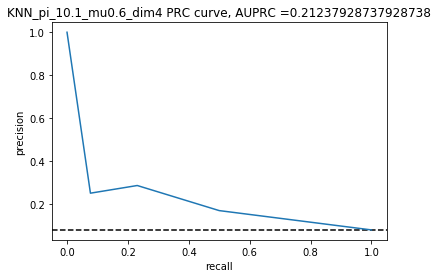

AUPRC =  0.21237928737928738
KNN  for train_test split: AUROC =  0.6563132591093117 , AUPRC =  0.21237928737928738 , average precision = , 0.09195804195804196 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8939393939393939 , accuracy =  0.9090909090909091 . 
F1 score =  0.11764705882352941 , log loss =  3.1399033013087934 , recall = 0.07692307692307693 .
------------------------------------------------------------


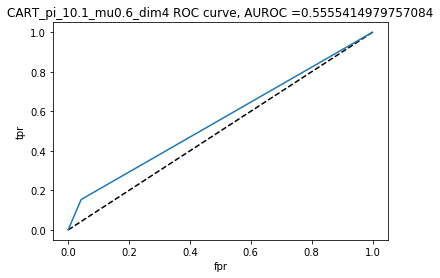

AUROC =  0.5555414979757084


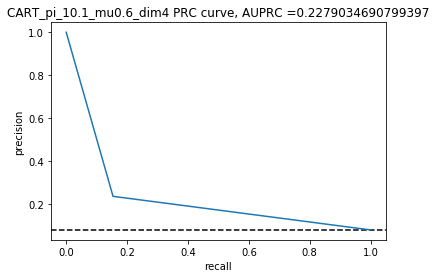

AUPRC =  0.2279034690799397
CART  for train_test split: AUROC =  0.5555414979757084 , AUPRC =  0.2279034690799397 , average precision = , 0.1028657616892911 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9212121212121213 , accuracy =  0.8939393939393939 . 
F1 score =  0.186046511627907 , log loss =  3.663235056328686 , recall = 0.15384615384615385 .
------------------------------------------------------------


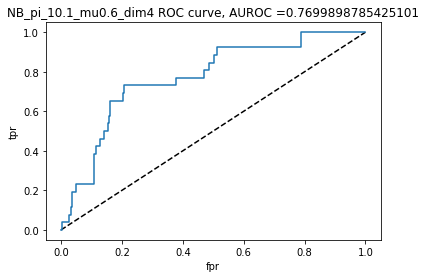

AUROC =  0.7699898785425101


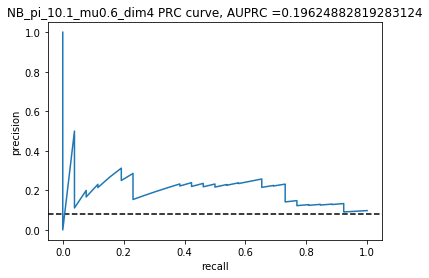

AUPRC =  0.19624882819283124
NB  for train_test split: AUROC =  0.7699898785425101 , AUPRC =  0.19624882819283124 , average precision = , 0.08537296037296038 . 
Best threshold for ROC =  0.090547656007097 , accuracy for the best ROC threshold is then  0.7848484848484848 , accuracy =  0.9151515151515152 . 
F1 score =  0.06666666666666668 , log loss =  2.9305701146963328 , recall = 0.038461538461538464 .
------------------------------------------------------------


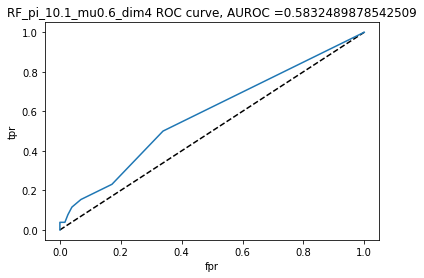

AUROC =  0.5832489878542509


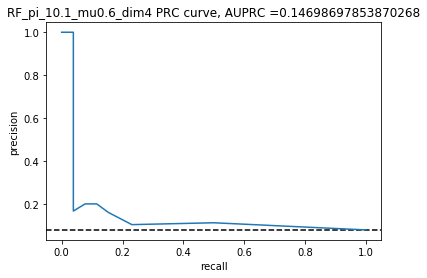

AUPRC =  0.14698697853870268
RF  for train_test split: AUROC =  0.5832489878542509 , AUPRC =  0.14698697853870268 , average precision = , 0.08216783216783217 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.7818181818181819 , accuracy =  0.9090909090909091 . 
F1 score =  0.0625 , log loss =  3.1399008782862774 , recall = 0.038461538461538464 .
------------------------------------------------------------


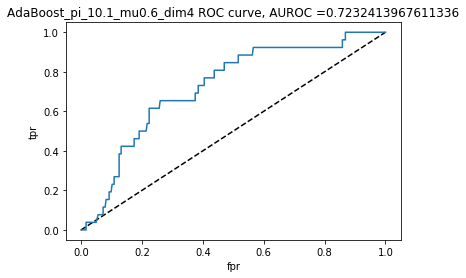

AUROC =  0.7232413967611336


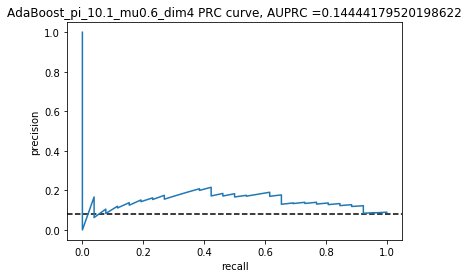

AUPRC =  0.14444179520198622
AdaBoost  for train_test split: AUROC =  0.7232413967611336 , AUPRC =  0.14444179520198622 , average precision = , 0.08056526806526806 . 
Best threshold for ROC =  0.4814672472514193 , accuracy for the best ROC threshold is then  0.6545454545454545 , accuracy =  0.9030303030303031 . 
F1 score =  0.058823529411764705 , log loss =  3.3492316418762225 , recall = 0.038461538461538464 .
------------------------------------------------------------
The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.6 , dim = 6  is 0.098 .


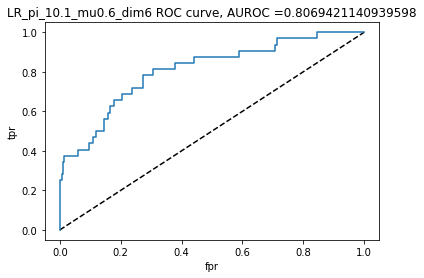

AUROC =  0.8069421140939598


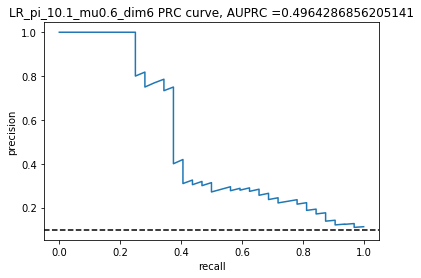

AUPRC =  0.4964286856205141
LR  for train_test split: AUROC =  0.8069421140939598 , AUPRC =  0.4964286856205141 , average precision = , 0.1534090909090909 . 
Best threshold for ROC =  0.102112187980984 , accuracy for the best ROC threshold is then  0.7303030303030303 , accuracy =  0.9090909090909091 . 
F1 score =  0.11764705882352941 , log loss =  3.139888763173699 , recall = 0.0625 .
------------------------------------------------------------


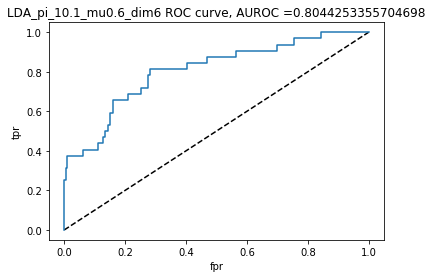

AUROC =  0.8044253355704698


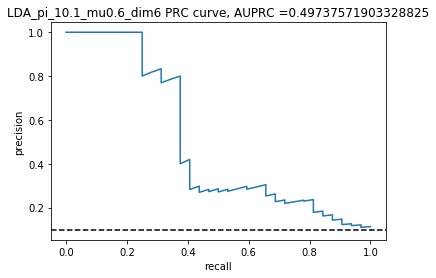

AUPRC =  0.49737571903328825
LDA  for train_test split: AUROC =  0.8044253355704698 , AUPRC =  0.49737571903328825 , average precision = , 0.1816287878787879 . 
Best threshold for ROC =  0.0948465762769659 , accuracy for the best ROC threshold is then  0.7272727272727273 , accuracy =  0.9121212121212121 . 
F1 score =  0.17142857142857143 , log loss =  3.035225804401242 , recall = 0.09375 .
------------------------------------------------------------


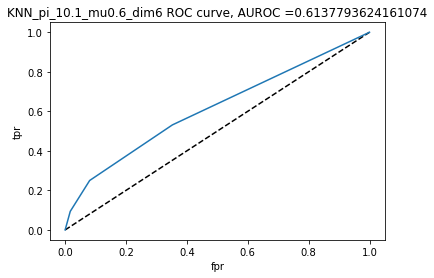

AUROC =  0.6137793624161074


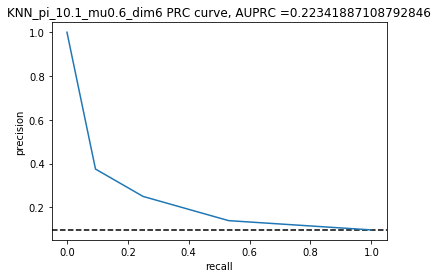

AUPRC =  0.22341887108792846
KNN  for train_test split: AUROC =  0.6137793624161074 , AUPRC =  0.22341887108792846 , average precision = , 0.12303503787878788 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8545454545454545 , accuracy =  0.896969696969697 . 
F1 score =  0.15 , log loss =  3.5585527133761046 , recall = 0.09375 .
------------------------------------------------------------


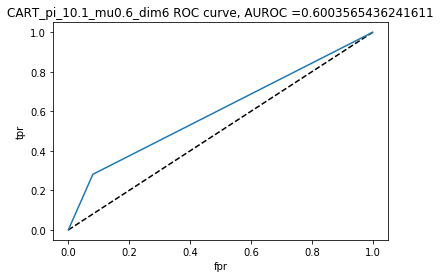

AUROC =  0.6003565436241611


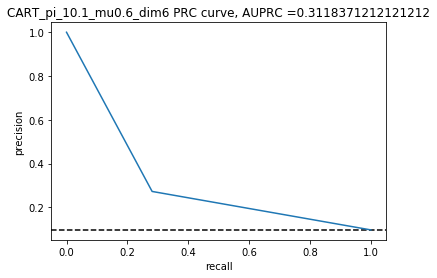

AUPRC =  0.3118371212121212
CART  for train_test split: AUROC =  0.6003565436241611 , AUPRC =  0.3118371212121212 , average precision = , 0.14640151515151514 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9030303030303031 , accuracy =  0.8575757575757575 . 
F1 score =  0.2769230769230769 , log loss =  4.9192172148458395 , recall = 0.28125 .
------------------------------------------------------------


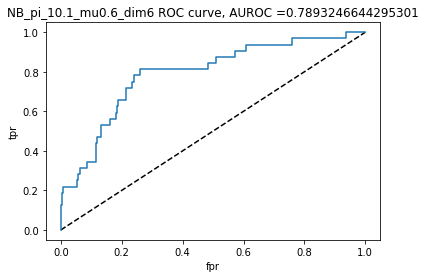

AUROC =  0.7893246644295301


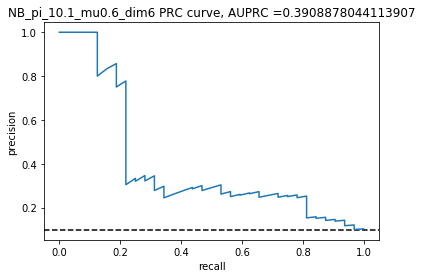

AUPRC =  0.3908878044113907
NB  for train_test split: AUROC =  0.7893246644295301 , AUPRC =  0.3908878044113907 , average precision = , 0.20984848484848484 . 
Best threshold for ROC =  0.10327197184047311 , accuracy for the best ROC threshold is then  0.7606060606060606 , accuracy =  0.9151515151515152 . 
F1 score =  0.2222222222222222 , log loss =  2.9305628456287858 , recall = 0.125 .
------------------------------------------------------------


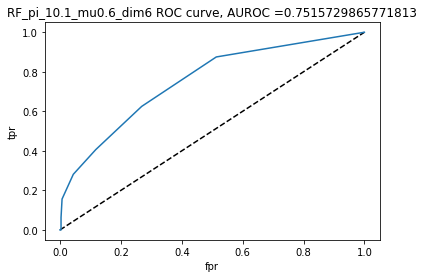

AUROC =  0.7515729865771813


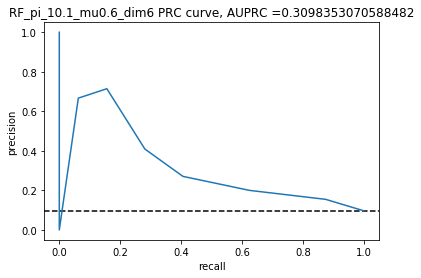

AUPRC =  0.3098353070588482
RF  for train_test split: AUROC =  0.7515729865771813 , AUPRC =  0.3098353070588482 , average precision = , 0.13257575757575757 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8363636363636363 , accuracy =  0.906060606060606 . 
F1 score =  0.11428571428571428 , log loss =  3.2445541449686717 , recall = 0.0625 .
------------------------------------------------------------


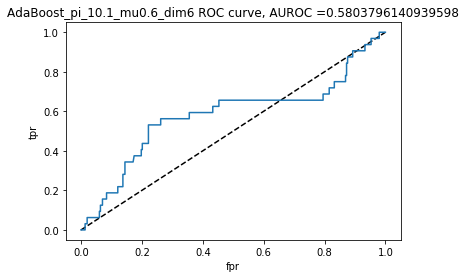

AUROC =  0.5803796140939598


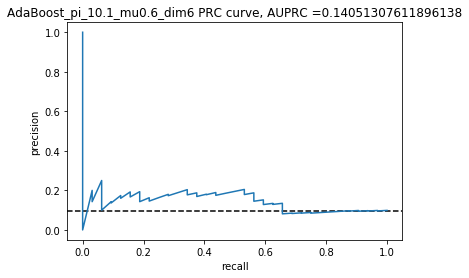

AUPRC =  0.14051307611896138
AdaBoost  for train_test split: AUROC =  0.5803796140939598 , AUPRC =  0.14051307611896138 , average precision = , 0.10132575757575758 . 
Best threshold for ROC =  0.4719910830581372 , accuracy for the best ROC threshold is then  0.5727272727272728 , accuracy =  0.8787878787878788 . 
F1 score =  0.09090909090909091 , log loss =  4.186542581123422 , recall = 0.0625 .
------------------------------------------------------------
The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.6 , dim = 8  is 0.097 .


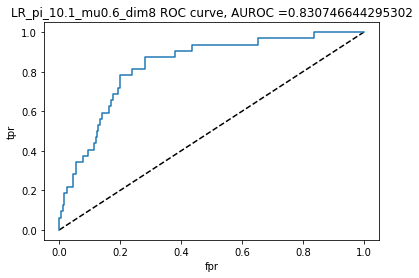

AUROC =  0.830746644295302


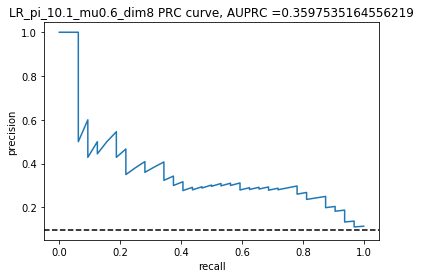

AUPRC =  0.3597535164556219
LR  for train_test split: AUROC =  0.830746644295302 , AUPRC =  0.3597535164556219 , average precision = , 0.14040404040404042 . 
Best threshold for ROC =  0.12081266423263644 , accuracy for the best ROC threshold is then  0.7666666666666667 , accuracy =  0.9 . 
F1 score =  0.1951219512195122 , log loss =  3.4538897546036478 , recall = 0.125 .
------------------------------------------------------------


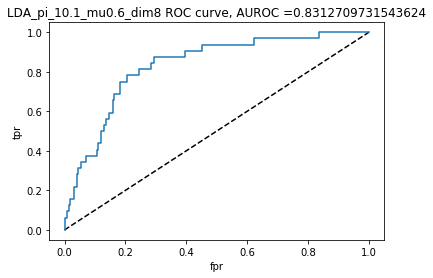

AUROC =  0.8312709731543624


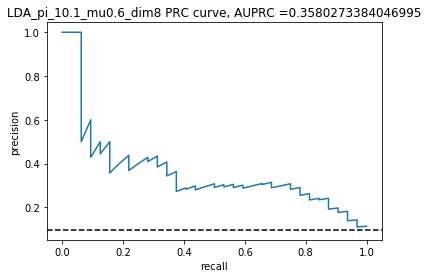

AUPRC =  0.3580273384046995
LDA  for train_test split: AUROC =  0.8312709731543624 , AUPRC =  0.3580273384046995 , average precision = , 0.14040404040404042 . 
Best threshold for ROC =  0.12598407607251413 , accuracy for the best ROC threshold is then  0.7909090909090909 , accuracy =  0.9 . 
F1 score =  0.1951219512195122 , log loss =  3.4538897546036478 , recall = 0.125 .
------------------------------------------------------------


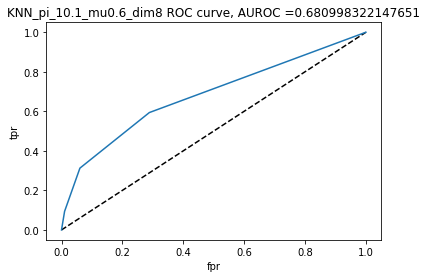

AUROC =  0.680998322147651


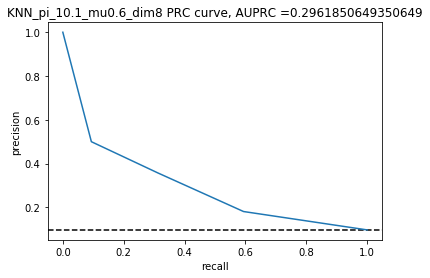

AUPRC =  0.2961850649350649
KNN  for train_test split: AUROC =  0.680998322147651 , AUPRC =  0.2961850649350649 , average precision = , 0.1347537878787879 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8787878787878788 , accuracy =  0.9030303030303031 . 
F1 score =  0.15789473684210525 , log loss =  3.34922194978616 , recall = 0.09375 .
------------------------------------------------------------


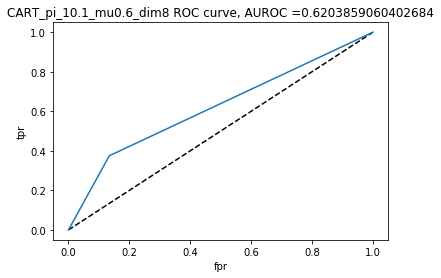

AUROC =  0.6203859060402684


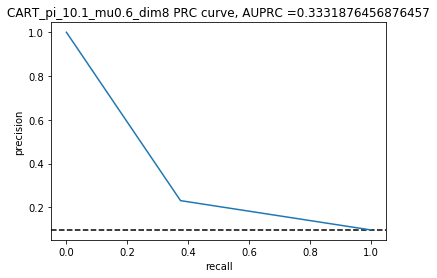

AUPRC =  0.3331876456876457
CART  for train_test split: AUROC =  0.6203859060402684 , AUPRC =  0.3331876456876457 , average precision = , 0.14714452214452214 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9030303030303031 , accuracy =  0.8181818181818182 . 
F1 score =  0.2857142857142857 , log loss =  6.279874447248027 , recall = 0.375 .
------------------------------------------------------------


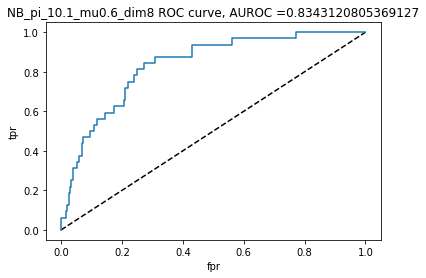

AUROC =  0.8343120805369127


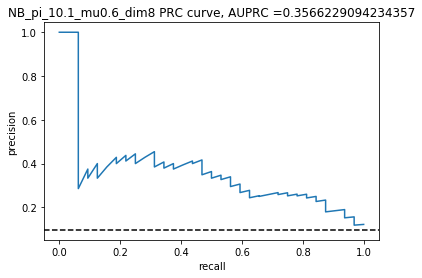

AUPRC =  0.3566229094234357
NB  for train_test split: AUROC =  0.8343120805369127 , AUPRC =  0.3566229094234357 , average precision = , 0.11912878787878788 . 
Best threshold for ROC =  0.10827963082137057 , accuracy for the best ROC threshold is then  0.7636363636363637 , accuracy =  0.8939393939393939 . 
F1 score =  0.14634146341463417 , log loss =  3.6632180951710764 , recall = 0.09375 .
------------------------------------------------------------


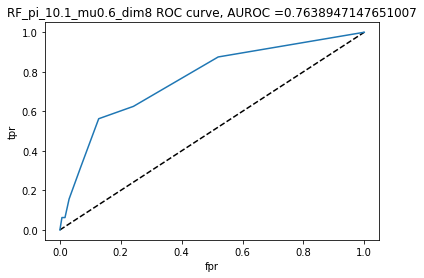

AUROC =  0.7638947147651007


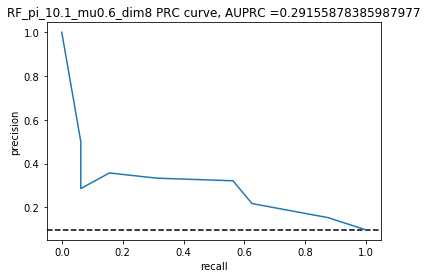

AUPRC =  0.29155878385987977
RF  for train_test split: AUROC =  0.7638947147651007 , AUPRC =  0.29155878385987977 , average precision = , 0.10876623376623376 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8424242424242424 , accuracy =  0.8939393939393939 . 
F1 score =  0.10256410256410256 , log loss =  3.663215672148561 , recall = 0.0625 .
------------------------------------------------------------


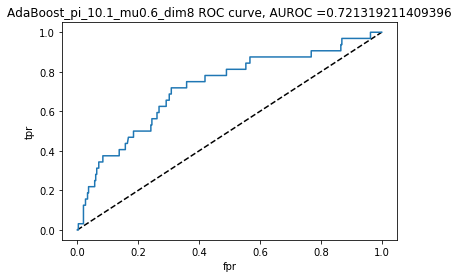

AUROC =  0.721319211409396


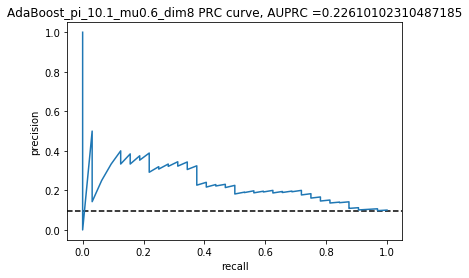

AUPRC =  0.22610102310487185
AdaBoost  for train_test split: AUROC =  0.721319211409396 , AUPRC =  0.22610102310487185 , average precision = , 0.14535984848484848 . 
Best threshold for ROC =  0.48082573069787854 , accuracy for the best ROC threshold is then  0.693939393939394 , accuracy =  0.8787878787878788 . 
F1 score =  0.25925925925925924 , log loss =  4.186554696236001 , recall = 0.21875 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  KNN
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  KNN
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.6 , dim = 10  is 0.096 .


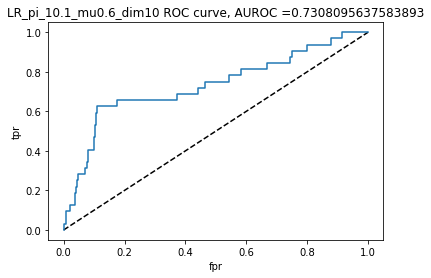

AUROC =  0.7308095637583893


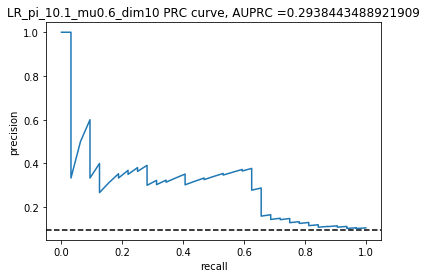

AUPRC =  0.2938443488921909
LR  for train_test split: AUROC =  0.7308095637583893 , AUPRC =  0.2938443488921909 , average precision = , 0.14412878787878786 . 
Best threshold for ROC =  0.08779811978991861 , accuracy for the best ROC threshold is then  0.6333333333333333 , accuracy =  0.906060606060606 . 
F1 score =  0.16216216216216214 , log loss =  3.244556567991187 , recall = 0.09375 .
------------------------------------------------------------


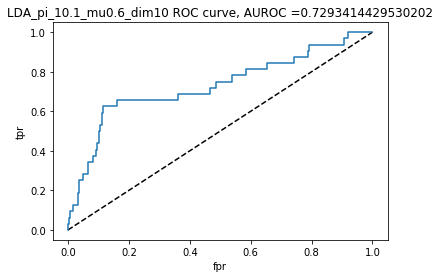

AUROC =  0.7293414429530202


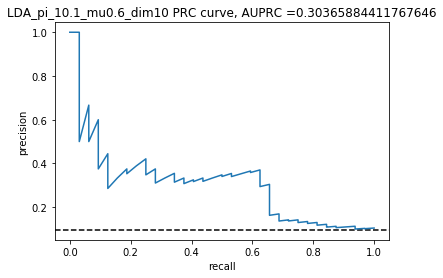

AUPRC =  0.30365884411767646
LDA  for train_test split: AUROC =  0.7293414429530202 , AUPRC =  0.30365884411767646 , average precision = , 0.12215909090909091 . 
Best threshold for ROC =  0.08422625718186878 , accuracy for the best ROC threshold is then  0.6424242424242425 , accuracy =  0.9030303030303031 . 
F1 score =  0.1111111111111111 , log loss =  3.3492195267636435 , recall = 0.0625 .
------------------------------------------------------------


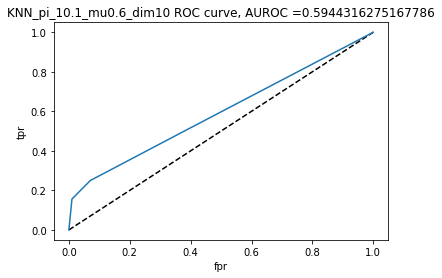

AUROC =  0.5944316275167786


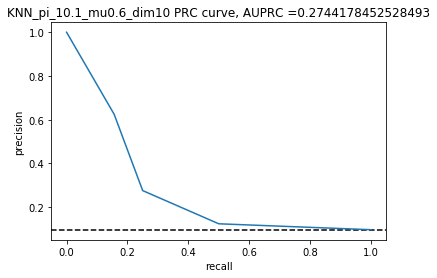

AUPRC =  0.2744178452528493
KNN  for train_test split: AUROC =  0.5944316275167786 , AUPRC =  0.2744178452528493 , average precision = , 0.17947443181818182 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8636363636363636 , accuracy =  0.9090909090909091 . 
F1 score =  0.25 , log loss =  3.1398960322412464 , recall = 0.15625 .
------------------------------------------------------------


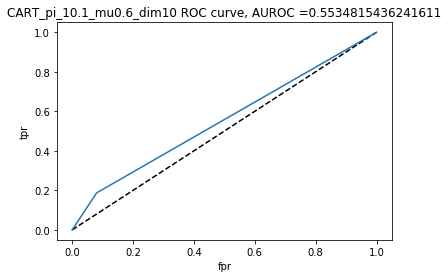

AUROC =  0.5534815436241611


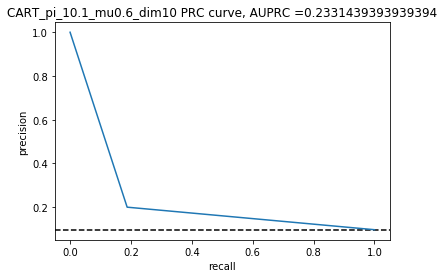

AUPRC =  0.2331439393939394
CART  for train_test split: AUROC =  0.5534815436241611 , AUPRC =  0.2331439393939394 , average precision = , 0.11628787878787879 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9030303030303031 , accuracy =  0.8484848484848485 . 
F1 score =  0.19354838709677422 , log loss =  5.233206091163209 , recall = 0.1875 .
------------------------------------------------------------


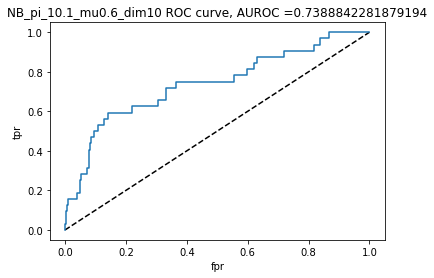

AUROC =  0.7388842281879194


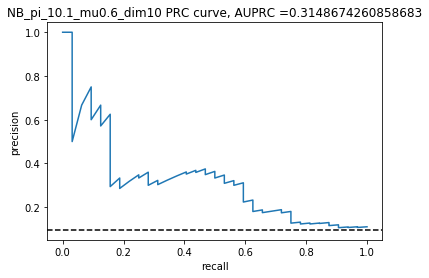

AUPRC =  0.3148674260858683
NB  for train_test split: AUROC =  0.7388842281879194 , AUPRC =  0.3148674260858683 , average precision = , 0.14412878787878786 . 
Best threshold for ROC =  0.08850686238353937 , accuracy for the best ROC threshold is then  0.6696969696969697 , accuracy =  0.906060606060606 . 
F1 score =  0.16216216216216214 , log loss =  3.244556567991187 , recall = 0.09375 .
------------------------------------------------------------


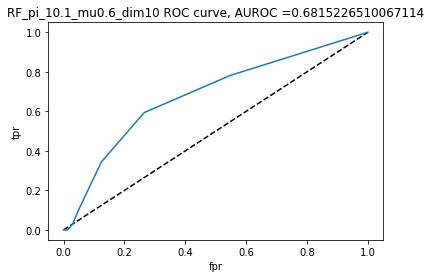

AUROC =  0.6815226510067114


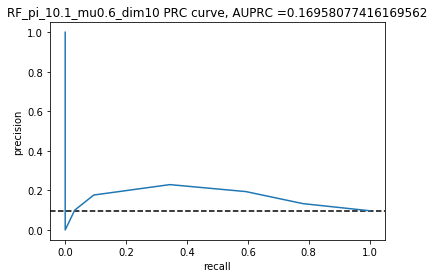

AUPRC =  0.16958077416169562
RF  for train_test split: AUROC =  0.6815226510067114 , AUPRC =  0.16958077416169562 , average precision = , 0.09696969696969697 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8242424242424242 , accuracy =  0.8909090909090909 . 
F1 score =  0.0 , log loss =  3.7678762078985018 , recall = 0.0 .
------------------------------------------------------------


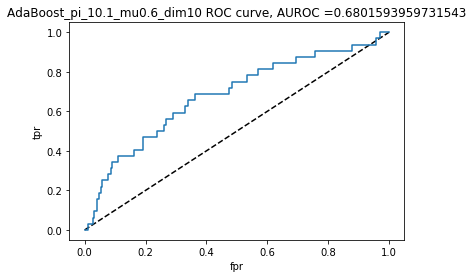

AUROC =  0.6801593959731543


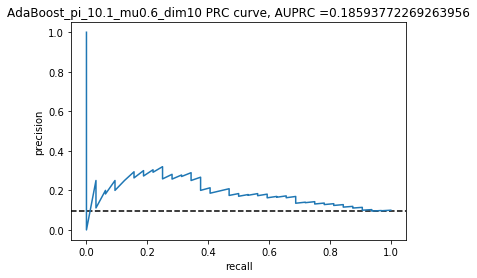

AUPRC =  0.18593772269263956
AdaBoost  for train_test split: AUROC =  0.6801593959731543 , AUPRC =  0.18593772269263956 , average precision = , 0.11609848484848485 . 
Best threshold for ROC =  0.4842003333558417 , accuracy for the best ROC threshold is then  0.6575757575757576 , accuracy =  0.8787878787878788 . 
F1 score =  0.16666666666666666 , log loss =  4.1865474271684535 , recall = 0.125 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  KNN
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  KNN
The best model measured by  log_loss_score is  KNN
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.8 , dim = 2  is 0.078 .


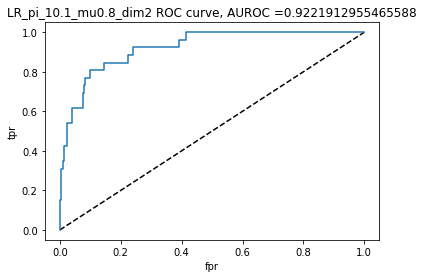

AUROC =  0.9221912955465588


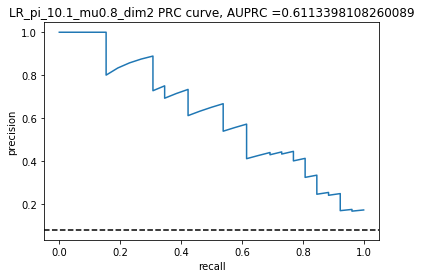

AUPRC =  0.6113398108260089
LR  for train_test split: AUROC =  0.9221912955465588 , AUPRC =  0.6113398108260089 , average precision = , 0.3557109557109557 . 
Best threshold for ROC =  0.12213173430051329 , accuracy for the best ROC threshold is then  0.8515151515151516 , accuracy =  0.9424242424242424 . 
F1 score =  0.5365853658536585 , log loss =  1.9886059087667394 , recall = 0.4230769230769231 .
------------------------------------------------------------


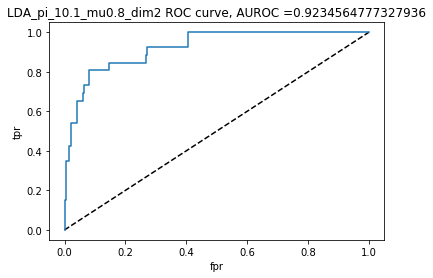

AUROC =  0.9234564777327936


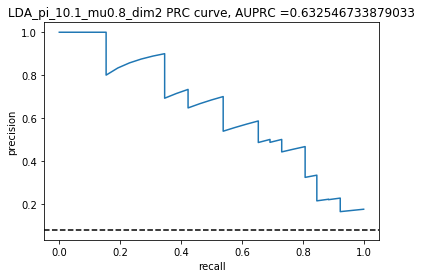

AUPRC =  0.632546733879033
LDA  for train_test split: AUROC =  0.9234564777327936 , AUPRC =  0.632546733879033 , average precision = , 0.3557109557109557 . 
Best threshold for ROC =  0.11487187859967762 , accuracy for the best ROC threshold is then  0.8515151515151516 , accuracy =  0.9424242424242424 . 
F1 score =  0.5365853658536585 , log loss =  1.9886059087667394 , recall = 0.4230769230769231 .
------------------------------------------------------------


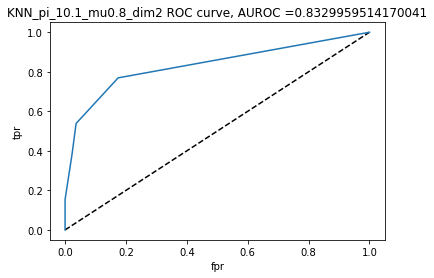

AUROC =  0.8329959514170041


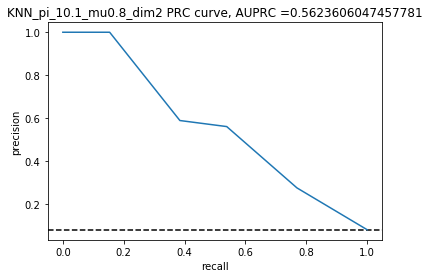

AUPRC =  0.5623606047457781
KNN  for train_test split: AUROC =  0.8329959514170041 , AUPRC =  0.5623606047457781 , average precision = , 0.2747291923762512 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.9303030303030303 , accuracy =  0.9303030303030303 . 
F1 score =  0.46511627906976744 , log loss =  2.407265012924113 , recall = 0.38461538461538464 .
------------------------------------------------------------


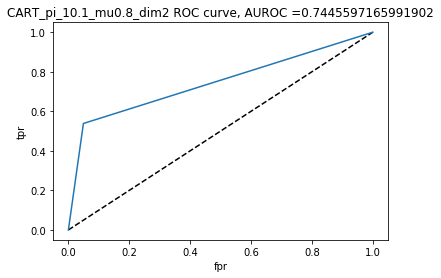

AUROC =  0.7445597165991902


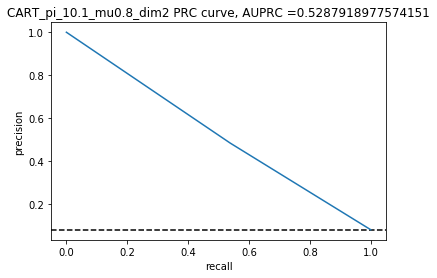

AUPRC =  0.5287918977574151
CART  for train_test split: AUROC =  0.7445597165991902 , AUPRC =  0.5287918977574151 , average precision = , 0.2963105859657584 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9212121212121213 , accuracy =  0.9181818181818182 . 
F1 score =  0.509090909090909 , log loss =  2.8259362321940653 , recall = 0.5384615384615384 .
------------------------------------------------------------


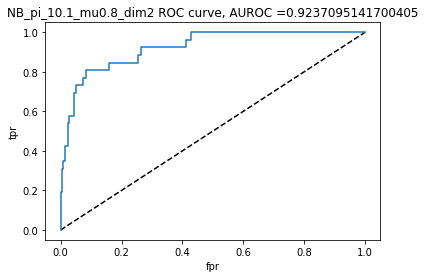

AUROC =  0.9237095141700405


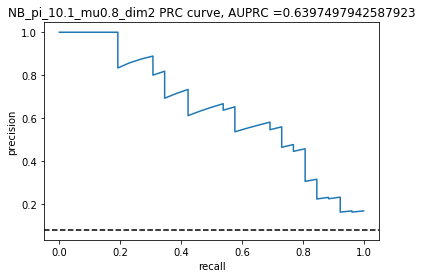

AUPRC =  0.6397497942587923
NB  for train_test split: AUROC =  0.9237095141700405 , AUPRC =  0.6397497942587923 , average precision = , 0.3557109557109557 . 
Best threshold for ROC =  0.10386389127765286 , accuracy for the best ROC threshold is then  0.8393939393939394 , accuracy =  0.9424242424242424 . 
F1 score =  0.5365853658536585 , log loss =  1.9886059087667394 , recall = 0.4230769230769231 .
------------------------------------------------------------


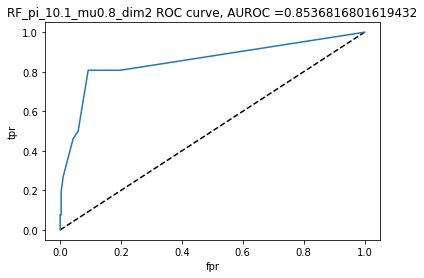

AUROC =  0.8536816801619432


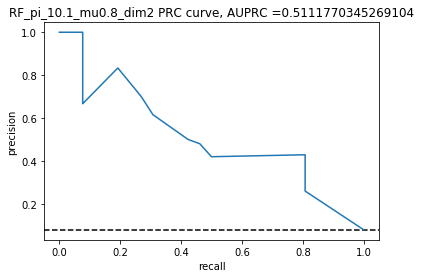

AUPRC =  0.5111770345269104
RF  for train_test split: AUROC =  0.8536816801619432 , AUPRC =  0.5111770345269104 , average precision = , 0.24389456697149006 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.9 , accuracy =  0.9303030303030303 . 
F1 score =  0.4102564102564103 , log loss =  2.4072601668790816 , recall = 0.3076923076923077 .
------------------------------------------------------------


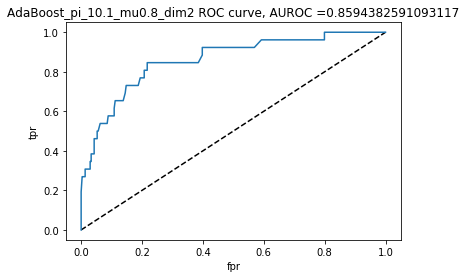

AUROC =  0.8594382591093117


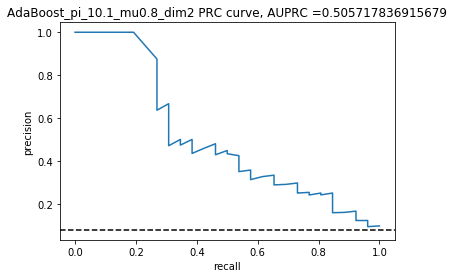

AUPRC =  0.505717836915679
AdaBoost  for train_test split: AUROC =  0.8594382591093117 , AUPRC =  0.505717836915679 , average precision = , 0.23936480186480183 . 
Best threshold for ROC =  0.4850555345454766 , accuracy for the best ROC threshold is then  0.7909090909090909 , accuracy =  0.9151515151515152 . 
F1 score =  0.43999999999999995 , log loss =  2.9305943449214906 , recall = 0.4230769230769231 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.8 , dim = 4  is 0.115 .


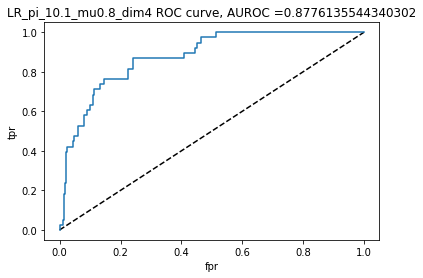

AUROC =  0.8776135544340302


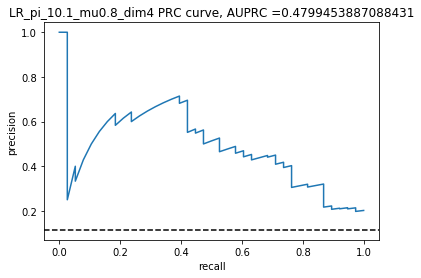

AUPRC =  0.4799453887088431
LR  for train_test split: AUROC =  0.8776135544340302 , AUPRC =  0.4799453887088431 , average precision = , 0.33883572567783093 . 
Best threshold for ROC =  0.1225245055644439 , accuracy for the best ROC threshold is then  0.7757575757575758 , accuracy =  0.9090909090909091 . 
F1 score =  0.5 , log loss =  3.1399057243313093 , recall = 0.39473684210526316 .
------------------------------------------------------------


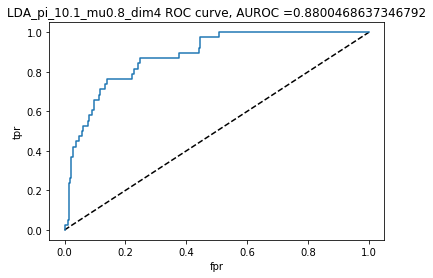

AUROC =  0.8800468637346792


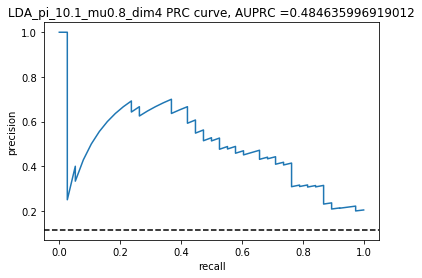

AUPRC =  0.484635996919012
LDA  for train_test split: AUROC =  0.8800468637346792 , AUPRC =  0.484635996919012 , average precision = , 0.3271340406351848 . 
Best threshold for ROC =  0.11770661983474691 , accuracy for the best ROC threshold is then  0.7757575757575758 , accuracy =  0.906060606060606 . 
F1 score =  0.49180327868852464 , log loss =  3.2445711061262816 , recall = 0.39473684210526316 .
------------------------------------------------------------


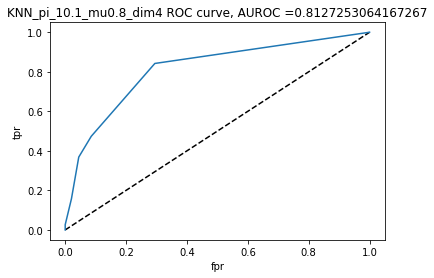

AUROC =  0.8127253064167267


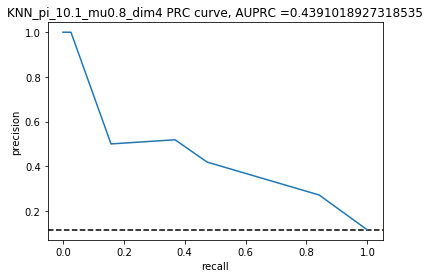

AUPRC =  0.4391018927318535
KNN  for train_test split: AUROC =  0.8127253064167267 , AUPRC =  0.4391018927318535 , average precision = , 0.2637604111288322 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8636363636363636 , accuracy =  0.8878787878787879 . 
F1 score =  0.4307692307692308 , log loss =  3.8725609738735995 , recall = 0.3684210526315789 .
------------------------------------------------------------


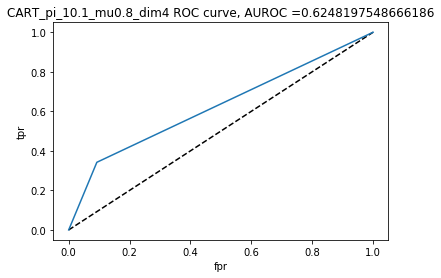

AUROC =  0.6248197548666186


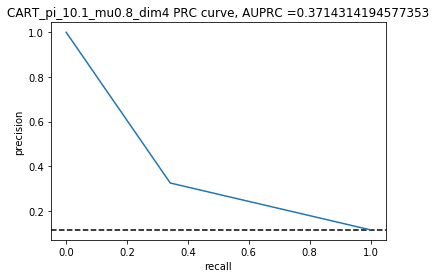

AUPRC =  0.3714314194577353
CART  for train_test split: AUROC =  0.6248197548666186 , AUPRC =  0.3714314194577353 , average precision = , 0.18694178628389158 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8848484848484849 , accuracy =  0.8424242424242424 . 
F1 score =  0.33333333333333337 , log loss =  5.442539277775669 , recall = 0.34210526315789475 .
------------------------------------------------------------


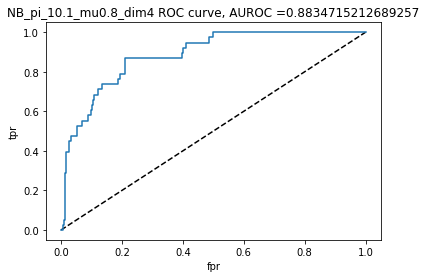

AUROC =  0.8834715212689257


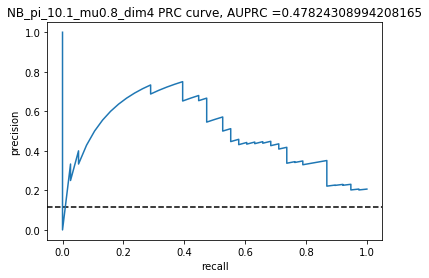

AUPRC =  0.47824308994208165
NB  for train_test split: AUROC =  0.8834715212689257 , AUPRC =  0.47824308994208165 , average precision = , 0.3271340406351848 . 
Best threshold for ROC =  0.11801404555010091 , accuracy for the best ROC threshold is then  0.793939393939394 , accuracy =  0.906060606060606 . 
F1 score =  0.49180327868852464 , log loss =  3.244571106126281 , recall = 0.39473684210526316 .
------------------------------------------------------------


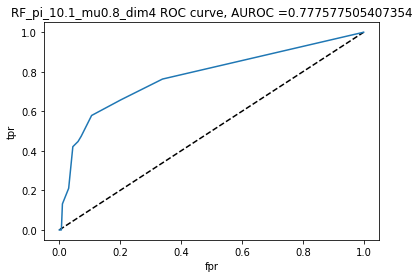

AUROC =  0.777577505407354


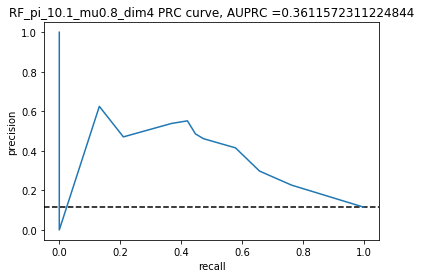

AUPRC =  0.3611572311224844
RF  for train_test split: AUROC =  0.777577505407354 , AUPRC =  0.3611572311224844 , average precision = , 0.29897156684815485 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.7818181818181819 , accuracy =  0.8939393939393939 . 
F1 score =  0.47761194029850745 , log loss =  3.663235056328686 , recall = 0.42105263157894735 .
------------------------------------------------------------


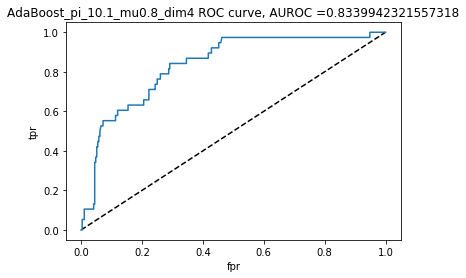

AUROC =  0.8339942321557318


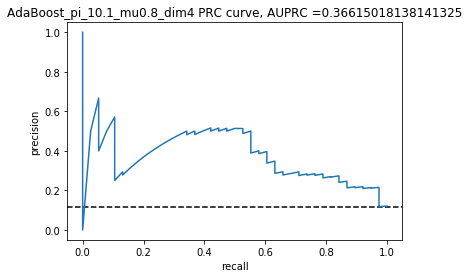

AUPRC =  0.36615018138141325
AdaBoost  for train_test split: AUROC =  0.8339942321557318 , AUPRC =  0.36615018138141325 , average precision = , 0.3143325143325143 . 
Best threshold for ROC =  0.4855926061580757 , accuracy for the best ROC threshold is then  0.7484848484848485 , accuracy =  0.8878787878787879 . 
F1 score =  0.5066666666666666 , log loss =  3.8725730889861785 , recall = 0.5 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  AdaBoost
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.1 , mu = 0.8 , dim = 6  is 0.112 .


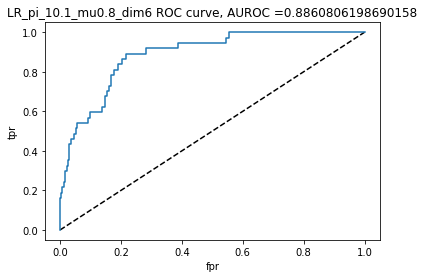

AUROC =  0.8860806198690158


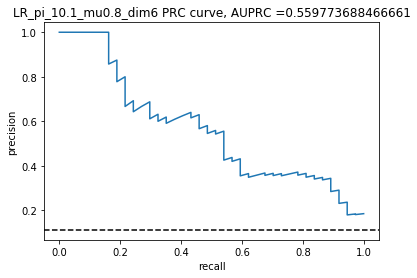

AUPRC =  0.559773688466661
LR  for train_test split: AUROC =  0.8860806198690158 , AUPRC =  0.559773688466661 , average precision = , 0.32004504504504505 . 
Best threshold for ROC =  0.11135268512335542 , accuracy for the best ROC threshold is then  0.8121212121212121 , accuracy =  0.906060606060606 . 
F1 score =  0.4918032786885246 , log loss =  3.244573529148797 , recall = 0.40540540540540543 .
------------------------------------------------------------


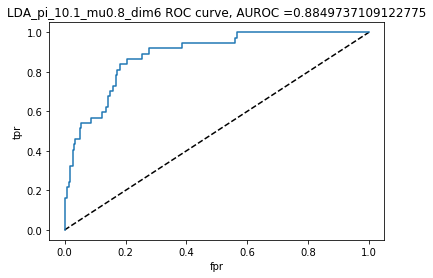

AUROC =  0.8849737109122775


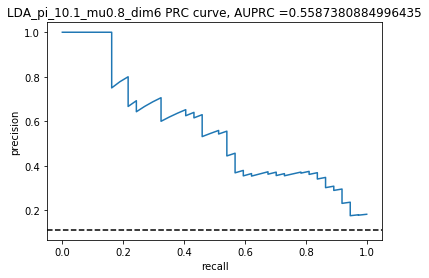

AUPRC =  0.5587380884996435
LDA  for train_test split: AUROC =  0.8849737109122775 , AUPRC =  0.5587380884996435 , average precision = , 0.3310614962788876 . 
Best threshold for ROC =  0.11411350714417005 , accuracy for the best ROC threshold is then  0.8212121212121212 , accuracy =  0.9090909090909091 . 
F1 score =  0.5 , log loss =  3.1399081473538253 , recall = 0.40540540540540543 .
------------------------------------------------------------


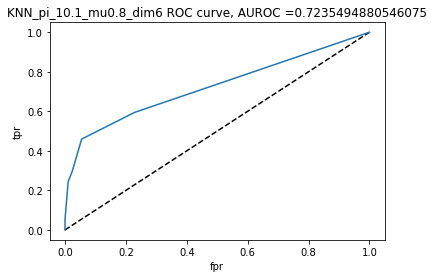

AUROC =  0.7235494880546075


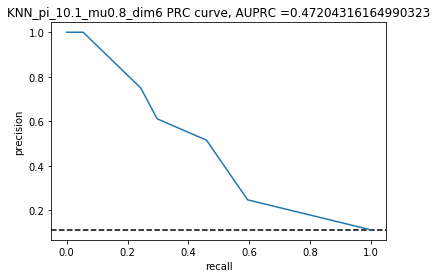

AUPRC =  0.47204316164990323
KNN  for train_test split: AUROC =  0.7235494880546075 , AUPRC =  0.47204316164990323 , average precision = , 0.2604695604695605 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8909090909090909 , accuracy =  0.9 . 
F1 score =  0.39999999999999997 , log loss =  3.4538946006486793 , recall = 0.2972972972972973 .
------------------------------------------------------------


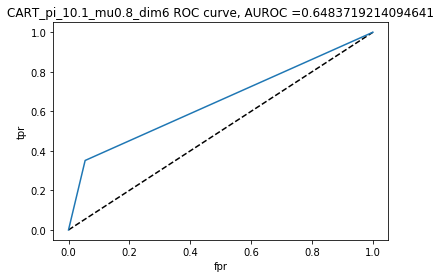

AUROC =  0.6483719214094641


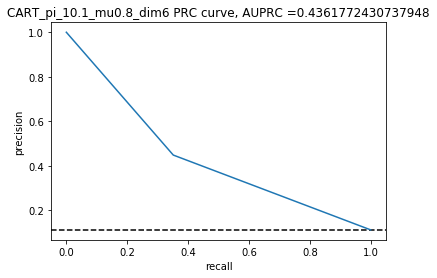

AUPRC =  0.4361772430737948
CART  for train_test split: AUROC =  0.6483719214094641 , AUPRC =  0.4361772430737948 , average precision = , 0.23022960264339576 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8878787878787879 , accuracy =  0.8787878787878788 . 
F1 score =  0.393939393939394 , log loss =  4.186557119258517 , recall = 0.35135135135135137 .
------------------------------------------------------------


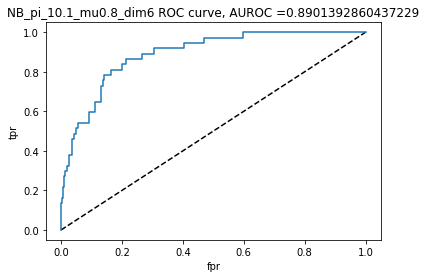

AUROC =  0.8901392860437229


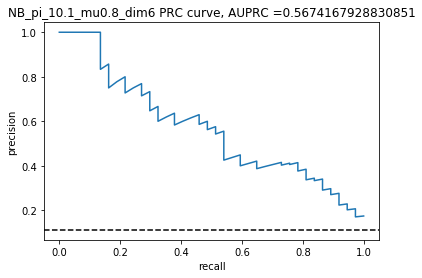

AUPRC =  0.5674167928830851
NB  for train_test split: AUROC =  0.8901392860437229 , AUPRC =  0.5674167928830851 , average precision = , 0.3104832104832105 . 
Best threshold for ROC =  0.09787957075236733 , accuracy for the best ROC threshold is then  0.803030303030303 , accuracy =  0.906060606060606 . 
F1 score =  0.4745762711864407 , log loss =  3.2445711061262816 , recall = 0.3783783783783784 .
------------------------------------------------------------


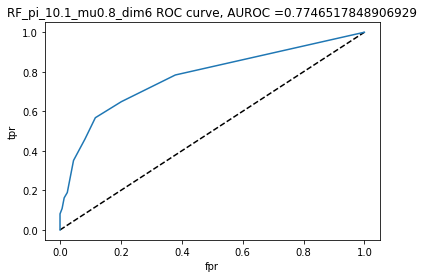

AUROC =  0.7746517848906929


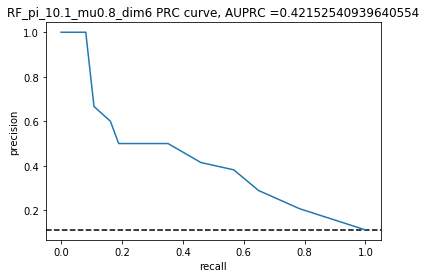

AUPRC =  0.42152540939640554
RF  for train_test split: AUROC =  0.7746517848906929 , AUPRC =  0.42152540939640554 , average precision = , 0.1855036855036855 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8484848484848485 , accuracy =  0.8878787878787879 . 
F1 score =  0.2745098039215686 , log loss =  3.872546435738505 , recall = 0.1891891891891892 .
------------------------------------------------------------


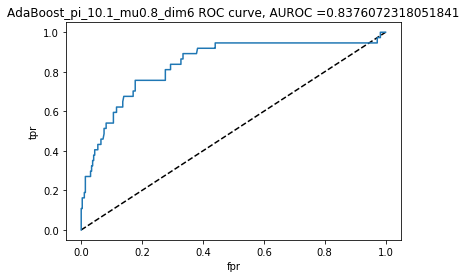

AUROC =  0.8376072318051841


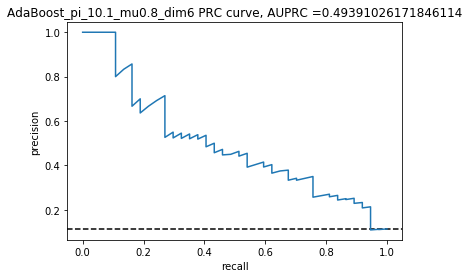

AUPRC =  0.49391026171846114
AdaBoost  for train_test split: AUROC =  0.8376072318051841 , AUPRC =  0.49391026171846114 , average precision = , 0.28384813384813384 . 
Best threshold for ROC =  0.48032577214121563 , accuracy for the best ROC threshold is then  0.7363636363636363 , accuracy =  0.8939393939393939 . 
F1 score =  0.46153846153846156 , log loss =  3.663235056328687 , recall = 0.40540540540540543 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.1 , mu = 0.8 , dim = 8  is 0.091 .


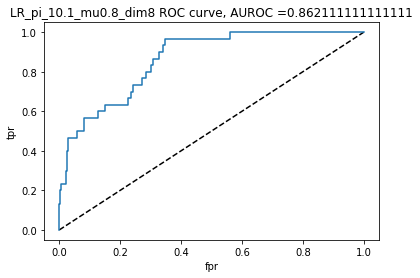

AUROC =  0.862111111111111


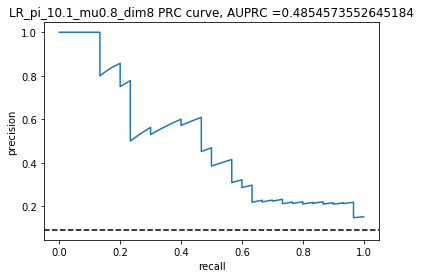

AUPRC =  0.4854573552645184
LR  for train_test split: AUROC =  0.862111111111111 , AUPRC =  0.4854573552645184 , average precision = , 0.23303030303030303 . 
Best threshold for ROC =  0.06321830888170786 , accuracy for the best ROC threshold is then  0.7303030303030303 , accuracy =  0.9212121212121213 . 
F1 score =  0.35 , log loss =  2.7212441971514196 , recall = 0.23333333333333334 .
------------------------------------------------------------


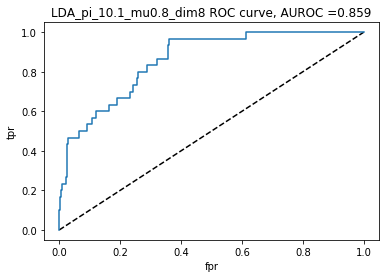

AUROC =  0.859


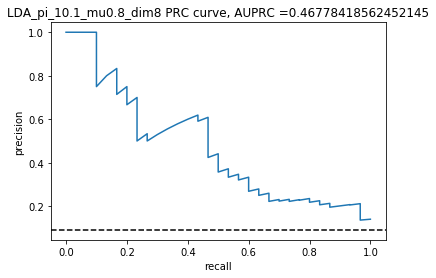

AUPRC =  0.46778418562452145
LDA  for train_test split: AUROC =  0.859 , AUPRC =  0.46778418562452145 , average precision = , 0.23303030303030303 . 
Best threshold for ROC =  0.0620467542104954 , accuracy for the best ROC threshold is then  0.7454545454545455 , accuracy =  0.9212121212121213 . 
F1 score =  0.35 , log loss =  2.7212441971514196 , recall = 0.23333333333333334 .
------------------------------------------------------------


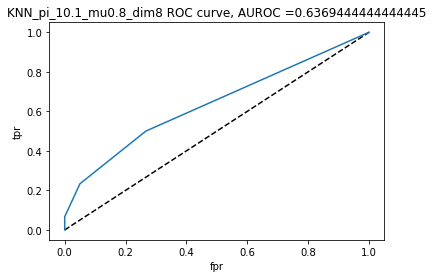

AUROC =  0.6369444444444445


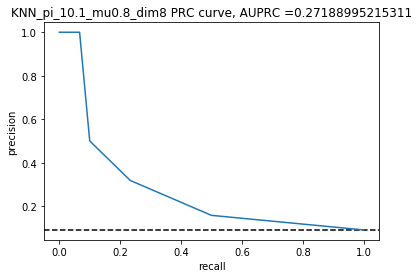

AUPRC =  0.27188995215311
KNN  for train_test split: AUROC =  0.6369444444444445 , AUPRC =  0.27188995215311 , average precision = , 0.13181818181818183 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8848484848484849 , accuracy =  0.9090909090909091 . 
F1 score =  0.16666666666666669 , log loss =  3.1398960322412455 , recall = 0.1 .
------------------------------------------------------------


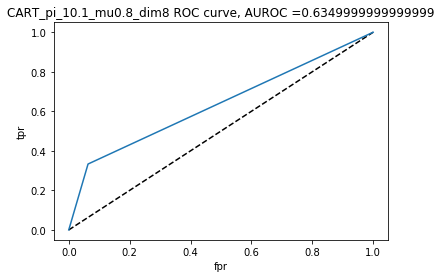

AUROC =  0.6349999999999999


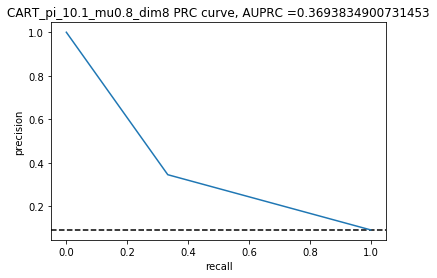

AUPRC =  0.3693834900731453
CART  for train_test split: AUROC =  0.6349999999999999 , AUPRC =  0.3693834900731453 , average precision = , 0.1755485893416928 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9090909090909091 , accuracy =  0.8818181818181818 . 
F1 score =  0.33898305084745767 , log loss =  4.081901429553607 , recall = 0.3333333333333333 .
------------------------------------------------------------


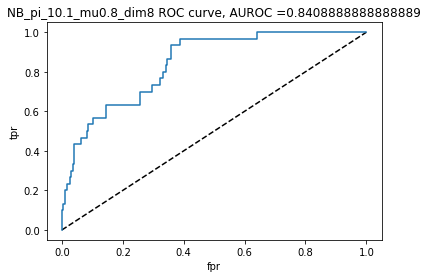

AUROC =  0.8408888888888889


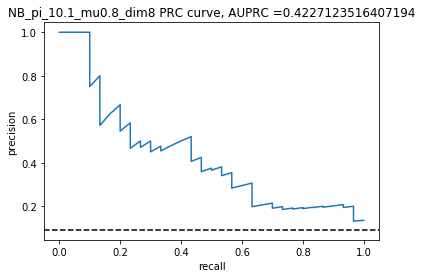

AUPRC =  0.4227123516407194
NB  for train_test split: AUROC =  0.8408888888888889 , AUPRC =  0.4227123516407194 , average precision = , 0.20606060606060606 . 
Best threshold for ROC =  0.05599446164105267 , accuracy for the best ROC threshold is then  0.706060606060606 , accuracy =  0.9181818181818182 . 
F1 score =  0.30769230769230765 , log loss =  2.825907155923876 , recall = 0.2 .
------------------------------------------------------------


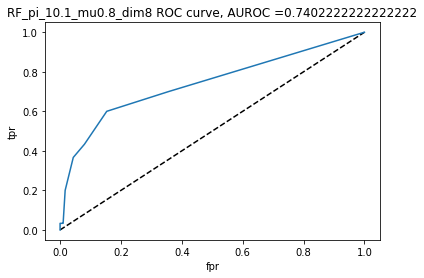

AUROC =  0.7402222222222222


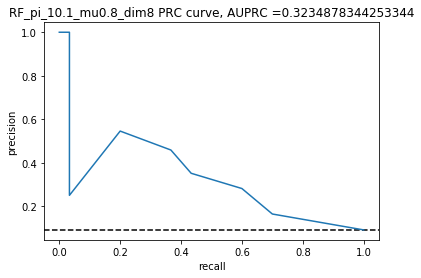

AUPRC =  0.3234878344253344
RF  for train_test split: AUROC =  0.7402222222222222 , AUPRC =  0.3234878344253344 , average precision = , 0.09621212121212121 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.8242424242424242 , accuracy =  0.9030303030303031 . 
F1 score =  0.058823529411764705 , log loss =  3.3492219497861595 , recall = 0.03333333333333333 .
------------------------------------------------------------


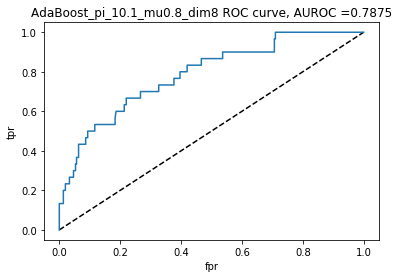

AUROC =  0.7875


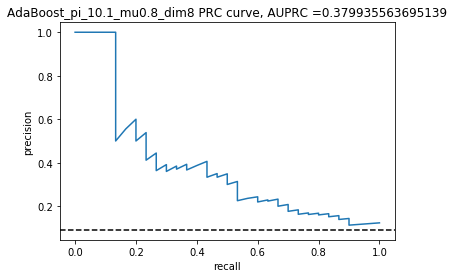

AUPRC =  0.379935563695139
AdaBoost  for train_test split: AUROC =  0.7875 , AUPRC =  0.379935563695139 , average precision = , 0.16363636363636364 . 
Best threshold for ROC =  0.4740871940406457 , accuracy for the best ROC threshold is then  0.6787878787878788 , accuracy =  0.8909090909090909 . 
F1 score =  0.30769230769230765 , log loss =  3.7679004381236596 , recall = 0.26666666666666666 .
------------------------------------------------------------
The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 0.8 , dim = 10  is 0.095 .


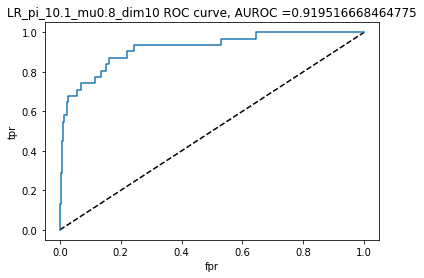

AUROC =  0.919516668464775


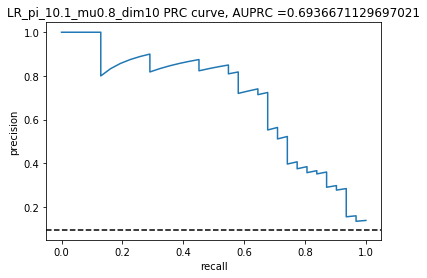

AUPRC =  0.6936671129697021
LR  for train_test split: AUROC =  0.919516668464775 , AUPRC =  0.6936671129697021 , average precision = , 0.4234316600540509 . 
Best threshold for ROC =  0.14321898717244375 , accuracy for the best ROC threshold is then  0.8424242424242424 , accuracy =  0.9393939393939394 . 
F1 score =  0.5833333333333333 , log loss =  2.09326644451668 , recall = 0.45161290322580644 .
------------------------------------------------------------


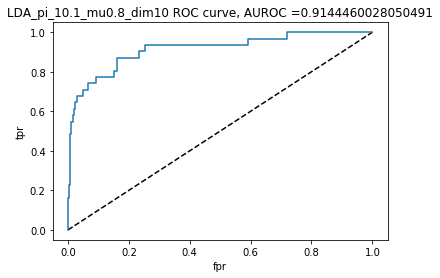

AUROC =  0.9144460028050491


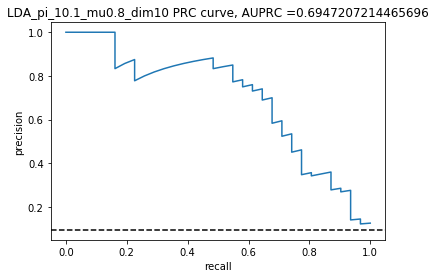

AUPRC =  0.6947207214465696
LDA  for train_test split: AUROC =  0.9144460028050491 , AUPRC =  0.6947207214465696 , average precision = , 0.5085532746823069 . 
Best threshold for ROC =  0.14262145374883706 , accuracy for the best ROC threshold is then  0.8393939393939394 , accuracy =  0.9484848484848485 . 
F1 score =  0.6666666666666665 , log loss =  1.7792775681993103 , recall = 0.5483870967741935 .
------------------------------------------------------------


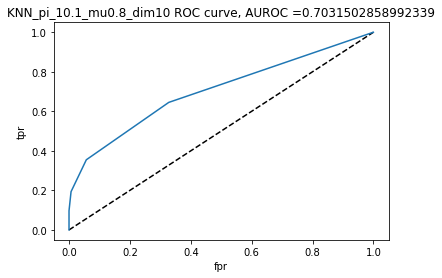

AUROC =  0.7031502858992339


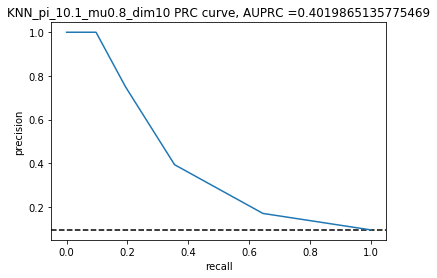

AUPRC =  0.4019865135775469
KNN  for train_test split: AUROC =  0.7031502858992339 , AUPRC =  0.4019865135775469 , average precision = , 0.22091886608015637 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8878787878787879 , accuracy =  0.9181818181818182 . 
F1 score =  0.30769230769230765 , log loss =  2.825904732901361 , recall = 0.1935483870967742 .
------------------------------------------------------------


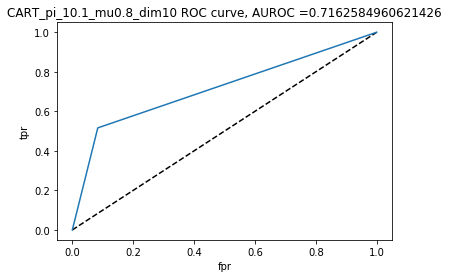

AUROC =  0.7162584960621426


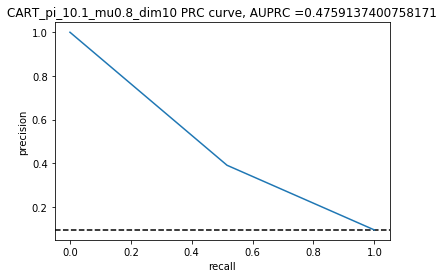

AUPRC =  0.4759137400758171
CART  for train_test split: AUROC =  0.7162584960621426 , AUPRC =  0.4759137400758171 , average precision = , 0.24687075316500967 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.906060606060606 , accuracy =  0.8787878787878788 . 
F1 score =  0.4444444444444444 , log loss =  4.186578926461159 , recall = 0.5161290322580645 .
------------------------------------------------------------


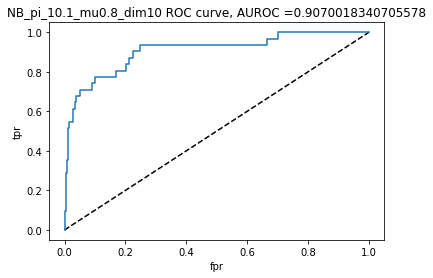

AUROC =  0.9070018340705578


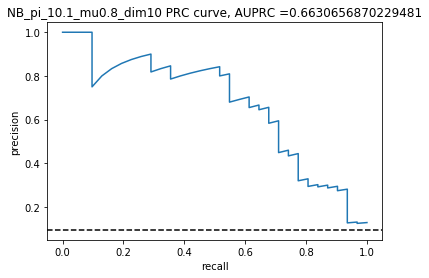

AUPRC =  0.6630656870229481
NB  for train_test split: AUROC =  0.9070018340705578 , AUPRC =  0.6630656870229481 , average precision = , 0.4517106549364614 . 
Best threshold for ROC =  0.11804148345809524 , accuracy for the best ROC threshold is then  0.803030303030303 , accuracy =  0.9424242424242424 . 
F1 score =  0.6122448979591837 , log loss =  1.9886034857442239 , recall = 0.4838709677419355 .
------------------------------------------------------------


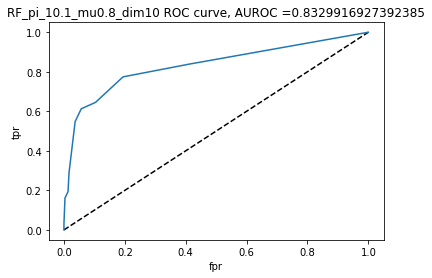

AUROC =  0.8329916927392385


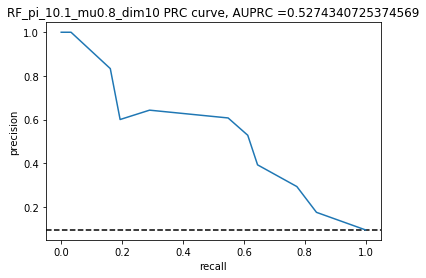

AUPRC =  0.5274340725374569
RF  for train_test split: AUROC =  0.8329916927392385 , AUPRC =  0.5274340725374569 , average precision = , 0.2533026113671275 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8727272727272727 , accuracy =  0.9181818181818182 . 
F1 score =  0.4 , log loss =  2.825912001968908 , recall = 0.2903225806451613 .
------------------------------------------------------------


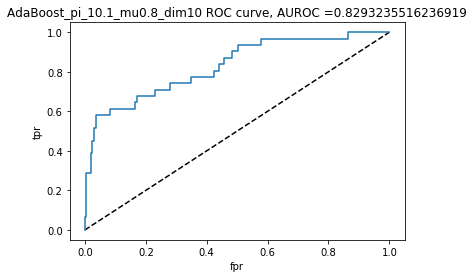

AUROC =  0.8293235516236919


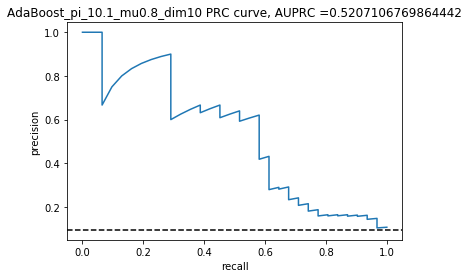

AUPRC =  0.5207106769864442
AdaBoost  for train_test split: AUROC =  0.8293235516236919 , AUPRC =  0.5207106769864442 , average precision = , 0.3389051808406647 . 
Best threshold for ROC =  0.47834111136431284 , accuracy for the best ROC threshold is then  0.7212121212121212 , accuracy =  0.9242424242424242 . 
F1 score =  0.5283018867924528 , log loss =  2.6165933534915418 , recall = 0.45161290322580644 .
------------------------------------------------------------
The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LDA
Positive ratio for pi_1 = 0.1 , mu = 1 , dim = 2  is 0.097 .


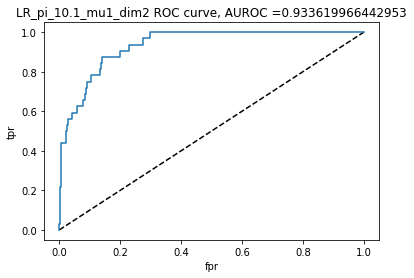

AUROC =  0.933619966442953


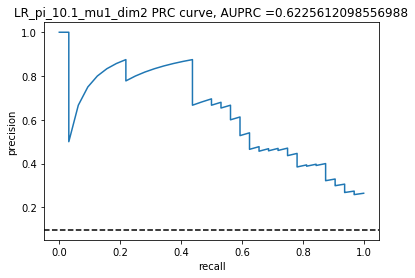

AUPRC =  0.6225612098556988
LR  for train_test split: AUROC =  0.933619966442953 , AUPRC =  0.6225612098556988 , average precision = , 0.3462121212121212 . 
Best threshold for ROC =  0.11397811099148186 , accuracy for the best ROC threshold is then  0.8606060606060606 , accuracy =  0.9242424242424242 . 
F1 score =  0.5283018867924528 , log loss =  2.6165909304690262 , recall = 0.4375 .
------------------------------------------------------------


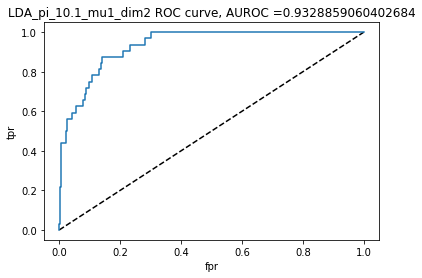

AUROC =  0.9328859060402684


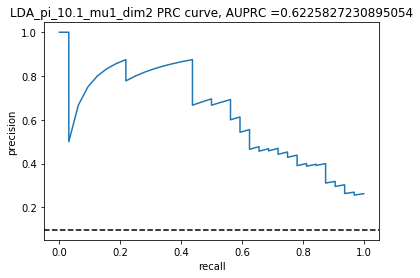

AUPRC =  0.6225827230895054
LDA  for train_test split: AUROC =  0.9328859060402684 , AUPRC =  0.6225827230895054 , average precision = , 0.3818181818181818 . 
Best threshold for ROC =  0.103034651655258 , accuracy for the best ROC threshold is then  0.8606060606060606 , accuracy =  0.9272727272727272 . 
F1 score =  0.5714285714285715 , log loss =  2.5119303947190854 , recall = 0.5 .
------------------------------------------------------------


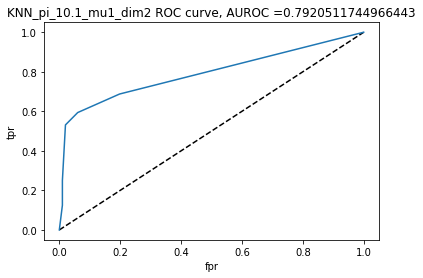

AUROC =  0.7920511744966443


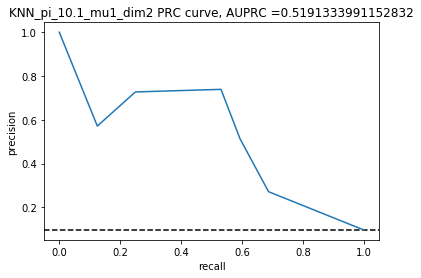

AUPRC =  0.5191333991152832
KNN  for train_test split: AUROC =  0.7920511744966443 , AUPRC =  0.5191333991152832 , average precision = , 0.43811758893280633 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.906060606060606 , accuracy =  0.9363636363636364 . 
F1 score =  0.6181818181818182 , log loss =  2.1979366723566836 , recall = 0.53125 .
------------------------------------------------------------


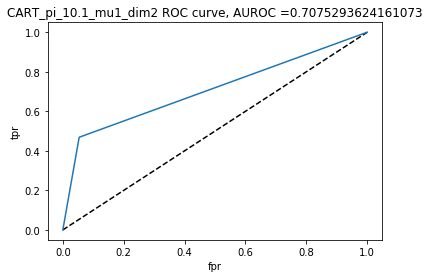

AUROC =  0.7075293624161073


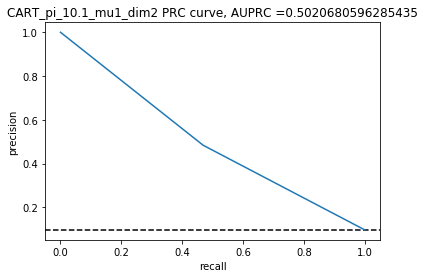

AUPRC =  0.5020680596285435
CART  for train_test split: AUROC =  0.7075293624161073 , AUPRC =  0.5020680596285435 , average precision = , 0.27832966764418376 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9030303030303031 , accuracy =  0.9 . 
F1 score =  0.47619047619047616 , log loss =  3.453916407851321 , recall = 0.46875 .
------------------------------------------------------------


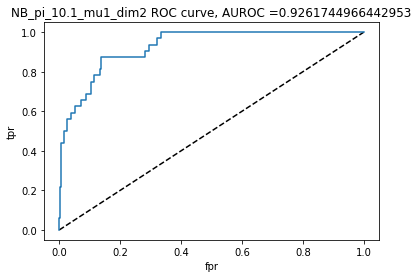

AUROC =  0.9261744966442953


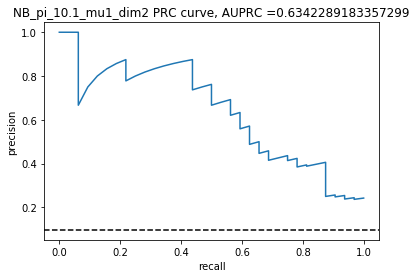

AUPRC =  0.6342289183357299
NB  for train_test split: AUROC =  0.9261744966442953 , AUPRC =  0.6342289183357299 , average precision = , 0.4121212121212121 . 
Best threshold for ROC =  0.0941671082018755 , accuracy for the best ROC threshold is then  0.8606060606060606 , accuracy =  0.9333333333333333 . 
F1 score =  0.5925925925925926 , log loss =  2.302599631129141 , recall = 0.5 .
------------------------------------------------------------


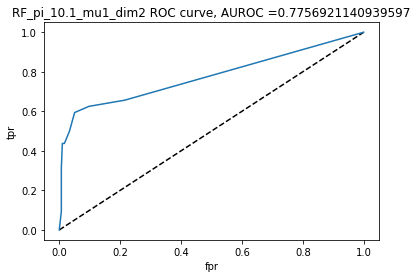

AUROC =  0.7756921140939597


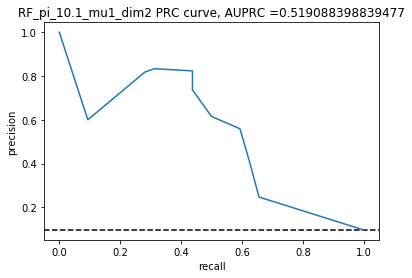

AUPRC =  0.519088398839477
RF  for train_test split: AUROC =  0.7756921140939597 , AUPRC =  0.519088398839477 , average precision = , 0.4148395721925134 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.8757575757575757 , accuracy =  0.9363636363636364 . 
F1 score =  0.5714285714285714 , log loss =  2.197929403289137 , recall = 0.4375 .
------------------------------------------------------------


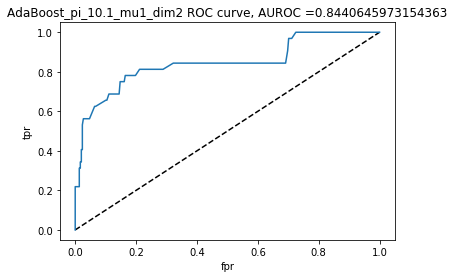

AUROC =  0.8440645973154363


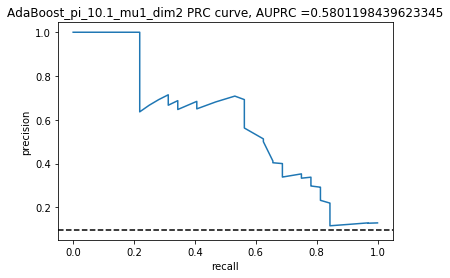

AUPRC =  0.5801198439623345
AdaBoost  for train_test split: AUROC =  0.8440645973154363 , AUPRC =  0.5801198439623345 , average precision = , 0.43184731934731935 . 
Best threshold for ROC =  0.48077468032285653 , accuracy for the best ROC threshold is then  0.803030303030303 , accuracy =  0.9333333333333333 . 
F1 score =  0.6206896551724138 , log loss =  2.302604477174172 , recall = 0.5625 .
------------------------------------------------------------
The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  KNN
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  AdaBoost
The best model measured by  log_loss_score is  RF
The best model measured by  recall is  AdaBoost
Positive ratio for pi_1 = 0.1 , mu = 1 , dim = 4  is 0.087 .


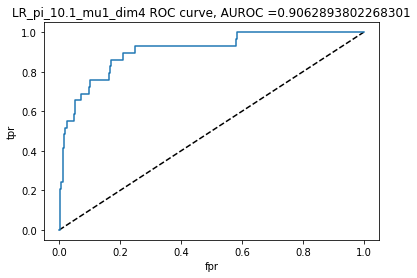

AUROC =  0.9062893802268301


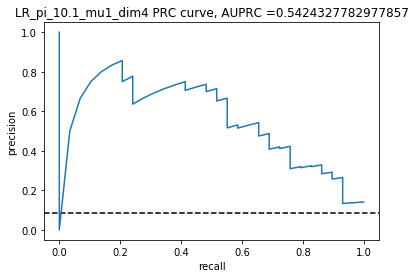

AUPRC =  0.5424327782977857
LR  for train_test split: AUROC =  0.9062893802268301 , AUPRC =  0.5424327782977857 , average precision = , 0.3833855799373041 . 
Best threshold for ROC =  0.07607896196743627 , accuracy for the best ROC threshold is then  0.8333333333333334 , accuracy =  0.9363636363636364 . 
F1 score =  0.5714285714285714 , log loss =  2.1979366723566836 , recall = 0.4827586206896552 .
------------------------------------------------------------


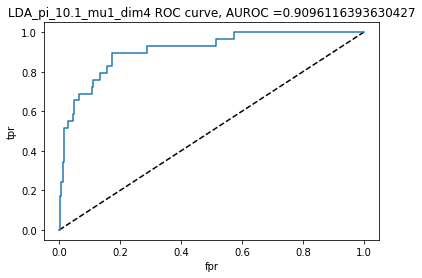

AUROC =  0.9096116393630427


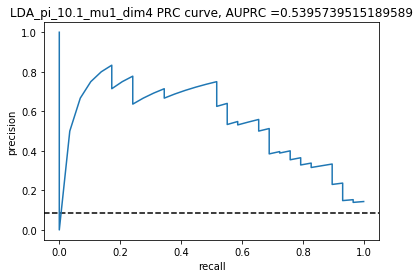

AUPRC =  0.5395739515189589
LDA  for train_test split: AUROC =  0.9096116393630427 , AUPRC =  0.5395739515189589 , average precision = , 0.3722396377568791 . 
Best threshold for ROC =  0.0615276551052207 , accuracy for the best ROC threshold is then  0.8303030303030303 , accuracy =  0.9363636363636364 . 
F1 score =  0.5531914893617021 , log loss =  2.197934249334168 , recall = 0.4482758620689655 .
------------------------------------------------------------


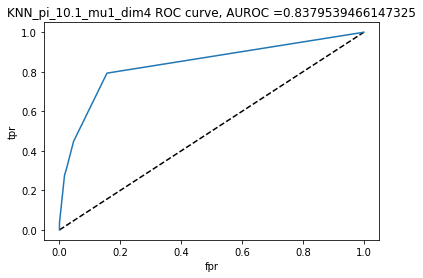

AUROC =  0.8379539466147325


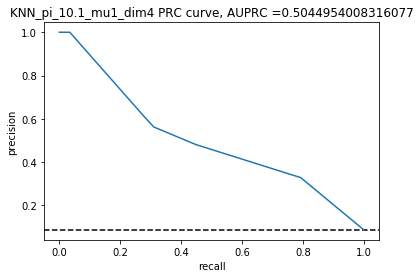

AUPRC =  0.5044954008316077
KNN  for train_test split: AUROC =  0.8379539466147325 , AUPRC =  0.5044954008316077 , average precision = , 0.235175026123302 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.9090909090909091 , accuracy =  0.9181818181818182 . 
F1 score =  0.4 , log loss =  2.8259168480139394 , recall = 0.3103448275862069 .
------------------------------------------------------------


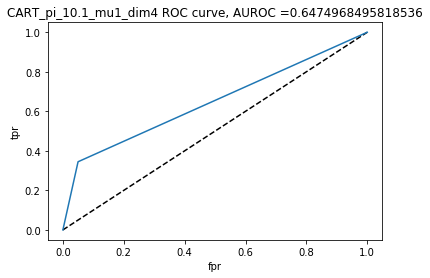

AUROC =  0.6474968495818536


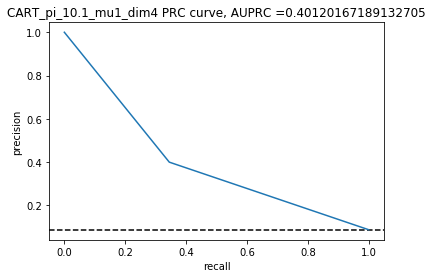

AUPRC =  0.40120167189132705
CART  for train_test split: AUROC =  0.6474968495818536 , AUPRC =  0.40120167189132705 , average precision = , 0.19550679205851623 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9121212121212121 , accuracy =  0.896969696969697 . 
F1 score =  0.3703703703703704 , log loss =  3.558576943601262 , recall = 0.3448275862068966 .
------------------------------------------------------------


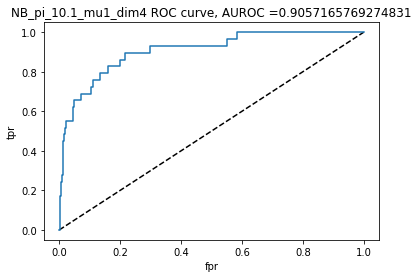

AUROC =  0.9057165769274831


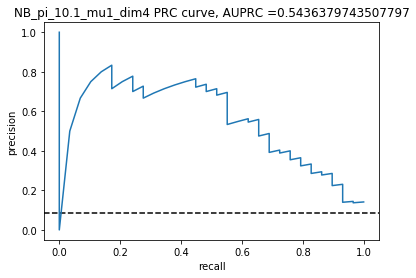

AUPRC =  0.5436379743507797
NB  for train_test split: AUROC =  0.9057165769274831 , AUPRC =  0.5436379743507797 , average precision = , 0.3833855799373041 . 
Best threshold for ROC =  0.061130886192499935 , accuracy for the best ROC threshold is then  0.8363636363636363 , accuracy =  0.9363636363636364 . 
F1 score =  0.5714285714285714 , log loss =  2.1979366723566836 , recall = 0.4827586206896552 .
------------------------------------------------------------


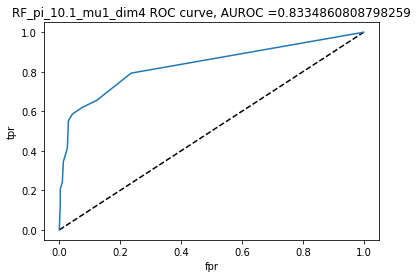

AUROC =  0.8334860808798259


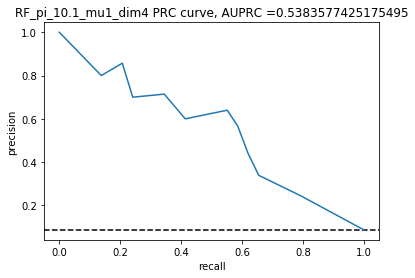

AUPRC =  0.5383577425175495
RF  for train_test split: AUROC =  0.8334860808798259 , AUPRC =  0.5383577425175495 , average precision = , 0.299791013584117 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.8575757575757575 , accuracy =  0.9242424242424242 . 
F1 score =  0.4897959183673469 , log loss =  2.6165933534915418 , recall = 0.41379310344827586 .
------------------------------------------------------------


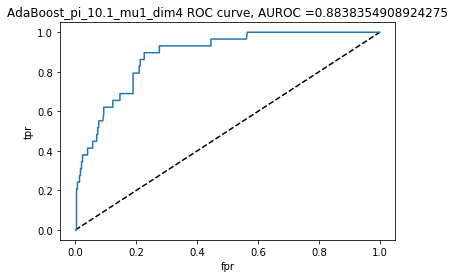

AUROC =  0.8838354908924275


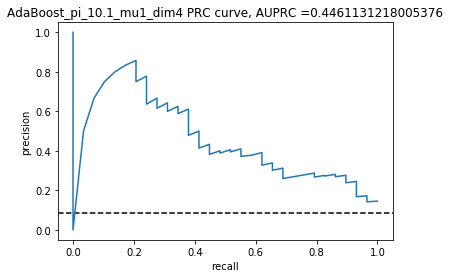

AUPRC =  0.4461131218005376
AdaBoost  for train_test split: AUROC =  0.8838354908924275 , AUPRC =  0.4461131218005376 , average precision = , 0.2863462208289795 . 
Best threshold for ROC =  0.4775811359434637 , accuracy for the best ROC threshold is then  0.793939393939394 , accuracy =  0.9242424242424242 . 
F1 score =  0.46808510638297873 , log loss =  2.6165909304690262 , recall = 0.3793103448275862 .
------------------------------------------------------------
The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  NB
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.1 , mu = 1 , dim = 6  is 0.101 .


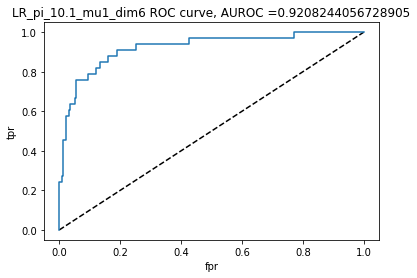

AUROC =  0.9208244056728905


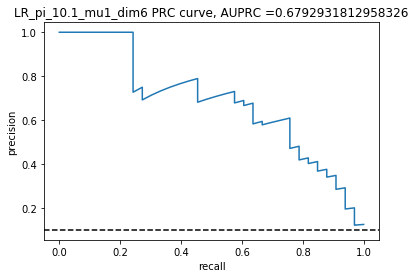

AUPRC =  0.6792931812958326
LR  for train_test split: AUROC =  0.9208244056728905 , AUPRC =  0.6792931812958326 , average precision = , 0.3875420875420875 . 
Best threshold for ROC =  0.0933361288611153 , accuracy for the best ROC threshold is then  0.8424242424242424 , accuracy =  0.9303030303030303 . 
F1 score =  0.5490196078431373 , log loss =  2.4072577438565657 , recall = 0.42424242424242425 .
------------------------------------------------------------


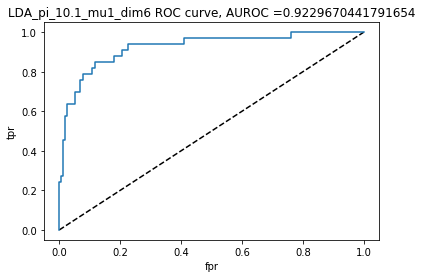

AUROC =  0.9229670441791654


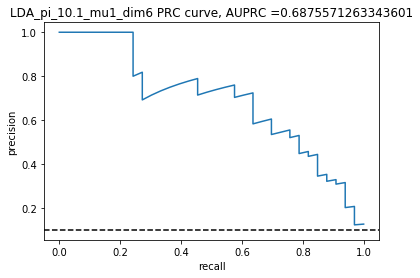

AUPRC =  0.6875571263343601
LDA  for train_test split: AUROC =  0.9229670441791654 , AUPRC =  0.6875571263343601 , average precision = , 0.39545454545454545 . 
Best threshold for ROC =  0.08144751991352728 , accuracy for the best ROC threshold is then  0.8272727272727273 , accuracy =  0.9303030303030303 . 
F1 score =  0.5660377358490566 , log loss =  2.4072601668790816 , recall = 0.45454545454545453 .
------------------------------------------------------------


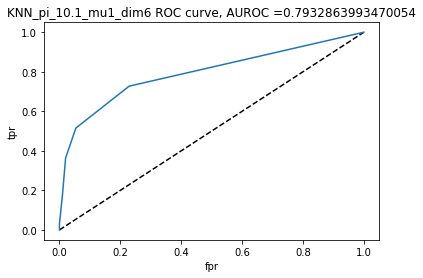

AUROC =  0.7932863993470054


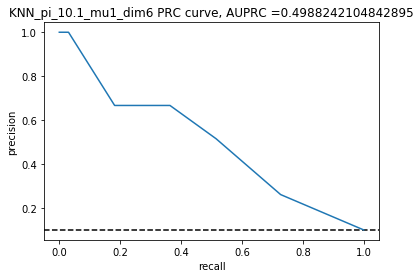

AUPRC =  0.4988242104842895
KNN  for train_test split: AUROC =  0.7932863993470054 , AUPRC =  0.4988242104842895 , average precision = , 0.3060606060606061 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.9030303030303031 , accuracy =  0.9181818181818182 . 
F1 score =  0.4705882352941177 , log loss =  2.8259144249914234 , recall = 0.36363636363636365 .
------------------------------------------------------------


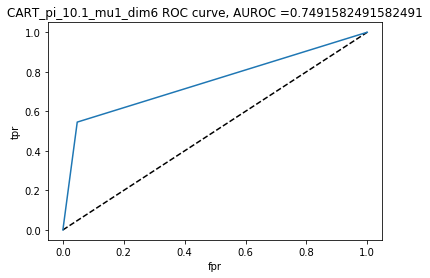

AUROC =  0.7491582491582491


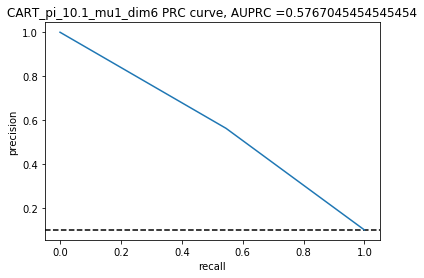

AUPRC =  0.5767045454545454
CART  for train_test split: AUROC =  0.7491582491582491 , AUPRC =  0.5767045454545454 , average precision = , 0.35227272727272724 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9 , accuracy =  0.9121212121212121 . 
F1 score =  0.5538461538461538 , log loss =  3.035259726716463 , recall = 0.5454545454545454 .
------------------------------------------------------------


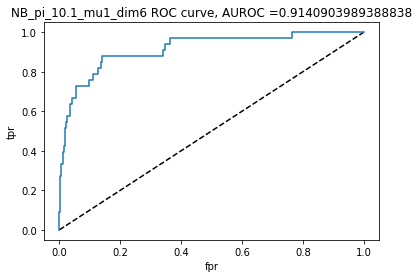

AUROC =  0.9140903989388838


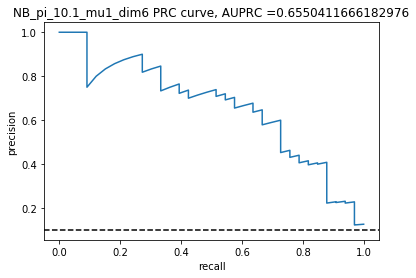

AUPRC =  0.6550411666182976
NB  for train_test split: AUROC =  0.9140903989388838 , AUPRC =  0.6550411666182976 , average precision = , 0.3545454545454545 . 
Best threshold for ROC =  0.10641321698577091 , accuracy for the best ROC threshold is then  0.8606060606060606 , accuracy =  0.9242424242424242 . 
F1 score =  0.5283018867924527 , log loss =  2.6165885074465103 , recall = 0.42424242424242425 .
------------------------------------------------------------


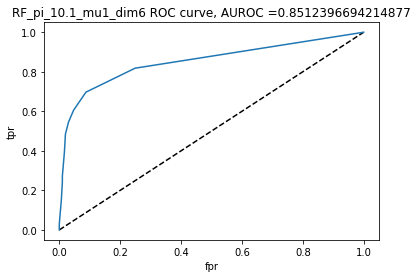

AUROC =  0.8512396694214877


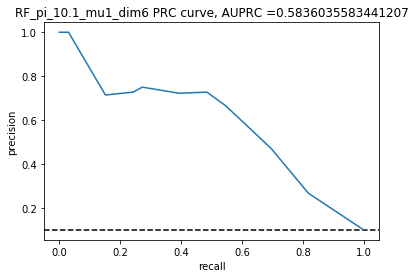

AUPRC =  0.5836035583441207
RF  for train_test split: AUROC =  0.8512396694214877 , AUPRC =  0.5836035583441207 , average precision = , 0.3451178451178451 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.8909090909090909 , accuracy =  0.9242424242424242 . 
F1 score =  0.5098039215686274 , log loss =  2.6165860844239948 , recall = 0.3939393939393939 .
------------------------------------------------------------


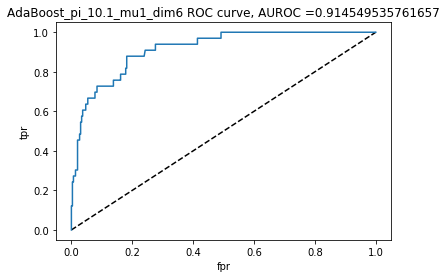

AUROC =  0.914549535761657


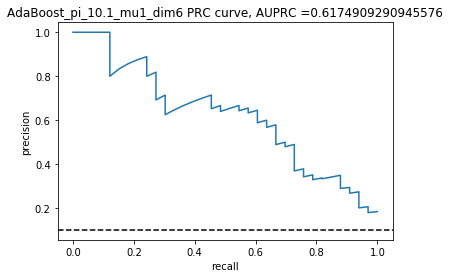

AUPRC =  0.6174909290945576
AdaBoost  for train_test split: AUROC =  0.914549535761657 , AUPRC =  0.6174909290945576 , average precision = , 0.37922077922077924 . 
Best threshold for ROC =  0.4819930205436576 , accuracy for the best ROC threshold is then  0.8212121212121212 , accuracy =  0.9272727272727272 . 
F1 score =  0.5555555555555556 , log loss =  2.511925548674054 , recall = 0.45454545454545453 .
------------------------------------------------------------
The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  KNN
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  LDA
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.1 , mu = 1 , dim = 8  is 0.089 .


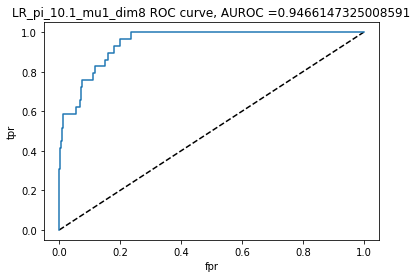

AUROC =  0.9466147325008591


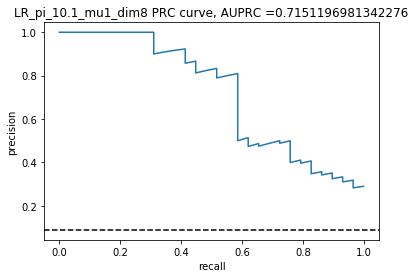

AUPRC =  0.7151196981342276
LR  for train_test split: AUROC =  0.9466147325008591 , AUPRC =  0.7151196981342276 , average precision = , 0.48077324973876695 . 
Best threshold for ROC =  0.08747709718726061 , accuracy for the best ROC threshold is then  0.8484848484848485 , accuracy =  0.9484848484848485 . 
F1 score =  0.6530612244897959 , log loss =  1.7792799912218265 , recall = 0.5517241379310345 .
------------------------------------------------------------


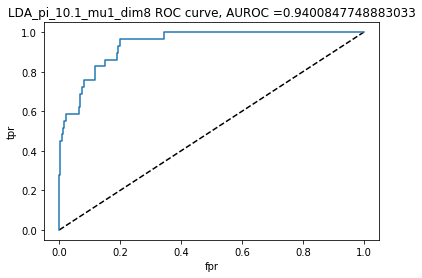

AUROC =  0.9400847748883033


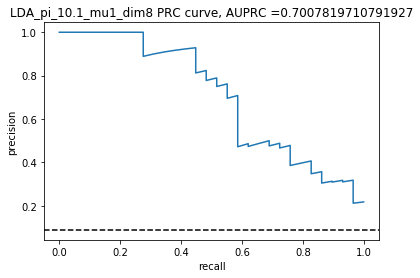

AUPRC =  0.7007819710791927
LDA  for train_test split: AUROC =  0.9400847748883033 , AUPRC =  0.7007819710791927 , average precision = , 0.41270898641588294 . 
Best threshold for ROC =  0.08199219942702307 , accuracy for the best ROC threshold is then  0.8484848484848485 , accuracy =  0.9424242424242424 . 
F1 score =  0.5777777777777777 , log loss =  1.9886034857442239 , recall = 0.4482758620689655 .
------------------------------------------------------------


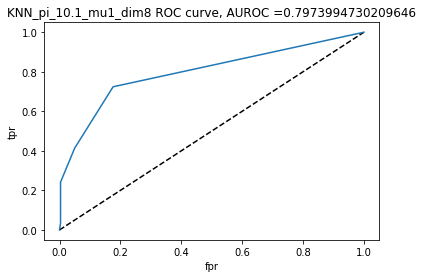

AUROC =  0.7973994730209646


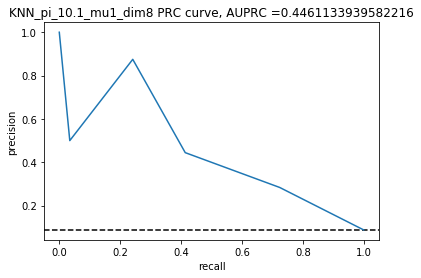

AUPRC =  0.4461133939582216
KNN  for train_test split: AUROC =  0.7973994730209646 , AUPRC =  0.4461133939582216 , average precision = , 0.2778735632183908 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.9030303030303031 , accuracy =  0.9303030303030303 . 
F1 score =  0.3783783783783784 , log loss =  2.4072504747890187 , recall = 0.2413793103448276 .
------------------------------------------------------------


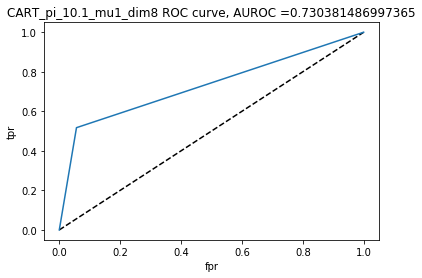

AUROC =  0.730381486997365


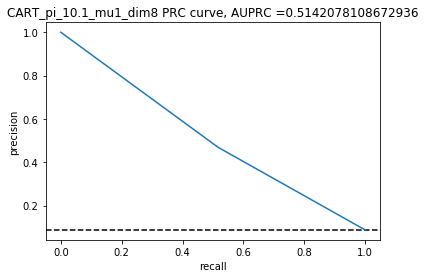

AUPRC =  0.5142078108672936
CART  for train_test split: AUROC =  0.730381486997365 , AUPRC =  0.5142078108672936 , average precision = , 0.28488113897596656 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9121212121212121 , accuracy =  0.906060606060606 . 
F1 score =  0.4918032786885246 , log loss =  3.244592913328923 , recall = 0.5172413793103449 .
------------------------------------------------------------


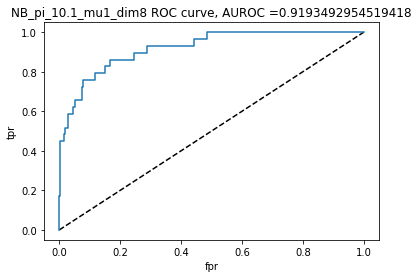

AUROC =  0.9193492954519418


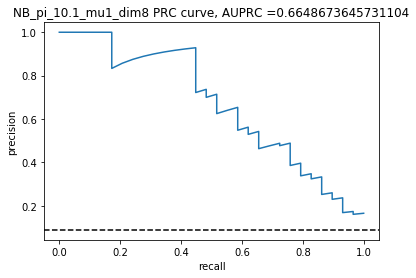

AUPRC =  0.6648673645731104
NB  for train_test split: AUROC =  0.9193492954519418 , AUPRC =  0.6648673645731104 , average precision = , 0.4369905956112853 . 
Best threshold for ROC =  0.08013584082096208 , accuracy for the best ROC threshold is then  0.8363636363636363 , accuracy =  0.9454545454545454 . 
F1 score =  0.5909090909090909 , log loss =  1.8839381039492515 , recall = 0.4482758620689655 .
------------------------------------------------------------


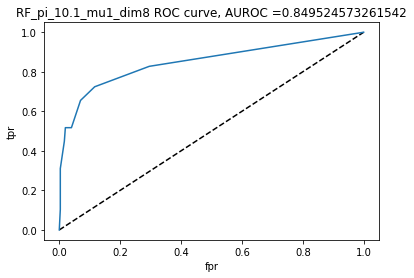

AUROC =  0.849524573261542


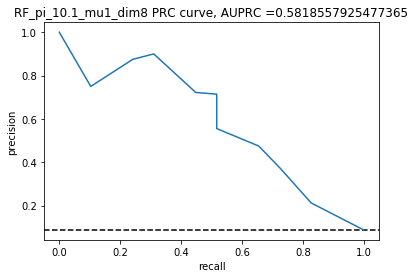

AUPRC =  0.5818557925477365
RF  for train_test split: AUROC =  0.849524573261542 , AUPRC =  0.5818557925477365 , average precision = , 0.4118823705030602 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.8696969696969697 , accuracy =  0.9393939393939394 . 
F1 score =  0.6000000000000001 , log loss =  2.0932737135842276 , recall = 0.5172413793103449 .
------------------------------------------------------------


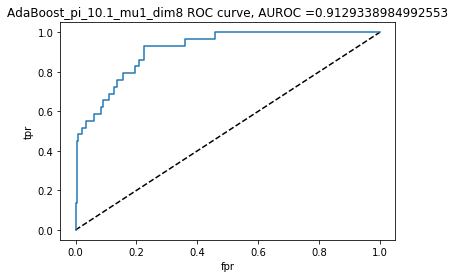

AUROC =  0.9129338984992553


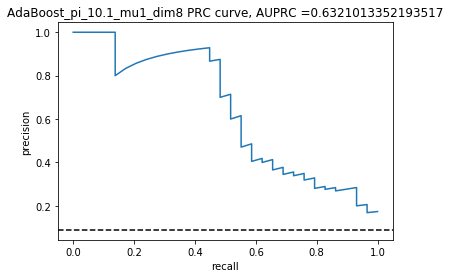

AUPRC =  0.6321013352193517
AdaBoost  for train_test split: AUROC =  0.9129338984992553 , AUPRC =  0.6321013352193517 , average precision = , 0.37975557675707605 . 
Best threshold for ROC =  0.47719538682791096 , accuracy for the best ROC threshold is then  0.806060606060606 , accuracy =  0.9333333333333333 . 
F1 score =  0.576923076923077 , log loss =  2.3026044771741723 , recall = 0.5172413793103449 .
------------------------------------------------------------
The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  LR
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  LR
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  LR
Positive ratio for pi_1 = 0.1 , mu = 1 , dim = 10  is 0.101 .


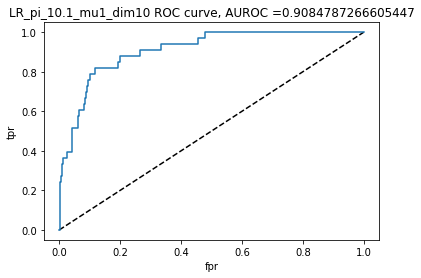

AUROC =  0.9084787266605447


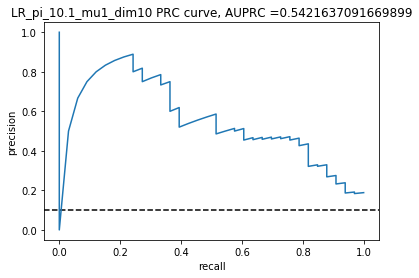

AUPRC =  0.5421637091669899
LR  for train_test split: AUROC =  0.9084787266605447 , AUPRC =  0.5421637091669899 , average precision = , 0.2818181818181818 . 
Best threshold for ROC =  0.08106767539274787 , accuracy for the best ROC threshold is then  0.8121212121212121 , accuracy =  0.9121212121212121 . 
F1 score =  0.4528301886792453 , log loss =  3.0352451885813685 , recall = 0.36363636363636365 .
------------------------------------------------------------


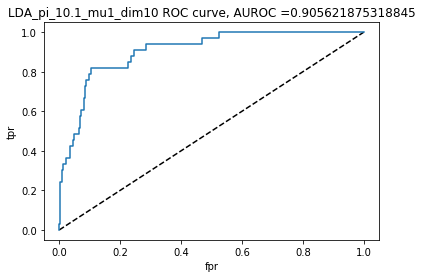

AUROC =  0.905621875318845


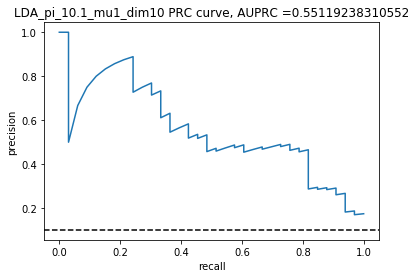

AUPRC =  0.55119238310552
LDA  for train_test split: AUROC =  0.905621875318845 , AUPRC =  0.55119238310552 , average precision = , 0.26198347107438014 . 
Best threshold for ROC =  0.05802419018514698 , accuracy for the best ROC threshold is then  0.7818181818181819 , accuracy =  0.906060606060606 . 
F1 score =  0.43636363636363634 , log loss =  3.244575952171313 , recall = 0.36363636363636365 .
------------------------------------------------------------


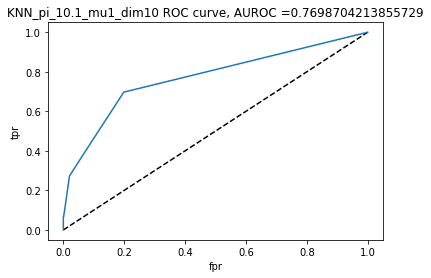

AUROC =  0.7698704213855729


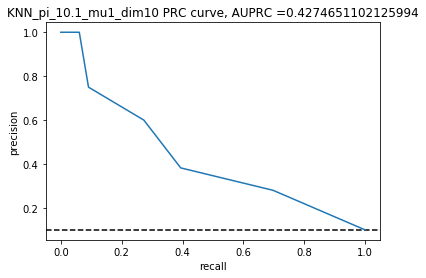

AUPRC =  0.4274651102125994
KNN  for train_test split: AUROC =  0.7698704213855729 , AUPRC =  0.4274651102125994 , average precision = , 0.23636363636363633 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.8757575757575757 , accuracy =  0.9090909090909091 . 
F1 score =  0.37499999999999994 , log loss =  3.139903301308794 , recall = 0.2727272727272727 .
------------------------------------------------------------


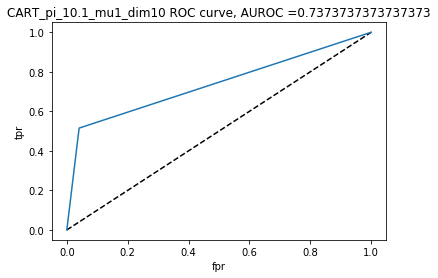

AUROC =  0.7373737373737373


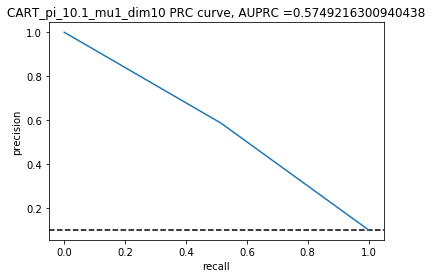

AUPRC =  0.5749216300940438
CART  for train_test split: AUROC =  0.7373737373737373 , AUPRC =  0.5749216300940438 , average precision = , 0.35047021943573664 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.9 , accuracy =  0.9151515151515152 . 
F1 score =  0.5483870967741935 , log loss =  2.9305919218989747 , recall = 0.5151515151515151 .
------------------------------------------------------------


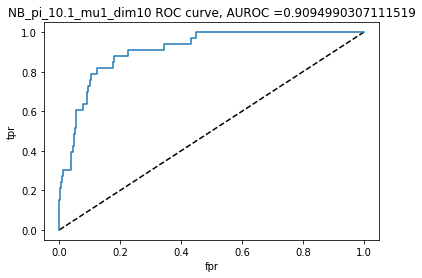

AUROC =  0.9094990307111519


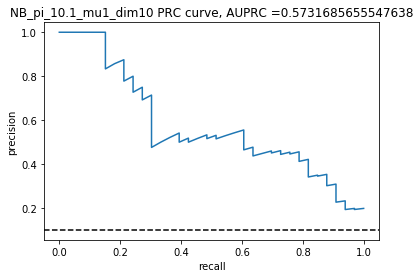

AUPRC =  0.5731685655547638
NB  for train_test split: AUROC =  0.9094990307111519 , AUPRC =  0.5731685655547638 , average precision = , 0.213997113997114 . 
Best threshold for ROC =  0.07436546985181812 , accuracy for the best ROC threshold is then  0.8272727272727273 , accuracy =  0.896969696969697 . 
F1 score =  0.37037037037037035 , log loss =  3.558567251511198 , recall = 0.30303030303030304 .
------------------------------------------------------------


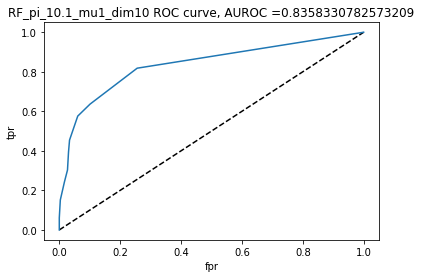

AUROC =  0.8358330782573209


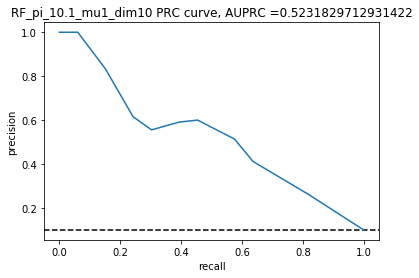

AUPRC =  0.5231829712931422
RF  for train_test split: AUROC =  0.8358330782573209 , AUPRC =  0.5231829712931422 , average precision = , 0.23804713804713806 . 
Best threshold for ROC =  0.1 , accuracy for the best ROC threshold is then  0.8727272727272727 , accuracy =  0.906060606060606 . 
F1 score =  0.3921568627450981 , log loss =  3.2445711061262816 , recall = 0.30303030303030304 .
------------------------------------------------------------


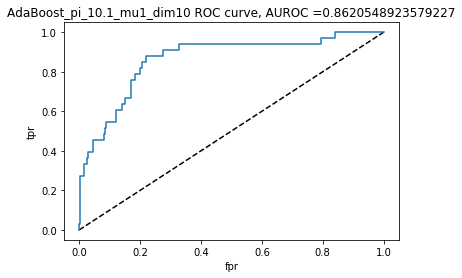

AUROC =  0.8620548923579227


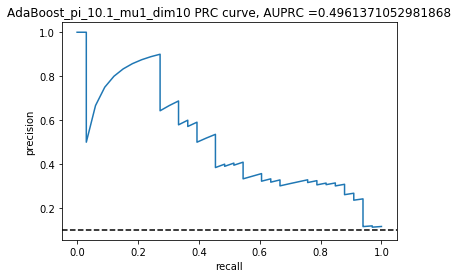

AUPRC =  0.4961371052981868
AdaBoost  for train_test split: AUROC =  0.8620548923579227 , AUPRC =  0.4961371052981868 , average precision = , 0.2818181818181818 . 
Best threshold for ROC =  0.468631298552848 , accuracy for the best ROC threshold is then  0.803030303030303 , accuracy =  0.9121212121212121 . 
F1 score =  0.4528301886792453 , log loss =  3.0352451885813685 , recall = 0.36363636363636365 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  CART
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  CART
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.2 , dim = 2  is 0.188 .


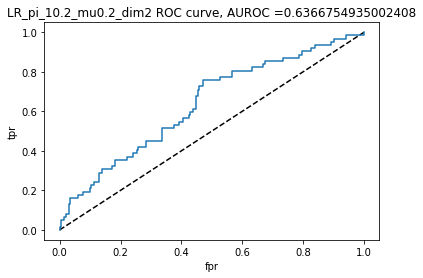

AUROC =  0.6366754935002408


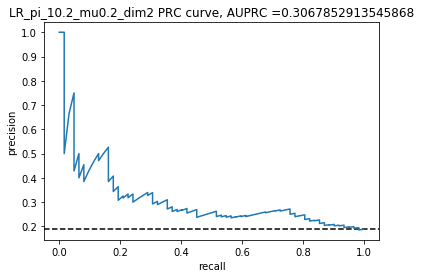

AUPRC =  0.3067852913545868
LR  for train_test split: AUROC =  0.6366754935002408 , AUPRC =  0.3067852913545868 , average precision = , 0.18787878787878787 . 
Best threshold for ROC =  0.187665608525711 , accuracy for the best ROC threshold is then  0.5727272727272728 , accuracy =  0.8121212121212121 . 
F1 score =  0.0 , log loss =  6.4891034438923105 , recall = 0.0 .
------------------------------------------------------------


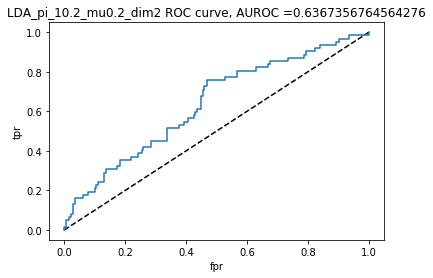

AUROC =  0.6367356764564276


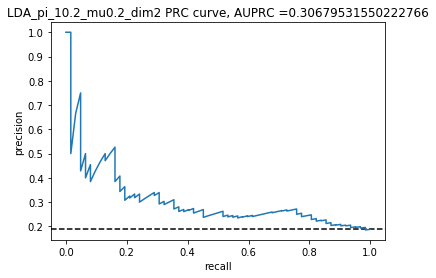

AUPRC =  0.30679531550222766
LDA  for train_test split: AUROC =  0.6367356764564276 , AUPRC =  0.30679531550222766 , average precision = , 0.18787878787878787 . 
Best threshold for ROC =  0.18530678465710795 , accuracy for the best ROC threshold is then  0.5727272727272728 , accuracy =  0.8121212121212121 . 
F1 score =  0.0 , log loss =  6.4891034438923105 , recall = 0.0 .
------------------------------------------------------------


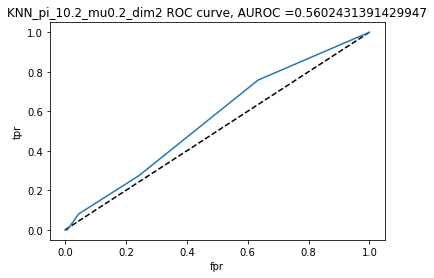

AUROC =  0.5602431391429947


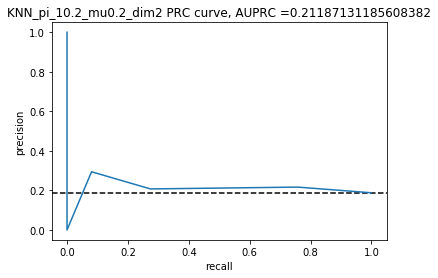

AUPRC =  0.21187131185608382
KNN  for train_test split: AUROC =  0.5602431391429947 , AUPRC =  0.21187131185608382 , average precision = , 0.1964464378126617 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6666666666666666 , accuracy =  0.7909090909090909 . 
F1 score =  0.12658227848101267 , log loss =  7.221773231569696 , recall = 0.08064516129032258 .
------------------------------------------------------------


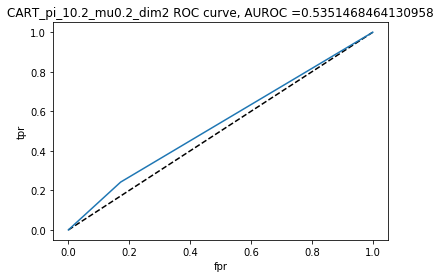

AUROC =  0.5351468464130958


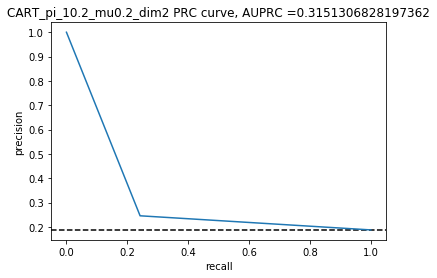

AUPRC =  0.3151306828197362
CART  for train_test split: AUROC =  0.5351468464130958 , AUPRC =  0.3151306828197362 , average precision = , 0.2019165745236607 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8121212121212121 , accuracy =  0.7181818181818181 . 
F1 score =  0.24390243902439024 , log loss =  9.733766624874189 , recall = 0.24193548387096775 .
------------------------------------------------------------


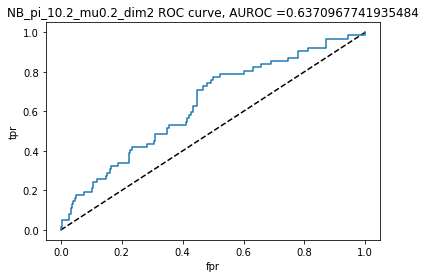

AUROC =  0.6370967741935484


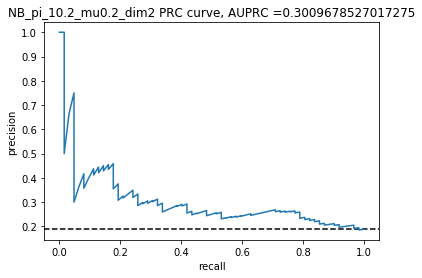

AUPRC =  0.3009678527017275
NB  for train_test split: AUROC =  0.6370967741935484 , AUPRC =  0.3009678527017275 , average precision = , 0.18787878787878787 . 
Best threshold for ROC =  0.1912117296231136 , accuracy for the best ROC threshold is then  0.5757575757575758 , accuracy =  0.8121212121212121 . 
F1 score =  0.0 , log loss =  6.4891034438923105 , recall = 0.0 .
------------------------------------------------------------


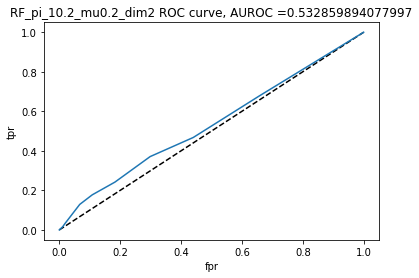

AUROC =  0.532859894077997


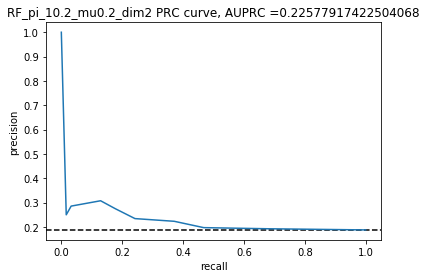

AUPRC =  0.22577917422504068
RF  for train_test split: AUROC =  0.532859894077997 , AUPRC =  0.22577917422504068 , average precision = , 0.20333859688698397 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6393939393939394 , accuracy =  0.7818181818181819 . 
F1 score =  0.18181818181818182 , log loss =  7.53577664602216 , recall = 0.12903225806451613 .
------------------------------------------------------------


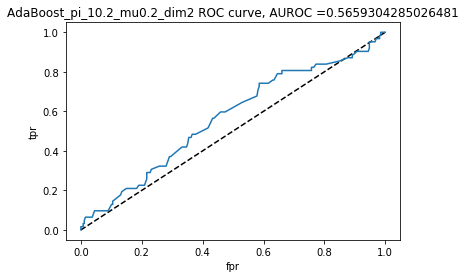

AUROC =  0.5659304285026481


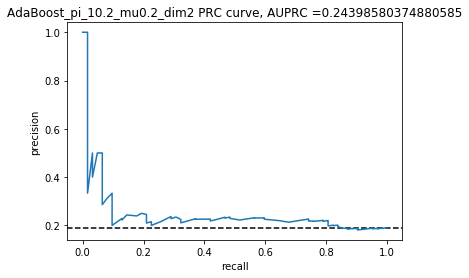

AUPRC =  0.24398580374880585
AdaBoost  for train_test split: AUROC =  0.5659304285026481 , AUPRC =  0.24398580374880585 , average precision = , 0.20298142717497555 . 
Best threshold for ROC =  0.49212832524714867 , accuracy for the best ROC threshold is then  0.5666666666666667 , accuracy =  0.8121212121212121 . 
F1 score =  0.08823529411764706 , log loss =  6.4891107129598575 , recall = 0.04838709677419355 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  RF
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.2 , dim = 4  is 0.194 .


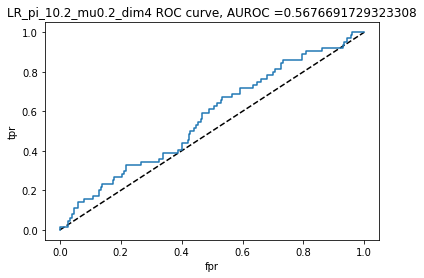

AUROC =  0.5676691729323308


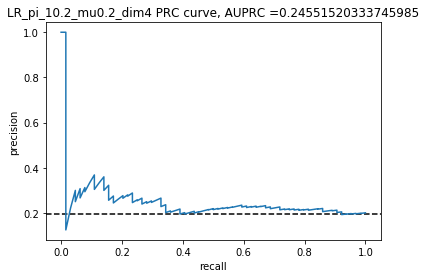

AUPRC =  0.24551520333745985
LR  for train_test split: AUROC =  0.5676691729323308 , AUPRC =  0.24551520333745985 , average precision = , 0.19393939393939394 . 
Best threshold for ROC =  0.20067505917053782 , accuracy for the best ROC threshold is then  0.5424242424242425 , accuracy =  0.806060606060606 . 
F1 score =  0.0 , log loss =  6.698429361437223 , recall = 0.0 .
------------------------------------------------------------


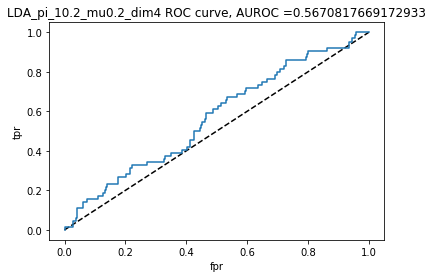

AUROC =  0.5670817669172933


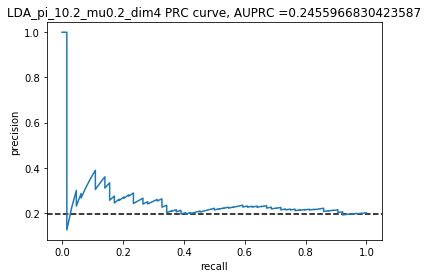

AUPRC =  0.2455966830423587
LDA  for train_test split: AUROC =  0.5670817669172933 , AUPRC =  0.2455966830423587 , average precision = , 0.19393939393939394 . 
Best threshold for ROC =  0.19856749331920617 , accuracy for the best ROC threshold is then  0.5454545454545454 , accuracy =  0.806060606060606 . 
F1 score =  0.0 , log loss =  6.698429361437223 , recall = 0.0 .
------------------------------------------------------------


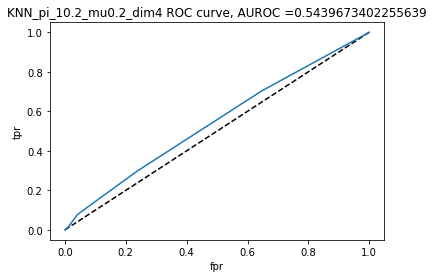

AUROC =  0.5439673402255639


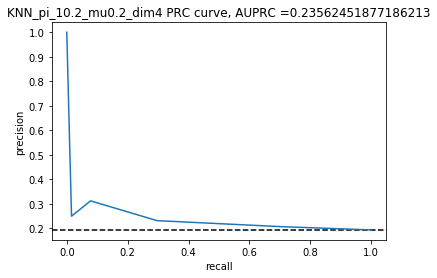

AUPRC =  0.23562451877186213
KNN  for train_test split: AUROC =  0.5439673402255639 , AUPRC =  0.23562451877186213 , average precision = , 0.2032019412878788 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6727272727272727 , accuracy =  0.7878787878787878 . 
F1 score =  0.125 , log loss =  7.326433767319638 , recall = 0.078125 .
------------------------------------------------------------


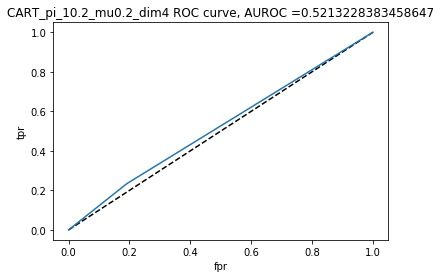

AUROC =  0.5213228383458647


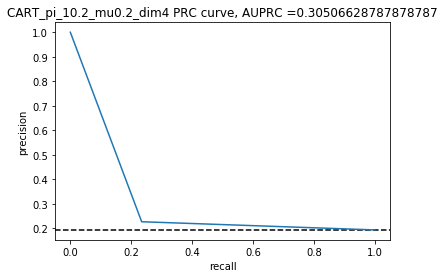

AUPRC =  0.30506628787878787
CART  for train_test split: AUROC =  0.5213228383458647 , AUPRC =  0.30506628787878787 , average precision = , 0.20175189393939397 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.806060606060606 , accuracy =  0.696969696969697 . 
F1 score =  0.23076923076923075 , log loss =  10.466419451393964 , recall = 0.234375 .
------------------------------------------------------------


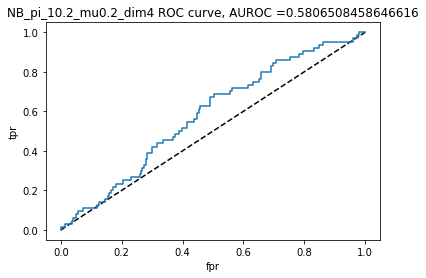

AUROC =  0.5806508458646616


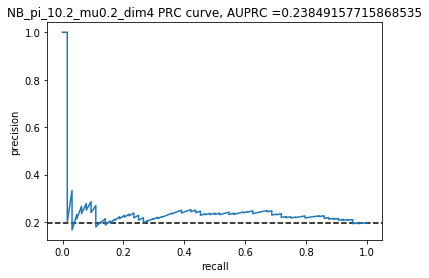

AUPRC =  0.23849157715868535
NB  for train_test split: AUROC =  0.5806508458646616 , AUPRC =  0.23849157715868535 , average precision = , 0.20653409090909092 . 
Best threshold for ROC =  0.19042203471985916 , accuracy for the best ROC threshold is then  0.5606060606060606 , accuracy =  0.8090909090909091 . 
F1 score =  0.03076923076923077 , log loss =  6.593766402664767 , recall = 0.015625 .
------------------------------------------------------------


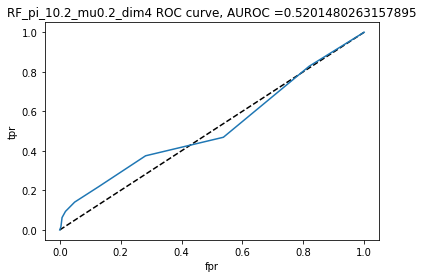

AUROC =  0.5201480263157895


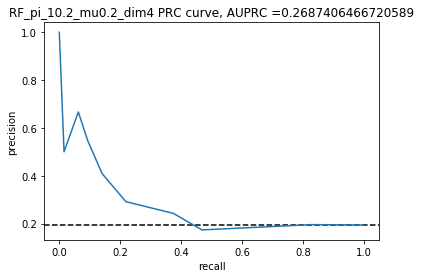

AUPRC =  0.2687406466720589
RF  for train_test split: AUROC =  0.5201480263157895 , AUPRC =  0.2687406466720589 , average precision = , 0.22689393939393937 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6515151515151515 , accuracy =  0.8090909090909091 . 
F1 score =  0.16 , log loss =  6.593778517777345 , recall = 0.09375 .
------------------------------------------------------------


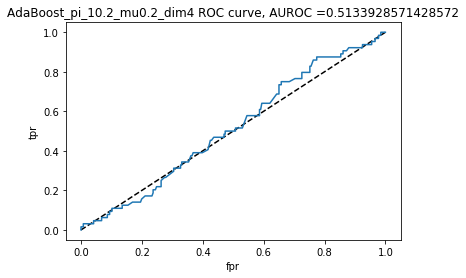

AUROC =  0.5133928571428572


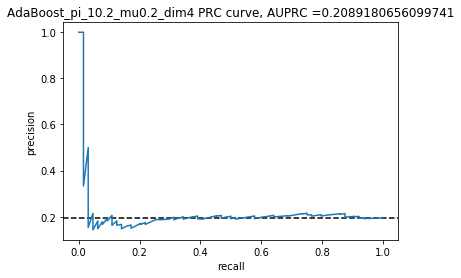

AUPRC =  0.2089180656099741
AdaBoost  for train_test split: AUROC =  0.5133928571428572 , AUPRC =  0.2089180656099741 , average precision = , 0.19569128787878787 . 
Best threshold for ROC =  0.4919215575738561 , accuracy for the best ROC threshold is then  0.5060606060606061 , accuracy =  0.793939393939394 . 
F1 score =  0.05555555555555555 , log loss =  7.1170957346621435 , recall = 0.03125 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  RF
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.2 , dim = 6  is 0.175 .


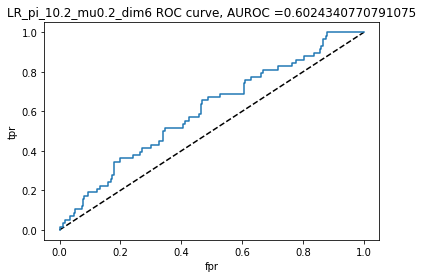

AUROC =  0.6024340770791075


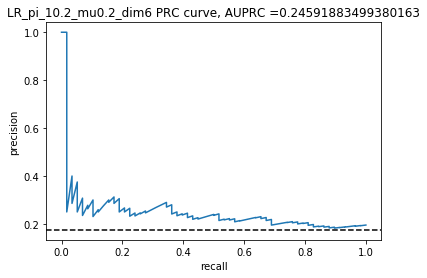

AUPRC =  0.24591883499380163
LR  for train_test split: AUROC =  0.6024340770791075 , AUPRC =  0.24591883499380163 , average precision = , 0.17575757575757575 . 
Best threshold for ROC =  0.1842865327924568 , accuracy for the best ROC threshold is then  0.5696969696969697 , accuracy =  0.8242424242424242 . 
F1 score =  0.0 , log loss =  6.070451608802483 , recall = 0.0 .
------------------------------------------------------------


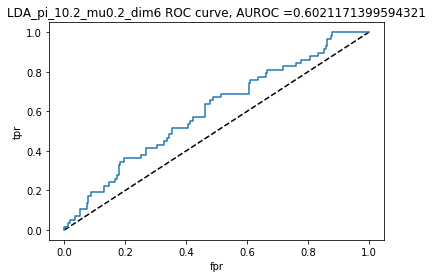

AUROC =  0.6021171399594321


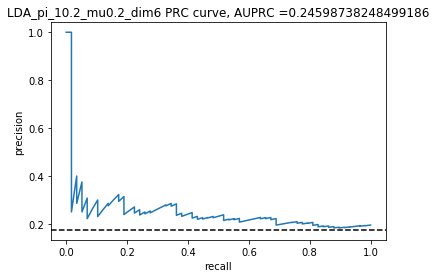

AUPRC =  0.24598738248499186
LDA  for train_test split: AUROC =  0.6021171399594321 , AUPRC =  0.24598738248499186 , average precision = , 0.17575757575757575 . 
Best threshold for ROC =  0.18202219481777754 , accuracy for the best ROC threshold is then  0.5727272727272728 , accuracy =  0.8242424242424242 . 
F1 score =  0.0 , log loss =  6.070451608802483 , recall = 0.0 .
------------------------------------------------------------


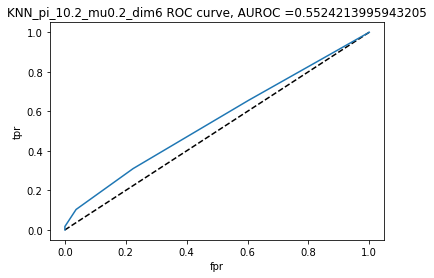

AUROC =  0.5524213995943205


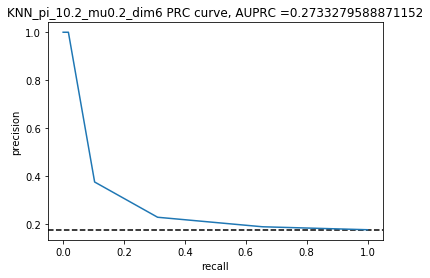

AUPRC =  0.2733279588871152
KNN  for train_test split: AUROC =  0.5524213995943205 , AUPRC =  0.2733279588871152 , average precision = , 0.19636886102403342 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.693939393939394 , accuracy =  0.8121212121212121 . 
F1 score =  0.16216216216216217 , log loss =  6.489127674117467 , recall = 0.10344827586206896 .
------------------------------------------------------------


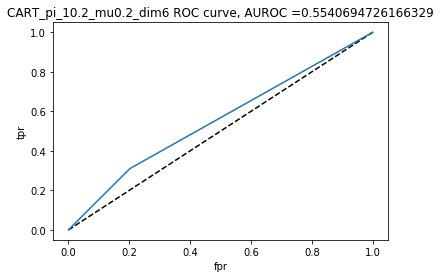

AUROC =  0.5540694726166329


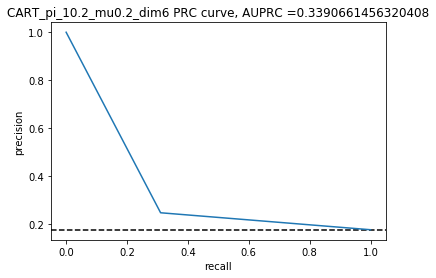

AUPRC =  0.3390661456320408
CART  for train_test split: AUROC =  0.5540694726166329 , AUPRC =  0.3390661456320408 , average precision = , 0.1977355033566654 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8242424242424242 , accuracy =  0.7121212121212122 . 
F1 score =  0.27480916030534347 , log loss =  9.943114349621744 , recall = 0.3103448275862069 .
------------------------------------------------------------


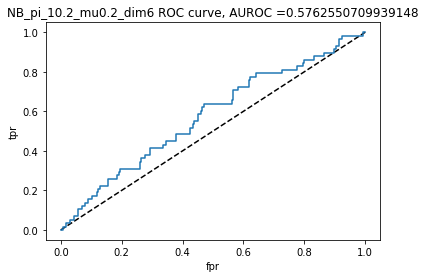

AUROC =  0.5762550709939148


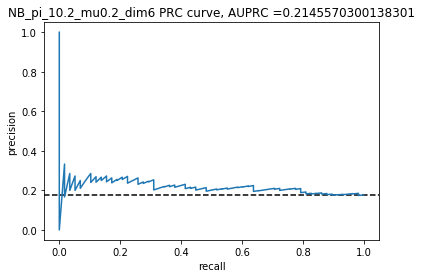

AUPRC =  0.2145570300138301
NB  for train_test split: AUROC =  0.5762550709939148 , AUPRC =  0.2145570300138301 , average precision = , 0.17575757575757575 . 
Best threshold for ROC =  0.1762324147616975 , accuracy for the best ROC threshold is then  0.5515151515151515 , accuracy =  0.8212121212121212 . 
F1 score =  0.0 , log loss =  6.175116990597457 , recall = 0.0 .
------------------------------------------------------------


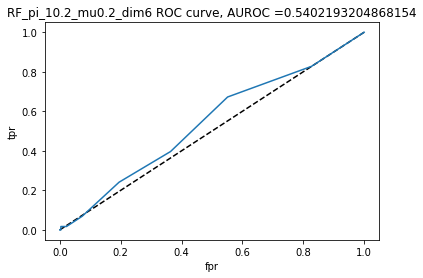

AUROC =  0.5402193204868154


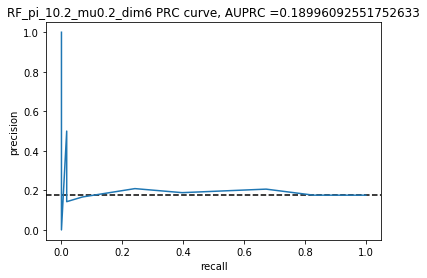

AUPRC =  0.18996092551752633
RF  for train_test split: AUROC =  0.5402193204868154 , AUPRC =  0.18996092551752633 , average precision = , 0.17519032691446482 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.593939393939394 , accuracy =  0.8090909090909091 . 
F1 score =  0.03076923076923077 , log loss =  6.593780940799863 , recall = 0.017241379310344827 .
------------------------------------------------------------


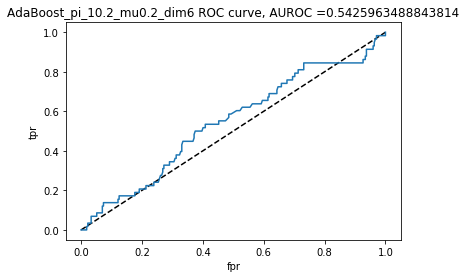

AUROC =  0.5425963488843814


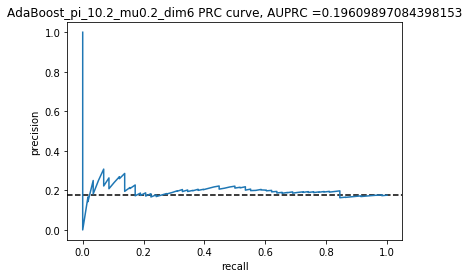

AUPRC =  0.19609897084398153
AdaBoost  for train_test split: AUROC =  0.5425963488843814 , AUPRC =  0.19609897084398153 , average precision = , 0.18087774294670847 . 
Best threshold for ROC =  0.49080718091113357 , accuracy for the best ROC threshold is then  0.5454545454545454 , accuracy =  0.8 . 
F1 score =  0.1081081081081081 , log loss =  6.907784355252324 , recall = 0.06896551724137931 .
------------------------------------------------------------
The best model measured by  AUROC is  LR
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  CART
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.2 , dim = 8  is 0.19 .


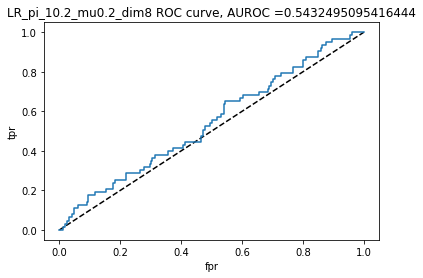

AUROC =  0.5432495095416444


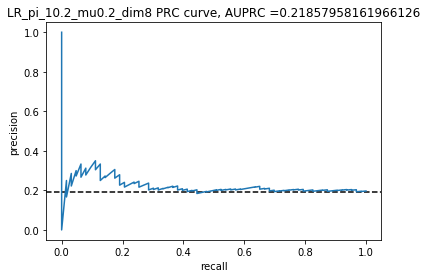

AUPRC =  0.21857958161966126
LR  for train_test split: AUROC =  0.5432495095416444 , AUPRC =  0.21857958161966126 , average precision = , 0.19090909090909092 . 
Best threshold for ROC =  0.18859848494202994 , accuracy for the best ROC threshold is then  0.5181818181818182 , accuracy =  0.806060606060606 . 
F1 score =  0.0 , log loss =  6.698431784459739 , recall = 0.0 .
------------------------------------------------------------


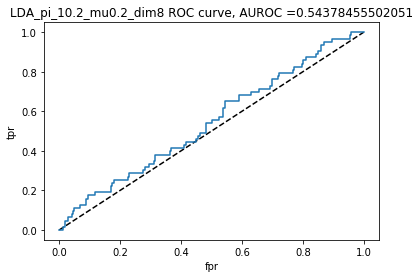

AUROC =  0.54378455502051


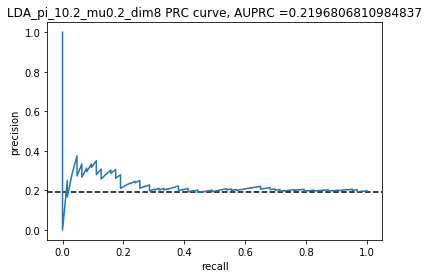

AUPRC =  0.2196806810984837
LDA  for train_test split: AUROC =  0.54378455502051 , AUPRC =  0.2196806810984837 , average precision = , 0.19090909090909092 . 
Best threshold for ROC =  0.1843390571457647 , accuracy for the best ROC threshold is then  0.5181818181818182 , accuracy =  0.803030303030303 . 
F1 score =  0.0 , log loss =  6.8030971662547115 , recall = 0.0 .
------------------------------------------------------------


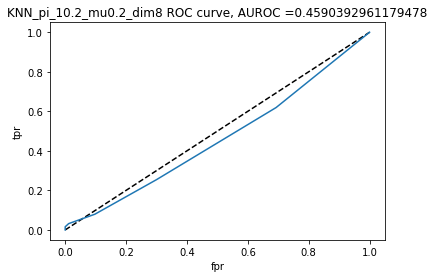

AUROC =  0.4590392961179478


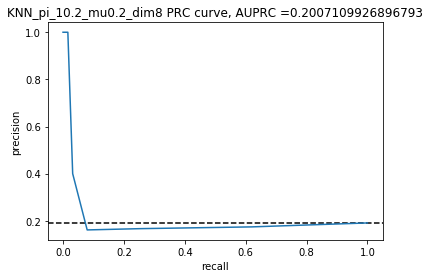

AUPRC =  0.2007109926896793
KNN  for train_test split: AUROC =  0.4590392961179478 , AUPRC =  0.2007109926896793 , average precision = , 0.18855839501000793 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6151515151515151 , accuracy =  0.7454545454545455 . 
F1 score =  0.10638297872340426 , log loss =  8.791751535471764 , recall = 0.07936507936507936 .
------------------------------------------------------------


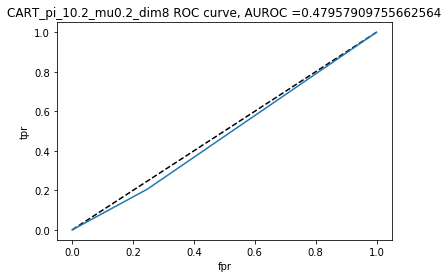

AUROC =  0.47957909755662564


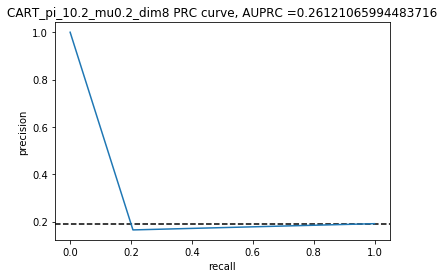

AUPRC =  0.26121065994483716
CART  for train_test split: AUROC =  0.47957909755662564 , AUPRC =  0.26121065994483716 , average precision = , 0.18547135002831208 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8090909090909091 , accuracy =  0.6484848484848484 . 
F1 score =  0.18309859154929575 , log loss =  12.141063137091006 , recall = 0.20634920634920634 .
------------------------------------------------------------


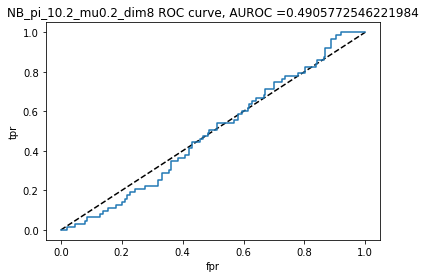

AUROC =  0.4905772546221984


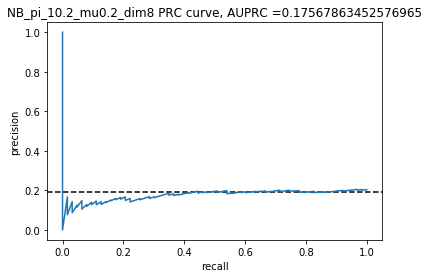

AUPRC =  0.17567863452576965
NB  for train_test split: AUROC =  0.4905772546221984 , AUPRC =  0.17567863452576965 , average precision = , 0.19090909090909092 . 
Best threshold for ROC =  0.19895677605706444 , accuracy for the best ROC threshold is then  0.509090909090909 , accuracy =  0.803030303030303 . 
F1 score =  0.0 , log loss =  6.8030971662547115 , recall = 0.0 .
------------------------------------------------------------


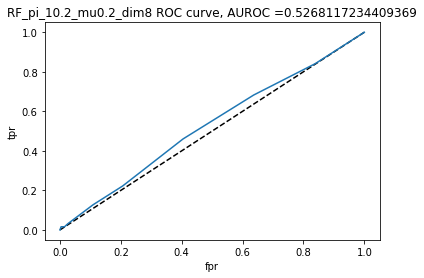

AUROC =  0.5268117234409369


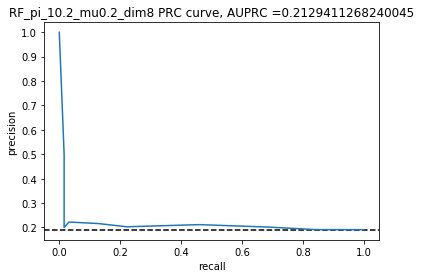

AUPRC =  0.2129411268240045
RF  for train_test split: AUROC =  0.5268117234409369 , AUPRC =  0.2129411268240045 , average precision = , 0.19190315856982523 . 
Best threshold for ROC =  0.3 , accuracy for the best ROC threshold is then  0.6848484848484848 , accuracy =  0.793939393939394 . 
F1 score =  0.05555555555555555 , log loss =  7.11709815768466 , recall = 0.031746031746031744 .
------------------------------------------------------------


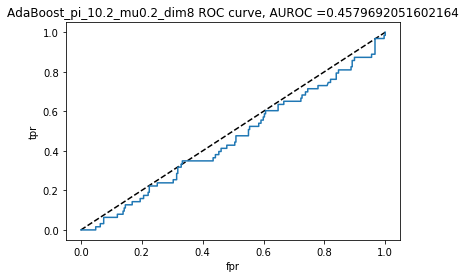

AUROC =  0.4579692051602164


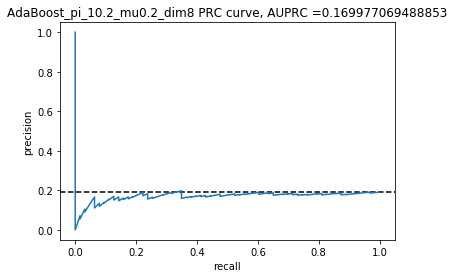

AUPRC =  0.169977069488853
AdaBoost  for train_test split: AUROC =  0.4579692051602164 , AUPRC =  0.169977069488853 , average precision = , 0.18819411041633266 . 
Best threshold for ROC =  0.4903337110976624 , accuracy for the best ROC threshold is then  0.48484848484848486 , accuracy =  0.7515151515151515 . 
F1 score =  0.08888888888888888 , log loss =  8.582418348859303 , recall = 0.06349206349206349 .
------------------------------------------------------------
The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  RF
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.2 , dim = 10  is 0.185 .


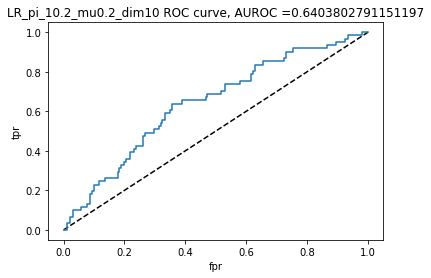

AUROC =  0.6403802791151197


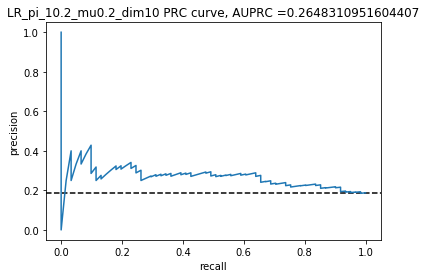

AUPRC =  0.2648310951604407
LR  for train_test split: AUROC =  0.6403802791151197 , AUPRC =  0.2648310951604407 , average precision = , 0.18484848484848485 . 
Best threshold for ROC =  0.1923268649791267 , accuracy for the best ROC threshold is then  0.6393939393939394 , accuracy =  0.8151515151515152 . 
F1 score =  0.0 , log loss =  6.384440485119854 , recall = 0.0 .
------------------------------------------------------------


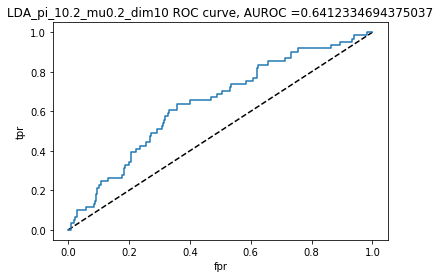

AUROC =  0.6412334694375037


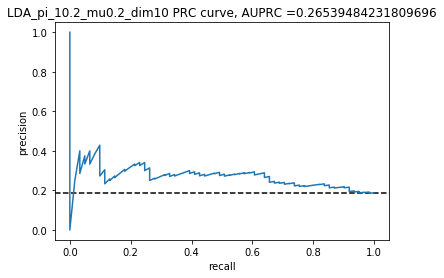

AUPRC =  0.26539484231809696
LDA  for train_test split: AUROC =  0.6412334694375037 , AUPRC =  0.26539484231809696 , average precision = , 0.18484848484848485 . 
Best threshold for ROC =  0.19044082360753017 , accuracy for the best ROC threshold is then  0.6393939393939394 , accuracy =  0.8151515151515152 . 
F1 score =  0.0 , log loss =  6.384440485119854 , recall = 0.0 .
------------------------------------------------------------


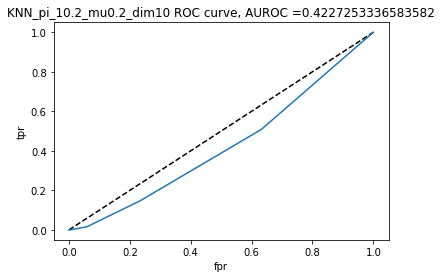

AUROC =  0.4227253336583582


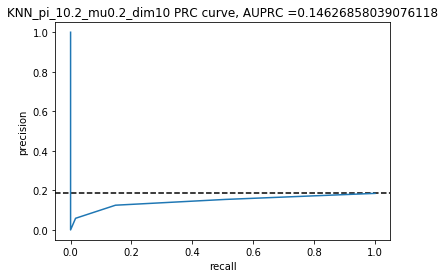

AUPRC =  0.14626858039076118
KNN  for train_test split: AUROC =  0.4227253336583582 , AUPRC =  0.14626858039076118 , average precision = , 0.18278250197247306 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6515151515151515 , accuracy =  0.7696969696969697 . 
F1 score =  0.02564102564102564 , log loss =  7.954423635066955 , recall = 0.01639344262295082 .
------------------------------------------------------------


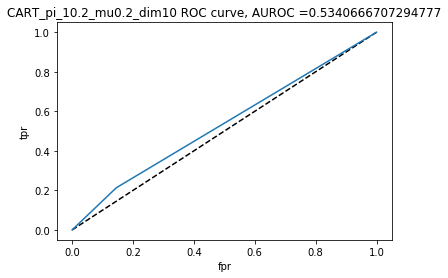

AUROC =  0.5340666707294777


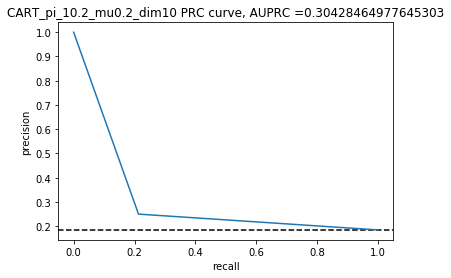

AUPRC =  0.30428464977645303
CART  for train_test split: AUROC =  0.5340666707294777 , AUPRC =  0.30428464977645303 , average precision = , 0.19873323397913562 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8151515151515152 , accuracy =  0.7363636363636363 . 
F1 score =  0.2300884955752212 , log loss =  9.105771911081838 , recall = 0.21311475409836064 .
------------------------------------------------------------


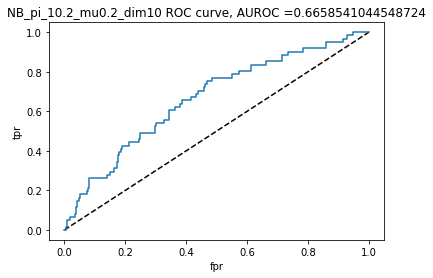

AUROC =  0.6658541044548724


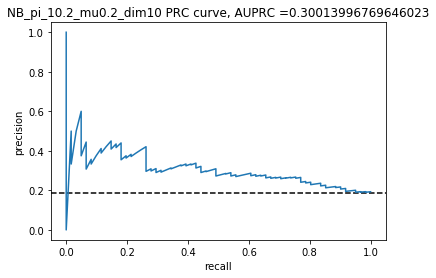

AUPRC =  0.30013996769646023
NB  for train_test split: AUROC =  0.6658541044548724 , AUPRC =  0.30013996769646023 , average precision = , 0.19001490312965724 . 
Best threshold for ROC =  0.17009479273773678 , accuracy for the best ROC threshold is then  0.6242424242424243 , accuracy =  0.8151515151515152 . 
F1 score =  0.031746031746031744 , log loss =  6.384442908142369 , recall = 0.01639344262295082 .
------------------------------------------------------------


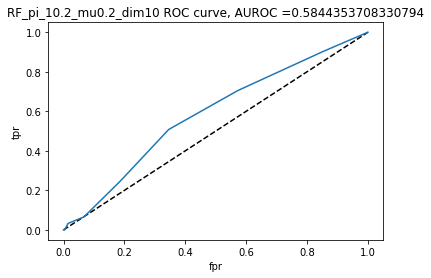

AUROC =  0.5844353708330794


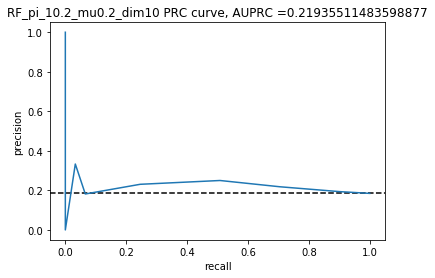

AUPRC =  0.21935511483598877
RF  for train_test split: AUROC =  0.5844353708330794 , AUPRC =  0.21935511483598877 , average precision = , 0.18971684053651267 . 
Best threshold for ROC =  0.3 , accuracy for the best ROC threshold is then  0.7090909090909091 , accuracy =  0.8090909090909091 . 
F1 score =  0.05970149253731344 , log loss =  6.59377609475483 , recall = 0.03278688524590164 .
------------------------------------------------------------


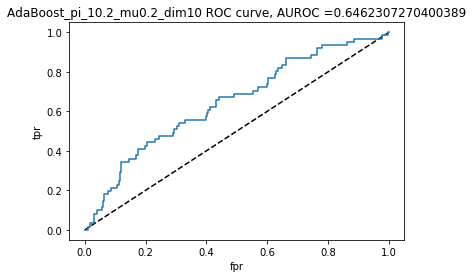

AUROC =  0.6462307270400389


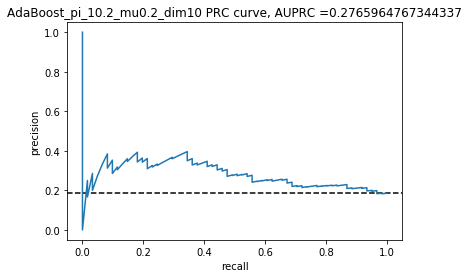

AUPRC =  0.2765964767344337
AdaBoost  for train_test split: AUROC =  0.6462307270400389 , AUPRC =  0.2765964767344337 , average precision = , 0.1994535519125683 . 
Best threshold for ROC =  0.4914848832189982 , accuracy for the best ROC threshold is then  0.5969696969696969 , accuracy =  0.796969696969697 . 
F1 score =  0.15189873417721517 , log loss =  7.012447314024782 , recall = 0.09836065573770492 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.4 , dim = 2  is 0.188 .


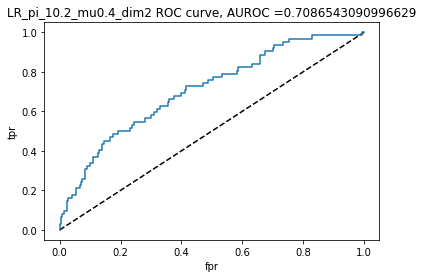

AUROC =  0.7086543090996629


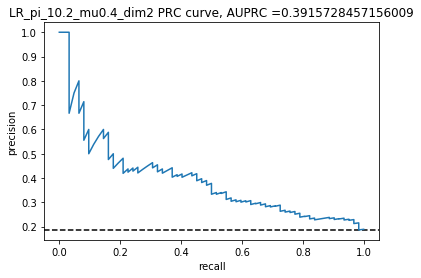

AUPRC =  0.3915728457156009
LR  for train_test split: AUROC =  0.7086543090996629 , AUPRC =  0.3915728457156009 , average precision = , 0.21507820136852393 . 
Best threshold for ROC =  0.17855363746613417 , accuracy for the best ROC threshold is then  0.6424242424242425 , accuracy =  0.8181818181818182 . 
F1 score =  0.0909090909090909 , log loss =  6.279779949369913 , recall = 0.04838709677419355 .
------------------------------------------------------------


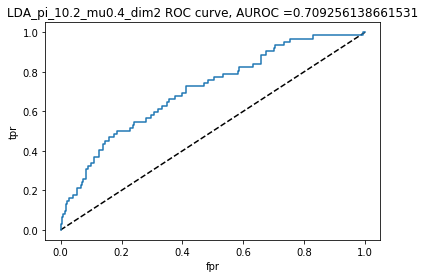

AUROC =  0.709256138661531


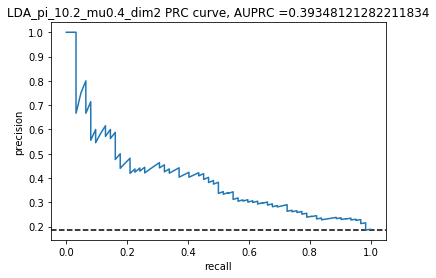

AUPRC =  0.39348121282211834
LDA  for train_test split: AUROC =  0.709256138661531 , AUPRC =  0.39348121282211834 , average precision = , 0.21507820136852393 . 
Best threshold for ROC =  0.17613619850317921 , accuracy for the best ROC threshold is then  0.6484848484848484 , accuracy =  0.8181818181818182 . 
F1 score =  0.0909090909090909 , log loss =  6.279779949369913 , recall = 0.04838709677419355 .
------------------------------------------------------------


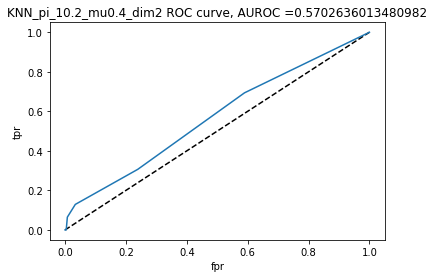

AUROC =  0.5702636013480982


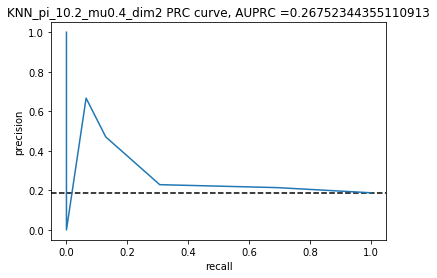

AUPRC =  0.26752344355110913
KNN  for train_test split: AUROC =  0.5702636013480982 , AUPRC =  0.26752344355110913 , average precision = , 0.22435742625495947 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6757575757575758 , accuracy =  0.8090909090909091 . 
F1 score =  0.20253164556962025 , log loss =  6.593788209867409 , recall = 0.12903225806451613 .
------------------------------------------------------------


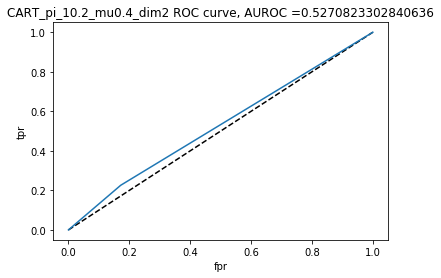

AUROC =  0.5270823302840636


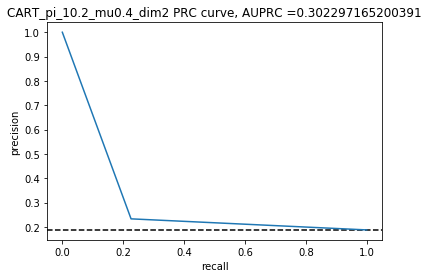

AUPRC =  0.302297165200391
CART  for train_test split: AUROC =  0.5270823302840636 , AUPRC =  0.302297165200391 , average precision = , 0.1981427174975562 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8121212121212121 , accuracy =  0.7151515151515152 . 
F1 score =  0.22950819672131148 , log loss =  9.838429583646645 , recall = 0.22580645161290322 .
------------------------------------------------------------


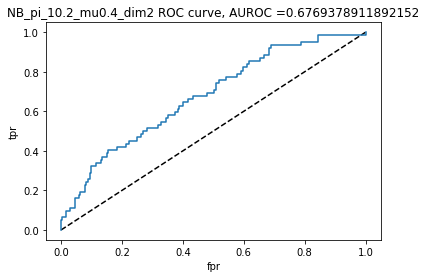

AUROC =  0.6769378911892152


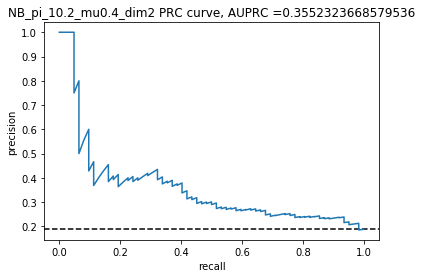

AUPRC =  0.3552323668579536
NB  for train_test split: AUROC =  0.6769378911892152 , AUPRC =  0.3552323668579536 , average precision = , 0.21507820136852393 . 
Best threshold for ROC =  0.16294395051001867 , accuracy for the best ROC threshold is then  0.6151515151515151 , accuracy =  0.8181818181818182 . 
F1 score =  0.0909090909090909 , log loss =  6.279779949369913 , recall = 0.04838709677419355 .
------------------------------------------------------------


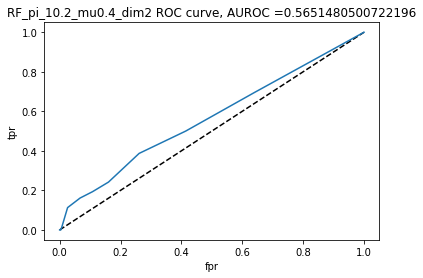

AUROC =  0.5651480500722196


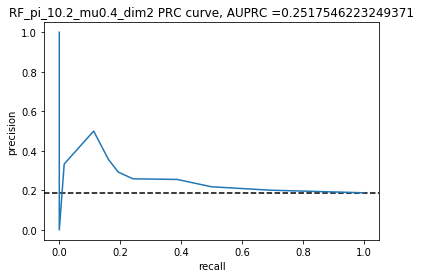

AUPRC =  0.2517546223249371
RF  for train_test split: AUROC =  0.5651480500722196 , AUPRC =  0.2517546223249371 , average precision = , 0.21517944421170226 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6727272727272727 , accuracy =  0.7878787878787878 . 
F1 score =  0.2222222222222222 , log loss =  7.326450728477247 , recall = 0.16129032258064516 .
------------------------------------------------------------


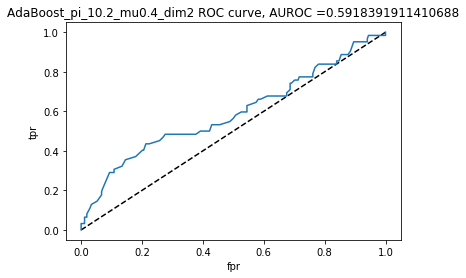

AUROC =  0.5918391911410688


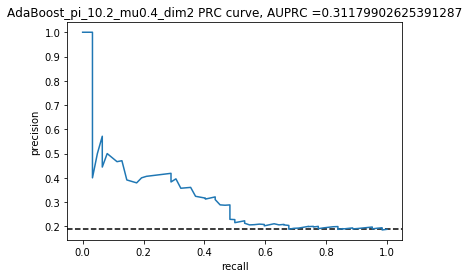

AUPRC =  0.31179902625391287
AdaBoost  for train_test split: AUROC =  0.5918391911410688 , AUPRC =  0.31179902625391287 , average precision = , 0.22435742625495947 . 
Best threshold for ROC =  0.4910753533662731 , accuracy for the best ROC threshold is then  0.5484848484848485 , accuracy =  0.8090909090909091 . 
F1 score =  0.20253164556962025 , log loss =  6.593788209867409 , recall = 0.12903225806451613 .
------------------------------------------------------------
The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  KNN
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.4 , dim = 4  is 0.229 .


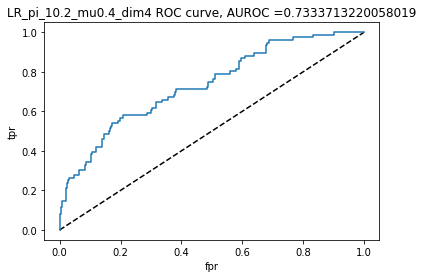

AUROC =  0.7333713220058019


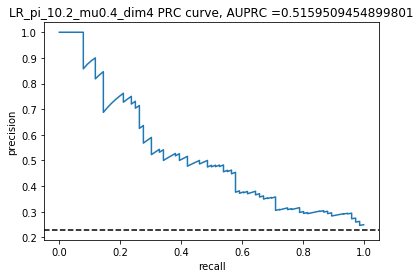

AUPRC =  0.5159509454899801
LR  for train_test split: AUROC =  0.7333713220058019 , AUPRC =  0.5159509454899801 , average precision = , 0.34411968656819913 . 
Best threshold for ROC =  0.23344930418355975 , accuracy for the best ROC threshold is then  0.6606060606060606 , accuracy =  0.803030303030303 . 
F1 score =  0.3434343434343434 , log loss =  6.803106858344774 , recall = 0.2236842105263158 .
------------------------------------------------------------


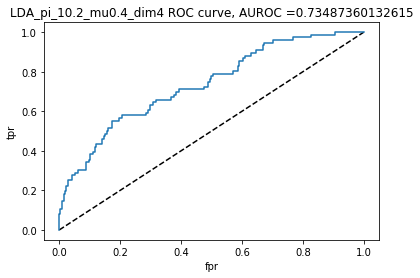

AUROC =  0.73487360132615


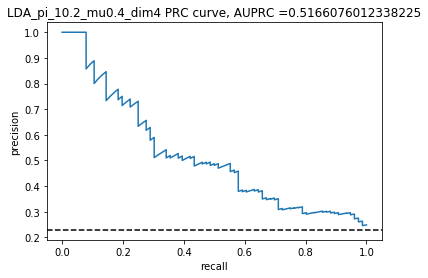

AUPRC =  0.5166076012338225
LDA  for train_test split: AUROC =  0.73487360132615 , AUPRC =  0.5166076012338225 , average precision = , 0.3258259284575074 . 
Best threshold for ROC =  0.2336639611834095 , accuracy for the best ROC threshold is then  0.6727272727272727 , accuracy =  0.796969696969697 . 
F1 score =  0.30927835051546393 , log loss =  7.012432775889687 , recall = 0.19736842105263158 .
------------------------------------------------------------


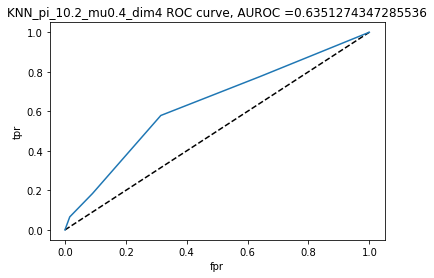

AUROC =  0.6351274347285536


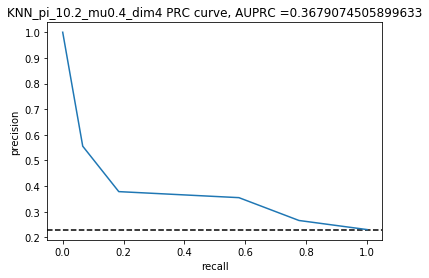

AUPRC =  0.3679074505899633
KNN  for train_test split: AUROC =  0.6351274347285536 , AUPRC =  0.3679074505899633 , average precision = , 0.2575800681063839 . 
Best threshold for ROC =  0.4 , accuracy for the best ROC threshold is then  0.7424242424242424 , accuracy =  0.7424242424242424 . 
F1 score =  0.247787610619469 , log loss =  8.896407225176674 , recall = 0.18421052631578946 .
------------------------------------------------------------


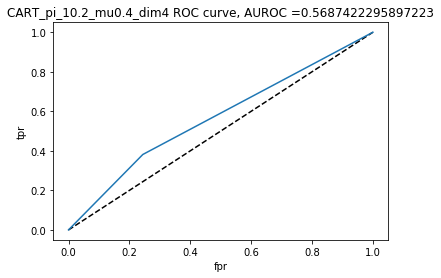

AUROC =  0.5687422295897223


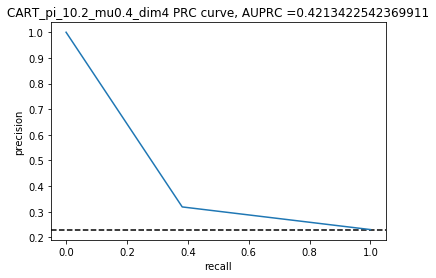

AUPRC =  0.4213422542369911
CART  for train_test split: AUROC =  0.5687422295897223 , AUPRC =  0.4213422542369911 , average precision = , 0.26402632455264036 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.7696969696969697 , accuracy =  0.6696969696969697 . 
F1 score =  0.3473053892215569 , log loss =  11.408412733593746 , recall = 0.3815789473684211 .
------------------------------------------------------------


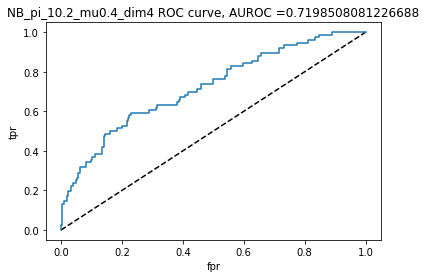

AUROC =  0.7198508081226688


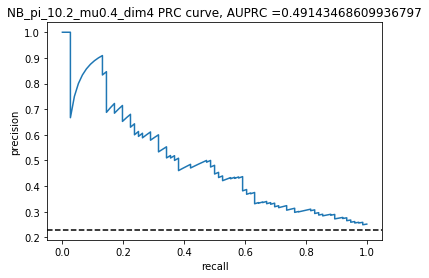

AUPRC =  0.49143468609936797
NB  for train_test split: AUROC =  0.7198508081226688 , AUPRC =  0.49143468609936797 , average precision = , 0.3250429395166238 . 
Best threshold for ROC =  0.22661376726222174 , accuracy for the best ROC threshold is then  0.6242424242424243 , accuracy =  0.793939393939394 . 
F1 score =  0.3333333333333333 , log loss =  7.1171030037296905 , recall = 0.2236842105263158 .
------------------------------------------------------------


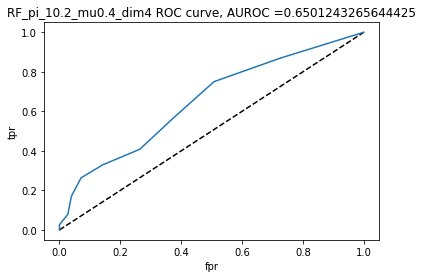

AUROC =  0.6501243265644425


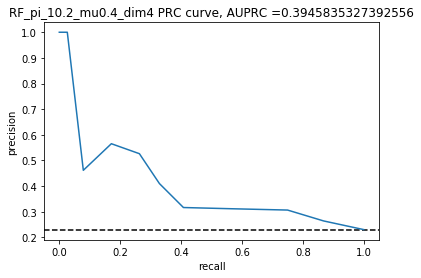

AUPRC =  0.3945835327392556
RF  for train_test split: AUROC =  0.6501243265644425 , AUPRC =  0.3945835327392556 , average precision = , 0.30820112482162343 . 
Best threshold for ROC =  0.3 , accuracy for the best ROC threshold is then  0.6606060606060606 , accuracy =  0.7757575757575758 . 
F1 score =  0.35087719298245607 , log loss =  7.745102563567073 , recall = 0.2631578947368421 .
------------------------------------------------------------


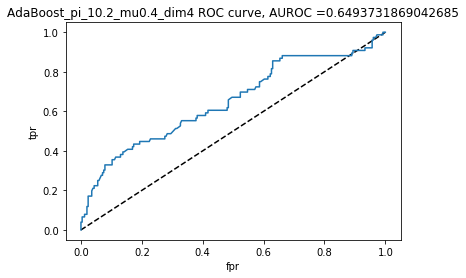

AUROC =  0.6493731869042685


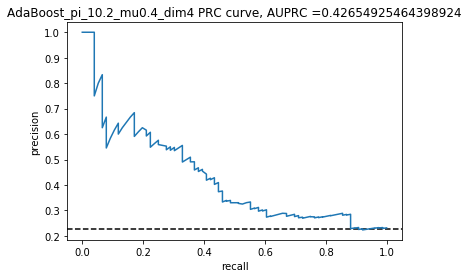

AUPRC =  0.42654925464398924
AdaBoost  for train_test split: AUROC =  0.6493731869042685 , AUPRC =  0.42654925464398924 , average precision = , 0.32284688995215316 . 
Best threshold for ROC =  0.49292439652224185 , accuracy for the best ROC threshold is then  0.5878787878787879 , accuracy =  0.7818181818181819 . 
F1 score =  0.37931034482758624 , log loss =  7.53577664602216 , recall = 0.2894736842105263 .
------------------------------------------------------------
The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LR
The best model measured by  f1 is  AdaBoost
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.4 , dim = 6  is 0.186 .


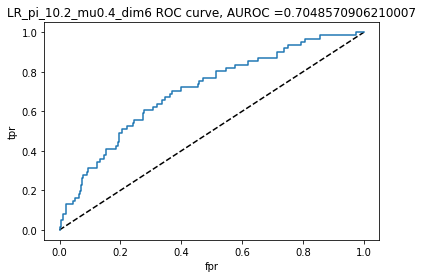

AUROC =  0.7048570906210007


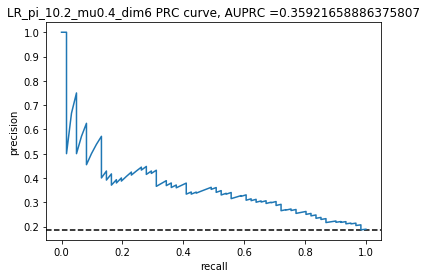

AUPRC =  0.35921658886375807
LR  for train_test split: AUROC =  0.7048570906210007 , AUPRC =  0.35921658886375807 , average precision = , 0.21584699453551912 . 
Best threshold for ROC =  0.19215934190398698 , accuracy for the best ROC threshold is then  0.6575757575757576 , accuracy =  0.8151515151515152 . 
F1 score =  0.1643835616438356 , log loss =  6.384455023254949 , recall = 0.09836065573770492 .
------------------------------------------------------------


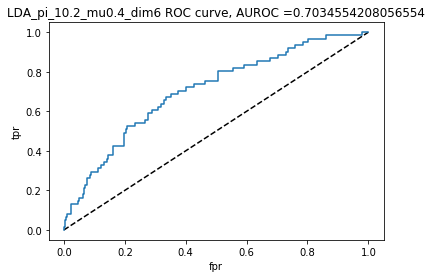

AUROC =  0.7034554208056554


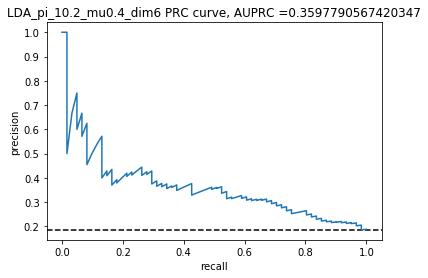

AUPRC =  0.3597790567420347
LDA  for train_test split: AUROC =  0.7034554208056554 , AUPRC =  0.3597790567420347 , average precision = , 0.20695479384003976 . 
Best threshold for ROC =  0.19051077422978077 , accuracy for the best ROC threshold is then  0.6636363636363637 , accuracy =  0.8121212121212121 . 
F1 score =  0.13888888888888887 , log loss =  6.4891179820274045 , recall = 0.08196721311475409 .
------------------------------------------------------------


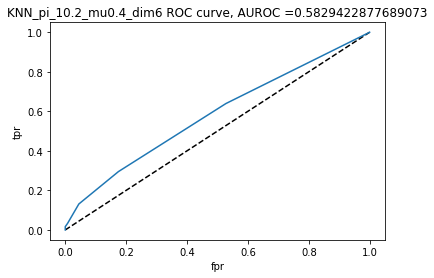

AUROC =  0.5829422877689073


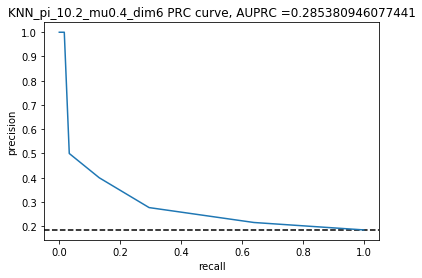

AUPRC =  0.285380946077441
KNN  for train_test split: AUROC =  0.5829422877689073 , AUPRC =  0.285380946077441 , average precision = , 0.21306507699950322 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.7272727272727273 , accuracy =  0.803030303030303 . 
F1 score =  0.19753086419753088 , log loss =  6.803121396479869 , recall = 0.13114754098360656 .
------------------------------------------------------------


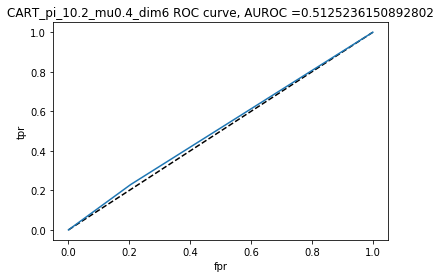

AUROC =  0.5125236150892802


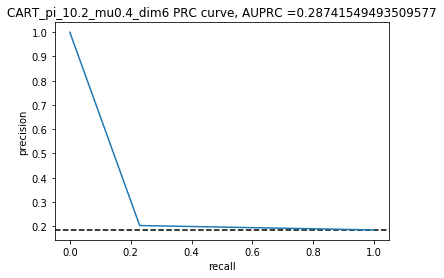

AUPRC =  0.28741549493509577
CART  for train_test split: AUROC =  0.5125236150892802 , AUPRC =  0.28741549493509577 , average precision = , 0.18899112291842157 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8151515151515152 , accuracy =  0.6909090909090909 . 
F1 score =  0.2153846153846154 , log loss =  10.67575506102894 , recall = 0.22950819672131148 .
------------------------------------------------------------


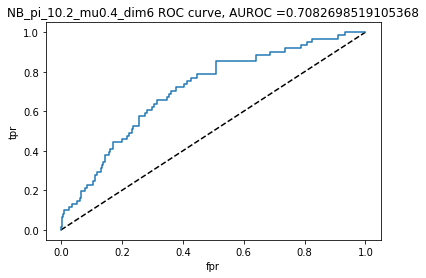

AUROC =  0.7082698519105368


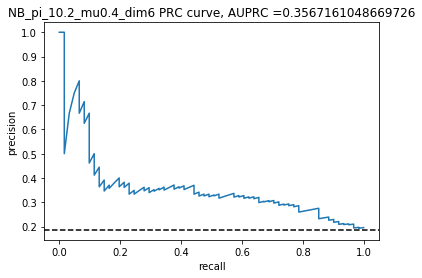

AUPRC =  0.3567161048669726
NB  for train_test split: AUROC =  0.7082698519105368 , AUPRC =  0.3567161048669726 , average precision = , 0.22092647789369102 . 
Best threshold for ROC =  0.19067473250304337 , accuracy for the best ROC threshold is then  0.6545454545454545 , accuracy =  0.8212121212121212 . 
F1 score =  0.14492753623188404 , log loss =  6.175121836642488 , recall = 0.08196721311475409 .
------------------------------------------------------------


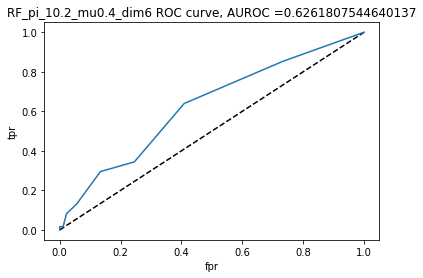

AUROC =  0.6261807544640137


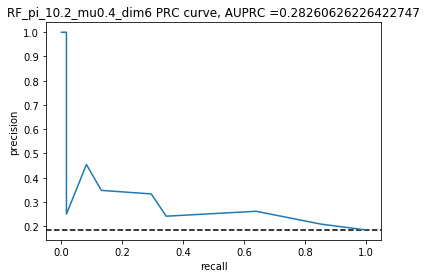

AUPRC =  0.28260626226422747
RF  for train_test split: AUROC =  0.6261807544640137 , AUPRC =  0.28260626226422747 , average precision = , 0.20695479384003976 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6787878787878788 , accuracy =  0.8121212121212121 . 
F1 score =  0.13888888888888887 , log loss =  6.4891179820274045 , recall = 0.08196721311475409 .
------------------------------------------------------------


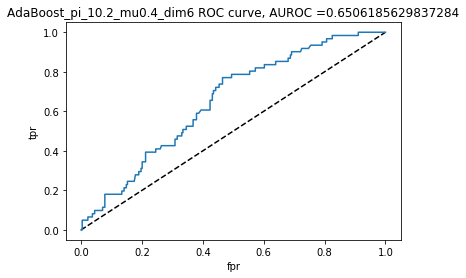

AUROC =  0.6506185629837284


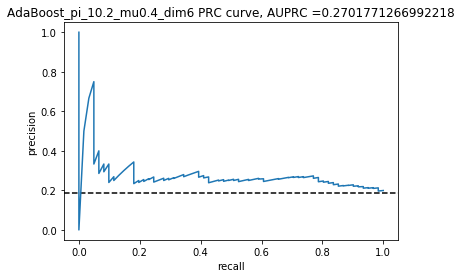

AUPRC =  0.2701771266992218
AdaBoost  for train_test split: AUROC =  0.6506185629837284 , AUPRC =  0.2701771266992218 , average precision = , 0.1912568306010929 . 
Best threshold for ROC =  0.4905095218884835 , accuracy for the best ROC threshold is then  0.6090909090909091 , accuracy =  0.7787878787878788 . 
F1 score =  0.1411764705882353 , log loss =  7.640439604794617 , recall = 0.09836065573770492 .
------------------------------------------------------------
The best model measured by  AUROC is  NB
The best model measured by  AUPRC is  LDA
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  NB
The best model measured by  average_precision is  NB
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  NB
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.4 , dim = 8  is 0.201 .


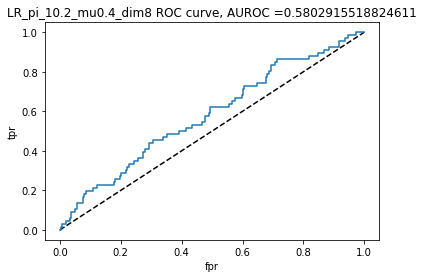

AUROC =  0.5802915518824611


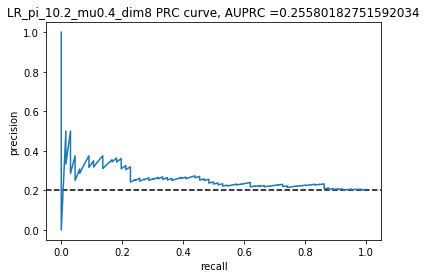

AUPRC =  0.25580182751592034
LR  for train_test split: AUROC =  0.5802915518824611 , AUPRC =  0.25580182751592034 , average precision = , 0.2105263157894737 . 
Best threshold for ROC =  0.1698921554873326 , accuracy for the best ROC threshold is then  0.5363636363636364 , accuracy =  0.7787878787878788 . 
F1 score =  0.1411764705882353 , log loss =  7.640427489682039 , recall = 0.09090909090909091 .
------------------------------------------------------------


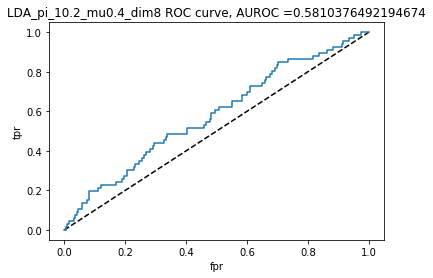

AUROC =  0.5810376492194674


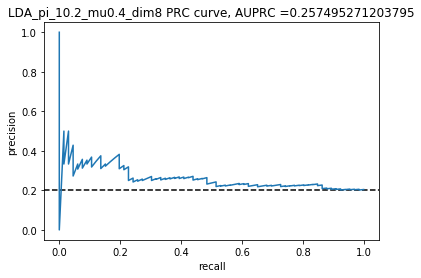

AUPRC =  0.257495271203795
LDA  for train_test split: AUROC =  0.5810376492194674 , AUPRC =  0.257495271203795 , average precision = , 0.21414141414141416 . 
Best threshold for ROC =  0.1702166985662497 , accuracy for the best ROC threshold is then  0.5363636363636364 , accuracy =  0.7787878787878788 . 
F1 score =  0.16091954022988506 , log loss =  7.640429912704554 , recall = 0.10606060606060606 .
------------------------------------------------------------


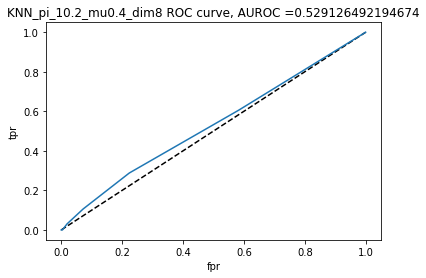

AUROC =  0.529126492194674


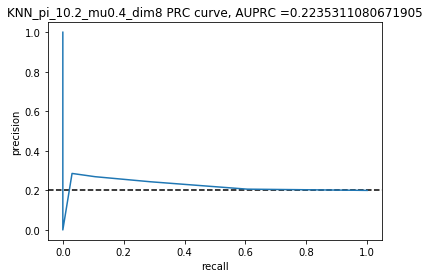

AUPRC =  0.2235311080671905
KNN  for train_test split: AUROC =  0.529126492194674 , AUPRC =  0.2235311080671905 , average precision = , 0.20734265734265736 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6787878787878788 , accuracy =  0.7636363636363637 . 
F1 score =  0.15217391304347827 , log loss =  8.163756821679415 , recall = 0.10606060606060606 .
------------------------------------------------------------


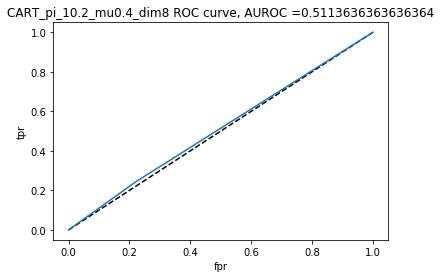

AUROC =  0.5113636363636364


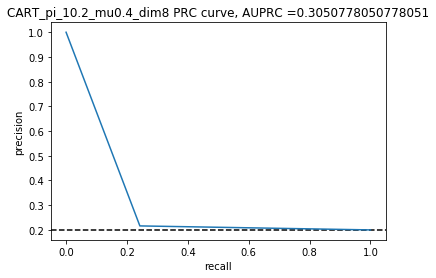

AUPRC =  0.3050778050778051
CART  for train_test split: AUROC =  0.5113636363636364 , AUPRC =  0.3050778050778051 , average precision = , 0.20393120393120395 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8 , accuracy =  0.6727272727272727 . 
F1 score =  0.22857142857142856 , log loss =  11.303740082731228 , recall = 0.24242424242424243 .
------------------------------------------------------------


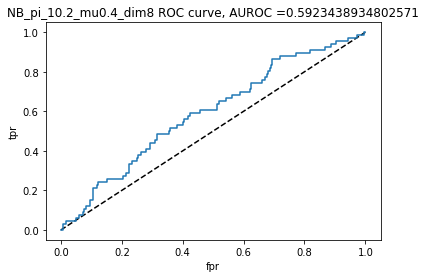

AUROC =  0.5923438934802571


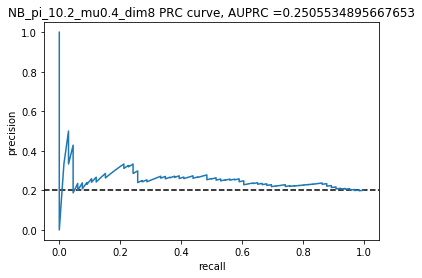

AUPRC =  0.2505534895667653
NB  for train_test split: AUROC =  0.5923438934802571 , AUPRC =  0.2505534895667653 , average precision = , 0.2 . 
Best threshold for ROC =  0.18852854822734996 , accuracy for the best ROC threshold is then  0.5787878787878787 , accuracy =  0.7727272727272727 . 
F1 score =  0.07407407407407407 , log loss =  7.849750984204435 , recall = 0.045454545454545456 .
------------------------------------------------------------


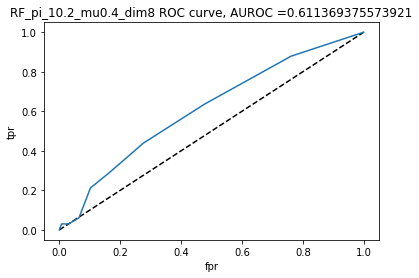

AUROC =  0.611369375573921


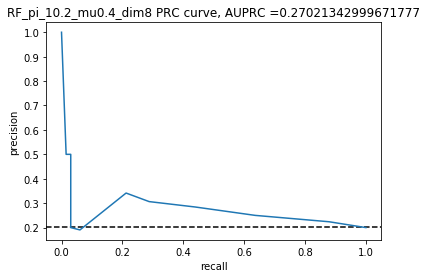

AUPRC =  0.27021342999671777
RF  for train_test split: AUROC =  0.611369375573921 , AUPRC =  0.27021342999671777 , average precision = , 0.19942279942279945 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6666666666666666 , accuracy =  0.7606060606060606 . 
F1 score =  0.09195402298850575 , log loss =  8.26841493440684 , recall = 0.06060606060606061 .
------------------------------------------------------------


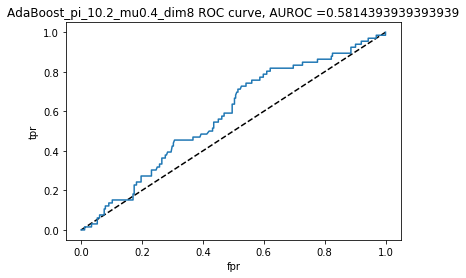

AUROC =  0.5814393939393939


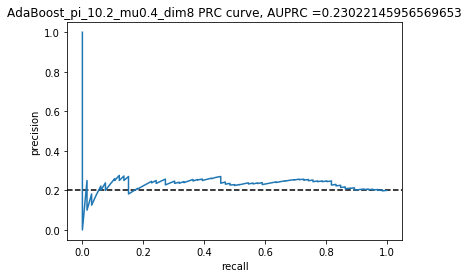

AUPRC =  0.23022145956569653
AdaBoost  for train_test split: AUROC =  0.5814393939393939 , AUPRC =  0.23022145956569653 , average precision = , 0.20757575757575758 . 
Best threshold for ROC =  0.4902601656894548 , accuracy for the best ROC threshold is then  0.5515151515151515 , accuracy =  0.7393939393939394 . 
F1 score =  0.18867924528301888 , log loss =  9.001087145106741 , recall = 0.15151515151515152 .
------------------------------------------------------------
The best model measured by  AUROC is  RF
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LR
The best model measured by  average_precision is  LDA
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LR
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.4 , dim = 10  is 0.217 .


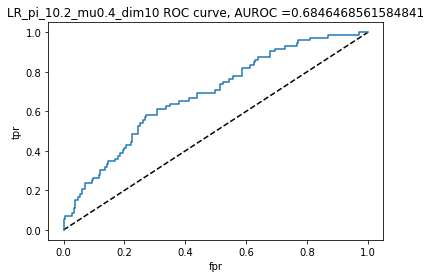

AUROC =  0.6846468561584841


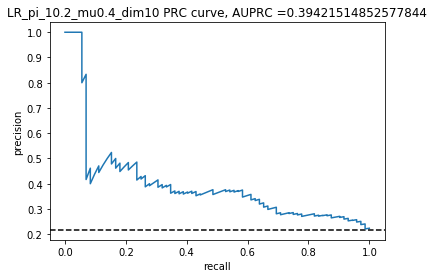

AUPRC =  0.39421514852577844
LR  for train_test split: AUROC =  0.6846468561584841 , AUPRC =  0.39421514852577844 , average precision = , 0.23950441919191917 . 
Best threshold for ROC =  0.20319596764463577 , accuracy for the best ROC threshold is then  0.6454545454545455 , accuracy =  0.7757575757575758 . 
F1 score =  0.1590909090909091 , log loss =  7.745080756364431 , recall = 0.09722222222222222 .
------------------------------------------------------------


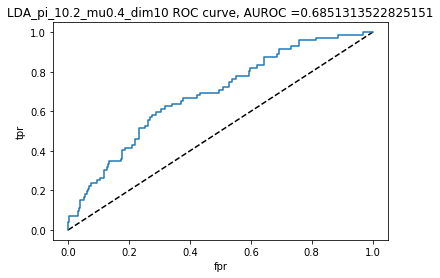

AUROC =  0.6851313522825151


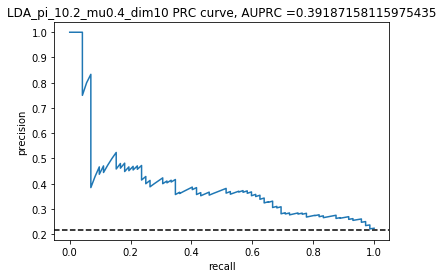

AUPRC =  0.39187158115975435
LDA  for train_test split: AUROC =  0.6851313522825151 , AUPRC =  0.39187158115975435 , average precision = , 0.2462269756387403 . 
Best threshold for ROC =  0.19778080677003096 , accuracy for the best ROC threshold is then  0.6333333333333333 , accuracy =  0.7787878787878788 . 
F1 score =  0.1797752808988764 , log loss =  7.640417797591974 , recall = 0.1111111111111111 .
------------------------------------------------------------


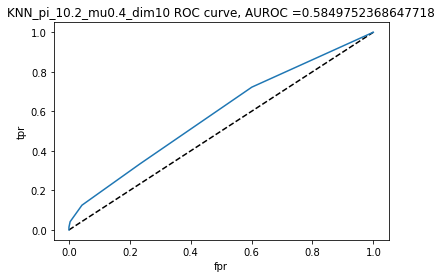

AUROC =  0.5849752368647718


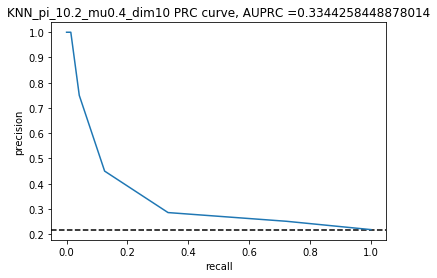

AUPRC =  0.3344258448878014
KNN  for train_test split: AUROC =  0.5849752368647718 , AUPRC =  0.3344258448878014 , average precision = , 0.24715909090909088 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6727272727272727 , accuracy =  0.7757575757575758 . 
F1 score =  0.1956521739130435 , log loss =  7.745085602409463 , recall = 0.125 .
------------------------------------------------------------


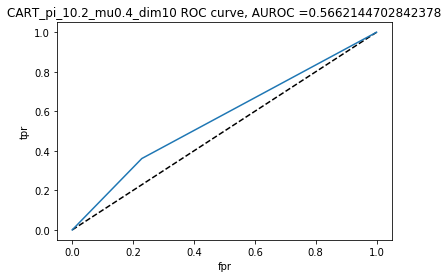

AUROC =  0.5662144702842378


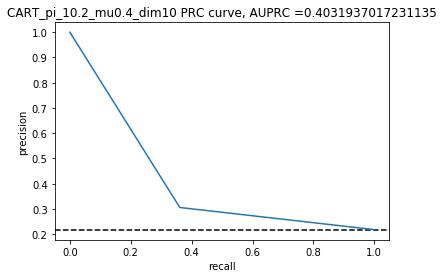

AUPRC =  0.4031937017231135
CART  for train_test split: AUROC =  0.5662144702842378 , AUPRC =  0.4031937017231135 , average precision = , 0.24985145573380868 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.7818181818181819 , accuracy =  0.6818181818181818 . 
F1 score =  0.33121019108280253 , log loss =  10.989753629436374 , recall = 0.3611111111111111 .
------------------------------------------------------------


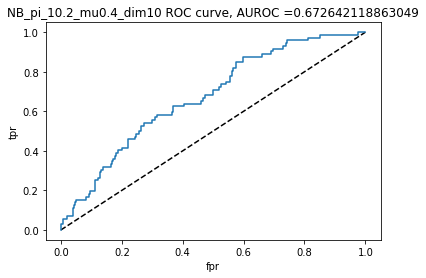

AUROC =  0.672642118863049


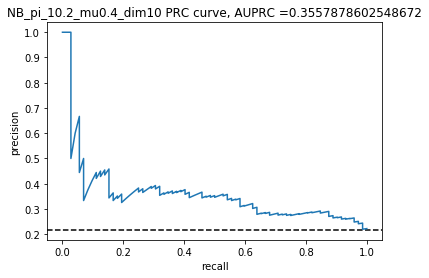

AUPRC =  0.3557878602548672
NB  for train_test split: AUROC =  0.672642118863049 , AUPRC =  0.3557878602548672 , average precision = , 0.23700237670825905 . 
Best threshold for ROC =  0.19344568993535002 , accuracy for the best ROC threshold is then  0.6272727272727273 , accuracy =  0.7727272727272727 . 
F1 score =  0.15730337078651685 , log loss =  7.849746138159404 , recall = 0.09722222222222222 .
------------------------------------------------------------


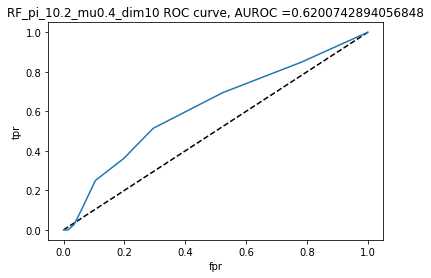

AUROC =  0.6200742894056848


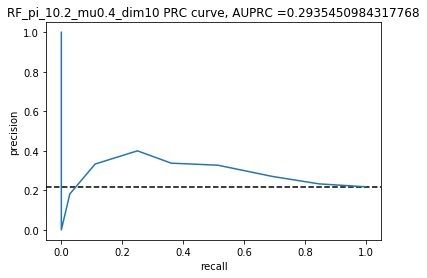

AUPRC =  0.2935450984317768
RF  for train_test split: AUROC =  0.6200742894056848 , AUPRC =  0.2935450984317768 , average precision = , 0.23097643097643095 . 
Best threshold for ROC =  0.3 , accuracy for the best ROC threshold is then  0.706060606060606 , accuracy =  0.7575757575757576 . 
F1 score =  0.16666666666666666 , log loss =  8.373075470156783 , recall = 0.1111111111111111 .
------------------------------------------------------------


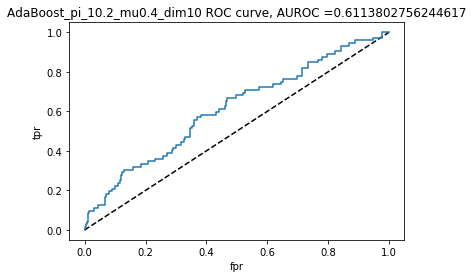

AUROC =  0.6113802756244617


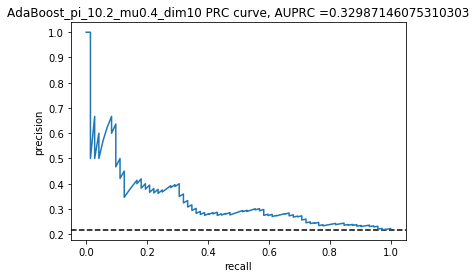

AUPRC =  0.32987146075310303
AdaBoost  for train_test split: AUROC =  0.6113802756244617 , AUPRC =  0.32987146075310303 , average precision = , 0.2535353535353535 . 
Best threshold for ROC =  0.4903073381528741 , accuracy for the best ROC threshold is then  0.6 , accuracy =  0.7606060606060606 . 
F1 score =  0.26168224299065423 , log loss =  8.268424626496902 , recall = 0.19444444444444445 .
------------------------------------------------------------
The best model measured by  AUROC is  LDA
The best model measured by  AUPRC is  CART
The best model measured by  accuracy_best_threshold is  CART
The best model measured by  accuracy is  LDA
The best model measured by  average_precision is  AdaBoost
The best model measured by  f1 is  CART
The best model measured by  log_loss_score is  LDA
The best model measured by  recall is  CART
Positive ratio for pi_1 = 0.2 , mu = 0.6 , dim = 2  is 0.187 .


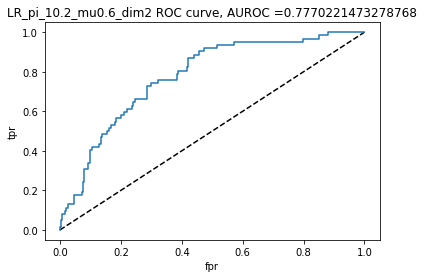

AUROC =  0.7770221473278768


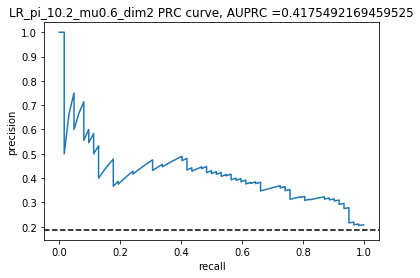

AUPRC =  0.4175492169459525
LR  for train_test split: AUROC =  0.7770221473278768 , AUPRC =  0.4175492169459525 , average precision = , 0.2296074892849086 . 
Best threshold for ROC =  0.2042938336438672 , accuracy for the best ROC threshold is then  0.7121212121212122 , accuracy =  0.8 . 
F1 score =  0.25 , log loss =  6.907791624319873 , recall = 0.1774193548387097 .
------------------------------------------------------------


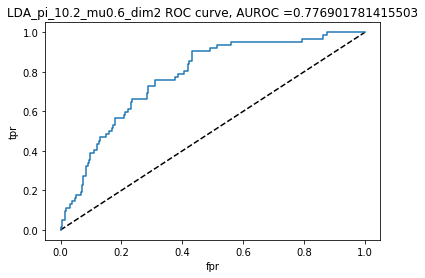

AUROC =  0.776901781415503


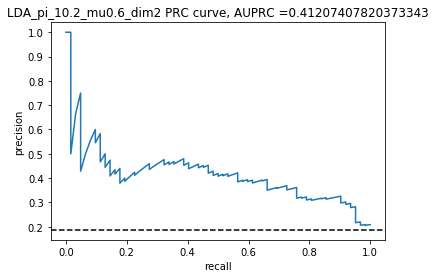

AUPRC =  0.41207407820373343
LDA  for train_test split: AUROC =  0.776901781415503 , AUPRC =  0.41207407820373343 , average precision = , 0.2296074892849086 . 
Best threshold for ROC =  0.20441643653519695 , accuracy for the best ROC threshold is then  0.7121212121212122 , accuracy =  0.8 . 
F1 score =  0.25 , log loss =  6.907791624319873 , recall = 0.1774193548387097 .
------------------------------------------------------------


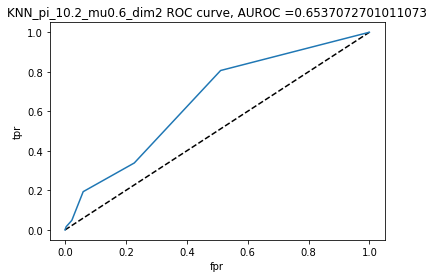

AUROC =  0.6537072701011073


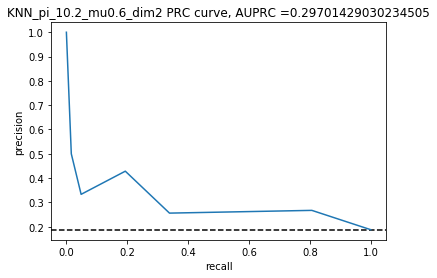

AUPRC =  0.29701429030234505
KNN  for train_test split: AUROC =  0.6537072701011073 , AUPRC =  0.29701429030234505 , average precision = , 0.23446446027091183 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6909090909090909 , accuracy =  0.8 . 
F1 score =  0.26666666666666666 , log loss =  6.9077940473423896 , recall = 0.1935483870967742 .
------------------------------------------------------------


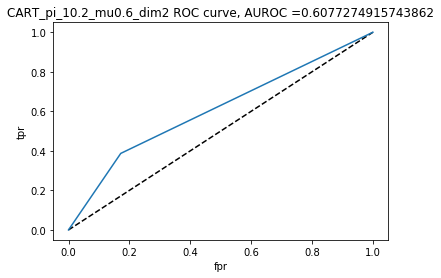

AUROC =  0.6077274915743862


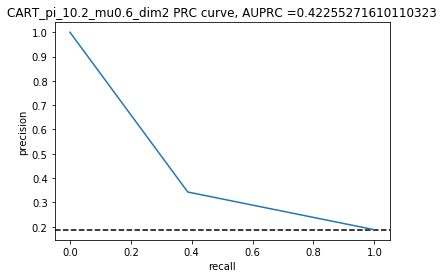

AUPRC =  0.42255271610110323
CART  for train_test split: AUROC =  0.6077274915743862 , AUPRC =  0.42255271610110323 , average precision = , 0.24787040916073172 . 
Best threshold for ROC =  1.0 , accuracy for the best ROC threshold is then  0.8121212121212121 , accuracy =  0.7454545454545455 . 
F1 score =  0.3636363636363636 , log loss =  8.79179999592208 , recall = 0.3870967741935484 .
------------------------------------------------------------


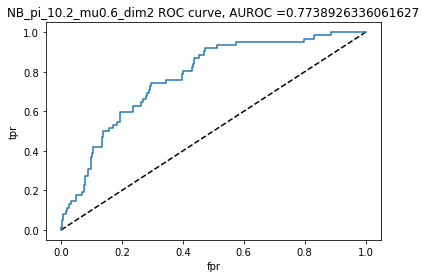

AUROC =  0.7738926336061627


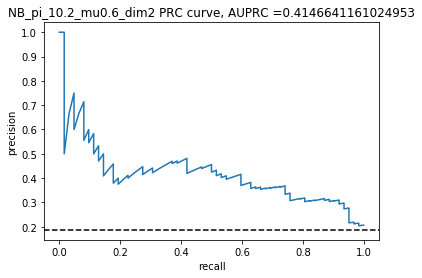

AUPRC =  0.4146641161024953
NB  for train_test split: AUROC =  0.7738926336061627 , AUPRC =  0.4146641161024953 , average precision = , 0.22770198478473372 . 
Best threshold for ROC =  0.20468348320620647 , accuracy for the best ROC threshold is then  0.7121212121212122 , accuracy =  0.803030303030303 . 
F1 score =  0.23529411764705882 , log loss =  6.803123819502384 , recall = 0.16129032258064516 .
------------------------------------------------------------


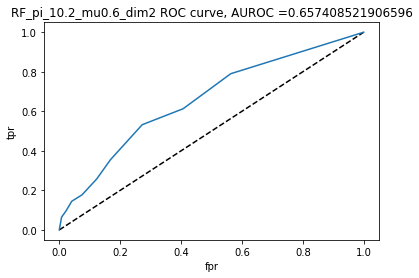

AUROC =  0.657408521906596


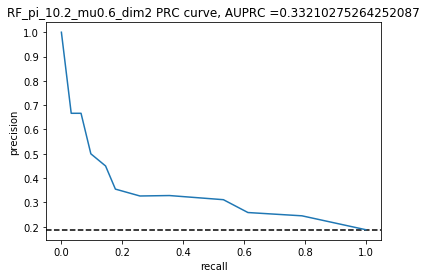

AUPRC =  0.33210275264252087
RF  for train_test split: AUROC =  0.657408521906596 , AUPRC =  0.33210275264252087 , average precision = , 0.21750070948822248 . 
Best threshold for ROC =  0.2 , accuracy for the best ROC threshold is then  0.6909090909090909 , accuracy =  0.7848484848484848 . 
F1 score =  0.2365591397849463 , log loss =  7.431118533294735 , recall = 0.1774193548387097 .
------------------------------------------------------------


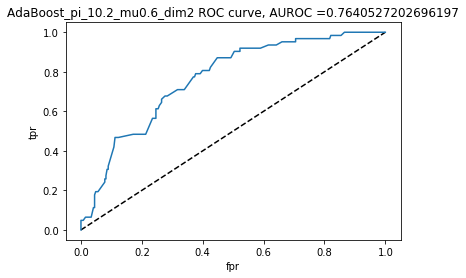

AUROC =  0.7640527202696197


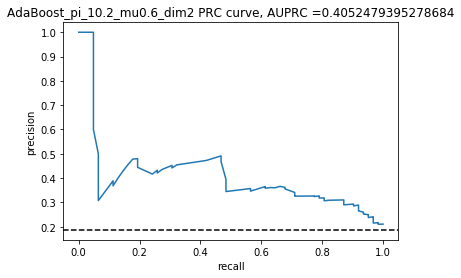

In [ ]:
# can tune parameters here and see different results
for pi_1 in [0.1, 0.2, 0.3, 0.4, 0.5]:
    for mu in [0.2, 0.4, 0.6, 0.8, 1]:
        for dim in [2, 4, 6, 8, 10]:
            simulation_results(pi_1, mu, dim, N = 1000)